# import packages

In [3]:
library(DESeq2)
library(data.table)
library(dplyr)
library(ChIPseeker)
library(TxDb.Hsapiens.UCSC.hg38.knownGene)
library(EnsDb.Hsapiens.v75)
library(clusterProfiler)
library(AnnotationDbi)
library(org.Hs.eg.db)
library(ggplot2)
library(gridExtra)
library(IRdisplay)
library(ChIPpeakAnno)
library(IRdisplay)
library(ggpubr)
library(kableExtra)
library(tidyverse)
library(readxl)
library(corrplot)
library(ggrepel)
library(fgsea)
library(ggvenn)
library(ComplexHeatmap)
library(ggVennDiagram)
library(venneuler)
library(DT)
library(tools)
library(tidyverse)
library(EBSeqHMM)

library(edgeR)

txdb <- TxDb.Hsapiens.UCSC.hg38.knownGene


In [4]:
source('~/script/utils.r')
setwd('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan//')
base_dir = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/' 


In [5]:
cell_types = c('HSC', 'MPP', 'CMP', 'GMP', 'MEP', 'CLP', 'EB', 'MK')

In [6]:
sample_names = c('HSC1', 'HSC2', 'HSC3', 'MPP1', 'MPP2', 'MPP3', 'CMP1', 'CMP2', 
                 'CMP3', 'GMP1', 'GMP2', 'GMP3', 'MEP1', 'MEP2', 'MEP3', 'MEP4', 'CLP1', 'CLP2', 'CLP3', 'EB1', 
                 'EB2', 'EB3', 'MK1', 'MK2', 'MK3')
sample_names_n24 = c('HSC1', 'HSC2', 'HSC3', 'MPP1', 'MPP2', 'MPP3', 'CMP1', 'CMP2', 
                 'CMP3', 'GMP1', 'GMP2', 'GMP3', 'MEP1', 'MEP2', 'MEP3', 'MEP4', 'CLP1', 'CLP3', 'EB1', 
                 'EB2', 'EB3', 'MK1', 'MK2', 'MK3')


# import the data for partly run this notebook

In [7]:
mtx_all_df = readRDS('data/mtx_all_df.rds')
dsn_all_df = readRDS('data/dsn_all_df.rds')

dsn_all = as.data.table(dsn_all_df, keep.rownames = T)

dge_all      = readRDS('data/dge_all_may1.rds')
fit_all      = readRDS('data/fit_all_may1.rds')
logcpm_all_t = readRDS('data/logcpm_all_t_may1.rds') 
logcpm_all   = readRDS('data/logcpm_all_may1.rds') 

dge_coding      = readRDS('data/dge_coding_may1.rds') 
fit_coding      = readRDS('data/fit_coding_may1.rds') 
deg_coding_dt   = readRDS('data/fit_coding_may1.rds') 
logcpm_coding_t = readRDS('data/logcpm_coding_t_may1.rds') 
logcpm_coding   = readRDS('data/logcpm_coding_may1.rds') 


dge_te      = readRDS('data/dge_te_may1.rds')
fit_te      = readRDS('data/fit_te_may1.rds')
deg_te_dt   = readRDS('data/fit_te_may1.rds')
logcpm_te_t = readRDS('data/logcpm_te_t_may1.rds')
logcpm_te   = readRDS('data/logcpm_te_may1.rds')

coding_genes = read.table('coding_gene_list', header = F)$V1
te_genes = read.table('te_gene_list', header = F)$V1

mtx_coding_df = mtx_all_df[coding_genes, ]
mtx_te_df = mtx_all_df[!rownames(mtx_all_df) %in% coding_genes, ]

te_dt = readRDS('data/te_dt_may08.rds')

telocal_sel_seqino_ann = fread('data/telocal_sel_seqino_ann.tsv')
telocal_sel = fread('data/telocal_sel_seqino.tsv')


In [8]:
dsn_sel = dsn_all_df[rownames(dsn_all_df) != 'CLP2', , drop = F]
mtx_coding_sel = as.matrix(mtx_coding_df[, rownames(dsn_sel)])

In [9]:
base_dir2 = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/fastq/'
fname = paste0(base_dir2, 'ega_files.sh')
cmd_dt = fread(fname, header = F)


In [10]:
cmd_dt[, res_file := paste0(base_dir2, sub('\\&', '', V7))]
head(cmd_dt)

V1,V2,V3,V4,V5,V6,V7,res_file
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
pyega3,-cf,credential_file.json,files,EGAD00001000745,2>,EGAD00001000745_all_files&,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/fastq/EGAD00001000745_all_files
pyega3,-cf,credential_file.json,files,EGAD00001000903,2>,EGAD00001000903_all_files&,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/fastq/EGAD00001000903_all_files
pyega3,-cf,credential_file.json,files,EGAD00001000907,2>,EGAD00001000907_all_files&,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/fastq/EGAD00001000907_all_files
pyega3,-cf,credential_file.json,files,EGAD00001000911,2>,EGAD00001000911_all_files&,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/fastq/EGAD00001000911_all_files
pyega3,-cf,credential_file.json,files,EGAD00001000915,2>,EGAD00001000915_all_files&,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/fastq/EGAD00001000915_all_files
pyega3,-cf,credential_file.json,files,EGAD00001000918,2>,EGAD00001000918_all_files&,/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/fastq/EGAD00001000918_all_files


In [664]:
GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"
bin_tecount = '/home/whu78/conda3/envs/te/bin/'

dsn6[, tecount_jobname := paste0('tecount_', sample_name)]
dsn6[, tecount_oo := paste0(sample_dir, 'tecount_', sample_name, '_out')]
dsn6[, tecount_eo := paste0(sample_dir, 'tecount_', sample_name, '_err')]

dsn6[, tecount_cmd := paste0('bsub -J ', tecount_jobname, ' -n 10 -o ', tecount_oo, ' -e ', tecount_eo, ' -P ', PP, ' -R "rusage[mem=5GB]" ')]
dsn6[, tecount_cmd := paste0(tecount_cmd, ' -W 99:00')]
dsn6[, tecount_cmd := paste0(tecount_cmd, ' " cd ', sample_dir, ' && ', bin_tecount, 'TEcount --sortByPos --format BAM --mode multi -b ', bam_file)] 
#dsn6[, tecount_cmd := paste0(tecount_cmd, ' --GTF ', GTF_FILE, ' --TE ', TE_GTF_FILE, ' --project ', PP, '"')] 
dsn6[, tecount_cmd := paste0(tecount_cmd, ' --GTF ', GTF_FILE, ' --TE ', TE_GTF_FILE, ' --project tecount "')] 
#dsn6[, tecount_cmd := paste0(tecount_cmd, ' --outdir ', tecount_dir)]

#write(dsn6[count_file == 'Yes', tecount_cmd], file = paste0(base_dir, 'run_tecount.sh'))
write(dsn6[, tecount_cmd], file = paste0(base_dir, 'run_', PP, '_tecount.sh'))


In [665]:
getwd()
base_dir

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan"

[1] "/research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/"

In [791]:
GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
#TE_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"
#TE_loc_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/T2T-CHM13_v2_rmsk_TE.gtf.locInd"
#TE_loc_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/data/T2T_CHM13_v2_rmsk_TE.gtf.locInd"

TE_GTF_FILE = '/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf'
TE_loc_GTF_FILE = '/research/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/T2T_CHM13_v2_rmsk_TE.gtf.locInd'

sif_telocal = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/images/telocal.sif'
bin_telocal = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/conda3/envs/snap/bin/'
exe_telocal = '/home/whu78/repos/TElocal/TElocal'
exe_telocal = '/home/whu78/conda3/envs/te/bin/TElocal'

dsn6[, telocal_jobname := paste0('telocal_', sample_name)]
dsn6[, telocal_oo := paste0(sample_dir, 'telocal_', sample_name, '_out')]
dsn6[, telocal_eo := paste0(sample_dir, 'telocal_', sample_name, '_err')]

dsn6[, telocal_cmd := paste0('bsub -J ', telocal_jobname, ' -n 10 -o ', telocal_oo, ' -e ', telocal_eo, ' -P ', PP, ' -R "rusage[mem=5GB]" ')]
dsn6[, telocal_cmd := paste0(telocal_cmd, ' -W 99:00')]
dsn6[, telocal_cmd := paste0(telocal_cmd, ' " cd ', sample_dir, ' && ', exe_telocal, ' --sortByPos -b ', bam_file)] 
dsn6[, telocal_cmd := paste0(telocal_cmd, ' --GTF ', GTF_FILE, ' --TE ', TE_loc_GTF_FILE, ' --stranded reverse --project ', PP, '"')] 
#dsn6[, telocal_cmd := paste0(telocal_cmd, ' --outdir ', telocal_dir)]

write(dsn6[count_file == 'Yes', telocal_cmd], file = paste0(base_dir, 'run_telocal.sh'))


In [801]:
write(dsn6[count_file == 'No', telocal_cmd], file = paste0(base_dir, 'run_telocal.sh'))


In [667]:
# renname file, the output name could determined by the --project above
dsn6[, telocal_count_file_ori := paste0(sample_dir, 'blueprint.cntTable')]
dsn6[, telocal_count_file := paste0(sample_dir, 'telocal_cntTable')]
dsn6[, cmd := paste0('mv ', telocal_count_file_ori, ' ',  telocal_count_file)]
tmp = dsn6[count_file == 'Yes', ] 
tmp[1, cmd]
write(tmp$cmd, file = paste0(base_dir, 'run_', PP, '_rename.sh'))


[1] "mv /research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/C250RACXX_lane1_3760_ATCACG_L001/blueprint.cntTable /research_jude/rgs01_jude/groups/jxugrp/home/common/Data_Public/RNA_seq/Blueprint_EGA_Data_EGAD00001000745_Transcriptional_Diversity_Human_Blood_progenitors_Chen_etal_Science_2014/huw/C250RACXX_lane1_3760_ATCACG_L001/telocal_cntTable"

In [30]:
dim(dsn_sel)

[1] 24  1

# run EBSeqHMM  with 2 conditions

## get Posterior P values

In [188]:
rs = rowSums(mtx_coding_sel)
gene_sel = names(rs[rs> 24*500]) 
length(gene_sel)


[1] 10876

In [189]:
dim(mtx_coding_sel)

[1] 57514    24

In [190]:
length(unique(deg_coding_dt$rn))
head(deg_coding_dt$rn)

[1] 42466

[1] "OR11K2P"      "LOC124906836" "RPL31P64"     "KRTAP6-1"     "PCDHA7"       "PRPF4BP1"

In [191]:
GeneMat = mtx_coding_sel[gene_sel, ]
dim(GeneMat)


[1] 10876    24

In [192]:
ii_cell_type = 'HSC'
cond = rep('Control', nrow(dsn_sel))
cond[dsn_sel$cell_type == ii_cell_type] = ii_cell_type
cond = factor(cond, levels = c(ii_cell_type, 'Control'))
cond

[1] HSC     HSC     HSC     Control Control Control Control Control Control Control Control Control Control Control Control Control Control Control Control Control Control Control
[23] Control Control
Levels: HSC Control

Initial number of DE patterns = 2
Final number of DE patterns = 2


In [194]:
length(EBDERes$DEfound)
head(EBDERes$DEfound)

[1] 115

[1] "ABCA13" "ABCB1"  "ADAM28" "AMN1"   "AMY2B"  "ANK3"

In [195]:
dim(EBDERes$PPMat)
head(EBDERes$PPMat)

[1] 10876     2

,PPEE,PPDE
A2M,0.9908664,0.009133626
AAAS,0.9964765,0.003523495
AACS,0.9913824,0.008617619
AAGAB,0.9967572,0.003242847
AAK1,0.9984105,0.001589503
AAMDC,0.9988701,0.001129930


In [196]:
summary(EBDERes$PPMat[EBDERes$DEfound, 'PPEE'])

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
0.000e+00 2.500e-07 2.637e-04 6.988e-03 7.194e-03 4.974e-02 

In [197]:
length(EBDERes$Status)
head(EBDERes$Status)

[1] 10876

A2M  AAAS  AACS AAGAB  AAK1 AAMDC 
 "EE"  "EE"  "EE"  "EE"  "EE"  "EE"

## get Posterior FC and construct summarized data table

In [208]:
length(GeneFC$PostFC)
head(GeneFC$PostFC)
head(GeneFC$RealFC)
length(GeneFC$RealFC)

[1] 10876

1.9034245
0.3835647
0.4607916
0.4468909
0.9682172
0.9828204


A2M      AAAS      AACS     AAGAB      AAK1     AAMDC 
1.9495913 0.3977097 0.4752304 0.4607452 0.9847576 0.9891903

[1] 10876

In [209]:
geneFC_dt = data.table(symbol = names(GeneFC$RealFC))
geneFC_dt[, realFC := GeneFC$RealFC]
geneFC_dt[, PostFC := GeneFC$PostFC]


In [210]:
geneFC_dt$PPEE = EBDERes$PPMat[geneFC_dt$symbol, 'PPEE']
geneFC_dt$PPDE = EBDERes$PPMat[geneFC_dt$symbol, 'PPDE']
geneFC_dt[, found := F] 
geneFC_dt[symbol %in% EBDERes$DEfound, found := T]


In [211]:
head(geneFC_dt)


symbol,realFC,PostFC,PPEE,PPDE,found
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>
A2M,1.9495913,1.9034245,0.9908664,0.009133626,FALSE
AAAS,0.3977097,0.3835647,0.9964765,0.003523495,FALSE
AACS,0.4752304,0.4607916,0.9913824,0.008617619,FALSE
AAGAB,0.4607452,0.4468909,0.9967572,0.003242847,FALSE
AAK1,0.9847576,0.9682172,0.9984105,0.001589503,FALSE
AAMDC,0.9891903,0.9828204,0.9988701,0.001129930,FALSE


In [212]:
# add DEGSeq results
deg_hmm = deg_coding_dt[.id == 'HSC', ]
deg_hmm = merge(geneFC_dt, deg_hmm, by.x = 'symbol', by.y = 'rn', all.x = T)
deg_hmm[, logRealFC := log2(realFC) ]
deg_hmm[, logPostFC := log2(PostFC) ]
deg_hmm[symbol %in% deg_coding_dt[.id == 'HSC', rn],  included := T]
deg_hmm[, sig := F]
deg_hmm[FDR < 0.05, sig :=T]
deg_hmm = deg_hmm[order(FDR), ]
head(deg_hmm)


symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,FDR,logRealFC,logPostFC,included,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>
HMGA2-AS1,7.085084,7.035641,1.103032e-25,1.0000000,TRUE,HSC,2.624279,4.016068,5.451008e-05,0.1348273,2.824785,2.814682,TRUE,FALSE
TNFSF10,7.148743,7.042690,9.279500e-08,0.9999999,TRUE,HSC,2.633429,4.065532,8.934764e-05,0.1473305,2.837690,2.816127,TRUE,FALSE
LOC101927745,7.220316,7.179128,2.197960e-22,1.0000000,TRUE,HSC,2.618232,4.814698,2.635155e-04,0.2744376,2.852062,2.843809,TRUE,FALSE
SETBP1,6.641344,6.561073,2.641374e-14,1.0000000,TRUE,HSC,2.572233,4.914974,2.994291e-04,0.2890222,2.731475,2.713932,TRUE,FALSE
MECOM,6.487600,6.451549,1.946782e-23,1.0000000,TRUE,HSC,2.457369,5.483692,3.674771e-04,0.2916709,2.697685,2.689646,TRUE,FALSE
PREX2,6.315690,6.255410,4.818166e-14,1.0000000,TRUE,HSC,2.467208,3.669218,3.603965e-04,0.2916709,2.658940,2.645105,TRUE,FALSE


In [213]:
summary(deg_hmm[found == T, logPostFC])

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.8602  1.6304  1.8343  1.9311  2.2709  3.3481 

In [214]:
table(deg_hmm$found, deg_hmm$sig)

       
        FALSE
  FALSE 10761
  TRUE    115

In [215]:
deg_hmm[sig == T, ]

symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,FDR,logRealFC,logPostFC,included,sig
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>


In [216]:
summary(deg_hmm$logPostFC)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-11.0958  -0.8556  -0.2605  -0.4048   0.2650   3.3481 

In [217]:
summary(deg_hmm$logFC)


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-12.9469  -1.0695  -0.4848  -0.6027   0.0478   3.1292 

In [227]:
datatable(deg_hmm[found == T, ])

HTML widgets cannot be represented in plain text (need html)

## comparing plot with DEG

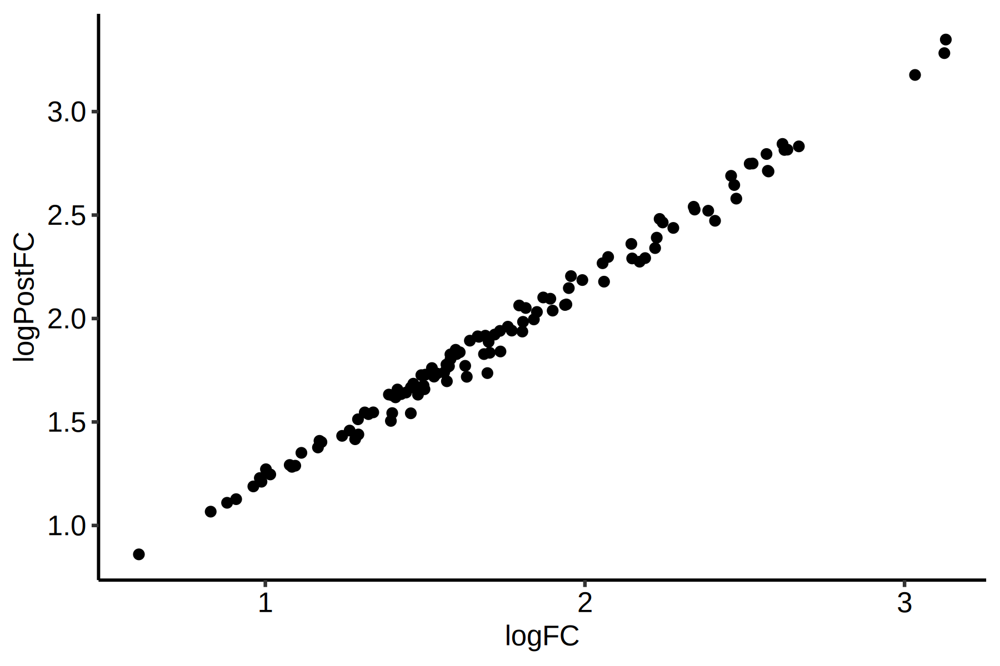

In [223]:
plotdat = deg_hmm[found == T, ]
ggplot(plotdat, aes(x = logFC, y = logPostFC)) + geom_point() + theme_pubr() 


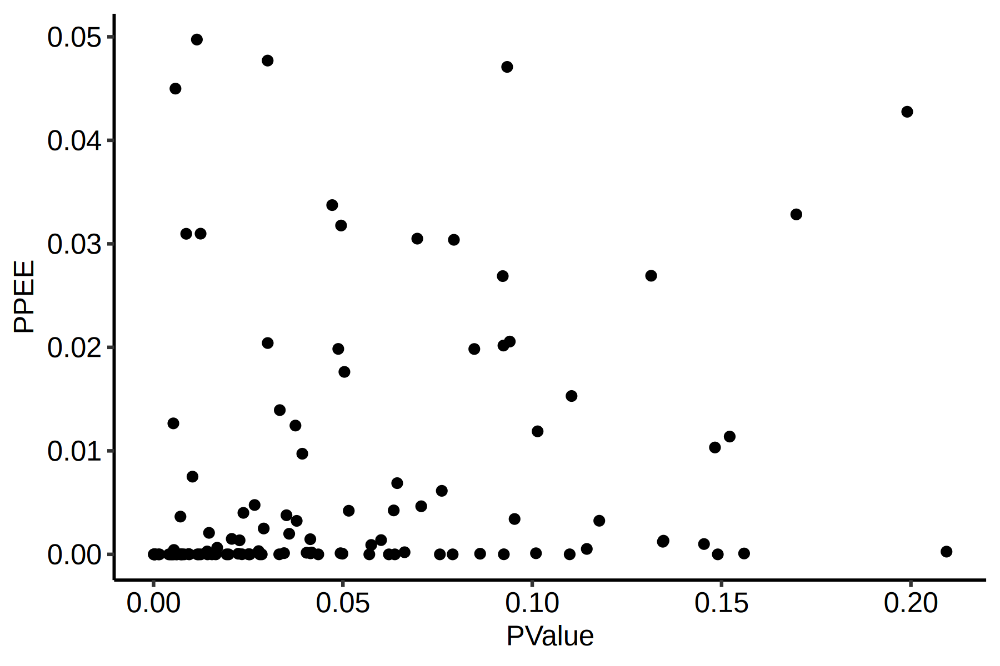

In [225]:
plotdat = deg_hmm[found == T, ]
ggplot(plotdat, aes(x = PValue, y = PPEE)) + geom_point() + theme_pubr() 


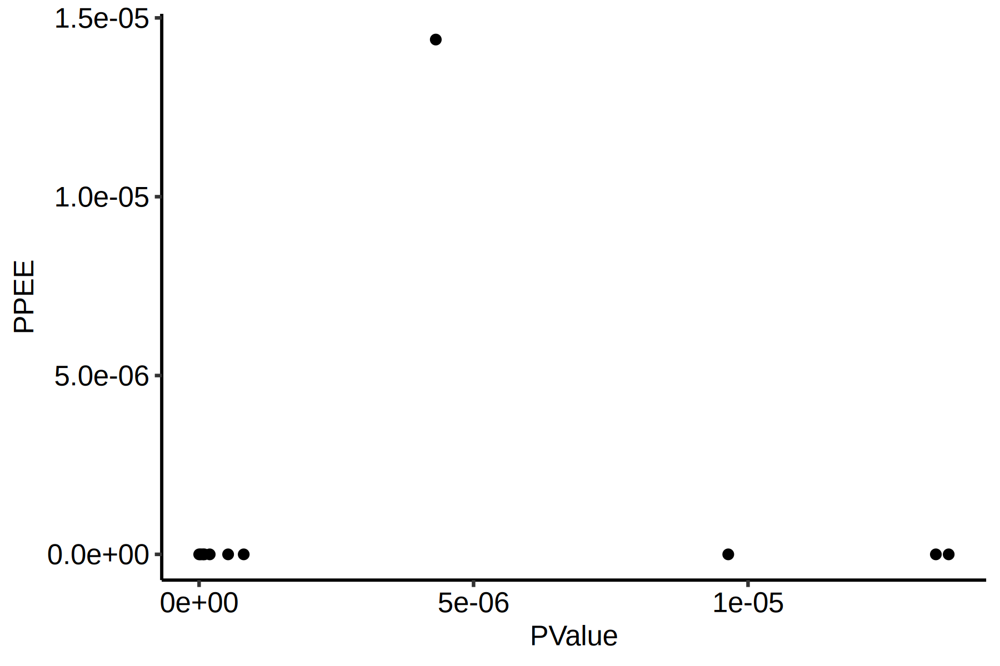

In [161]:
plotdat = deg_hmm[sig == T, ]
ggplot(plotdat, aes(x = PValue, y = PPEE)) + geom_point() + theme_pubr() 


In [93]:
head(deg_coding_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
HSC,OR11K2P,9.380614,-2.944438,2.118393e-09,0.0000838354
HSC,LOC124906836,7.401834,-2.141472,2.917073e-08,0.0005772158
HSC,RPL31P64,8.223059,-3.186283,6.894059e-08,0.0009094413
HSC,KRTAP6-1,7.981290,-4.024737,9.548944e-08,0.0009447486
HSC,PCDHA7,7.744114,-4.179213,1.936259e-07,0.0015325491
HSC,PRPF4BP1,5.585529,-3.700205,5.287894e-07,0.0034878068


In [92]:
summary(geneFC_dt$PostFC)

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
   0.0007    0.2736    0.7269    3.3038    1.6190 2529.5110 

In [91]:
geneFC_dt[symbol %in% rownames(logcpm_all), if_included := T]

In [ ]:
EBOut$Alpha
EBOut$Beta
EBOut$P

## test heatmap

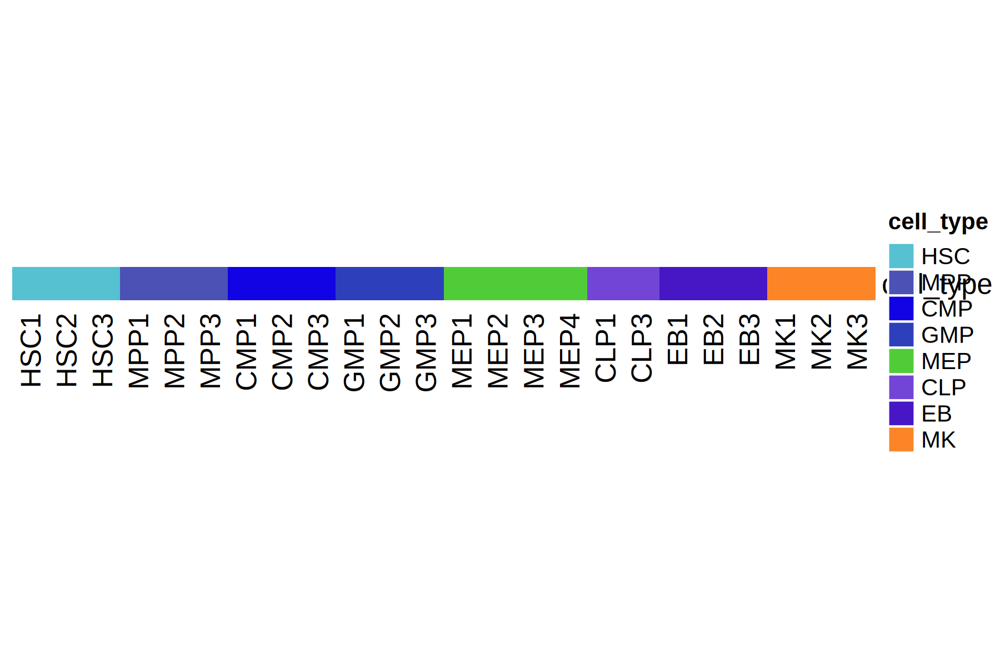

In [220]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

ov = deg_hmm[included == T & found & sig, symbol]
plotdat = logcpm_all[ov, rownames(dsn_sel)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ann = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)        
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, cluster_rows = T,  
        show_row_dend = F, top_annotation = column_ann) #, left_annotation = row_ann, row_split = row_df$pattern) #, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [222]:
length(ov)

[1] 115

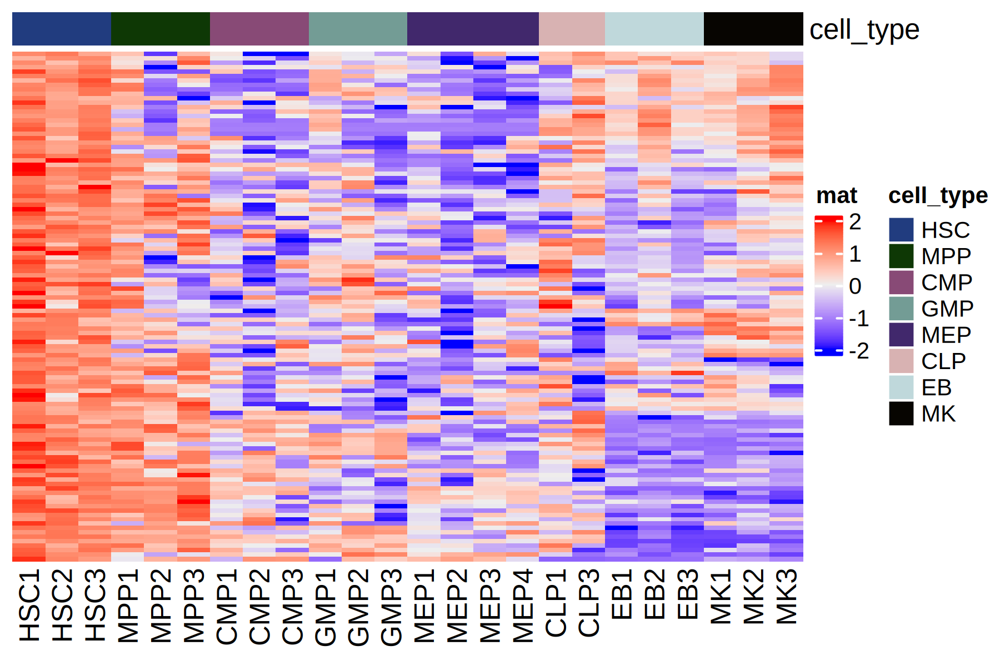

In [221]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

ov = deg_hmm[included == T & found, symbol]
plotdat = logcpm_all[ov, rownames(dsn_sel)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ann = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 300)        
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = T,  
        show_row_dend = F, top_annotation = column_ann) #, left_annotation = row_ann, row_split = row_df$pattern) #, column_split  factor(dsn_all_df$cell_type, levels = cell_types))  


## model fit and QC

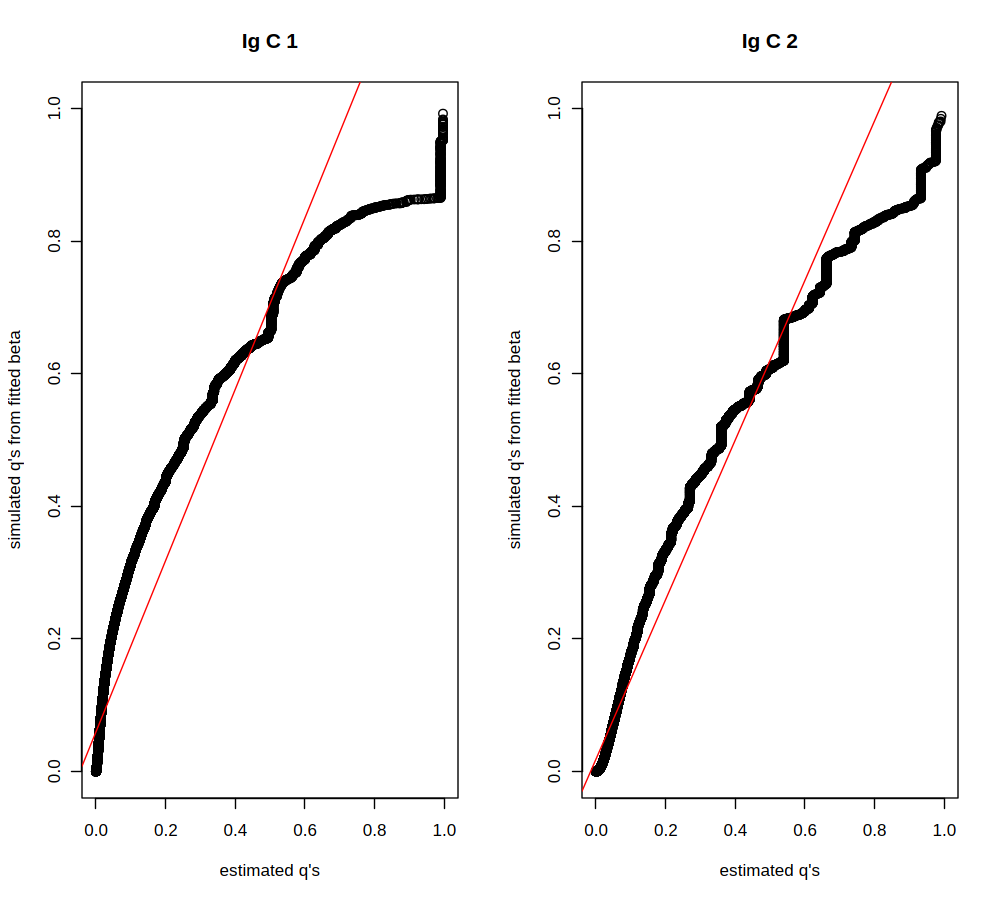

In [82]:
par(mfrow=c(1,2))
QQP(EBOut)

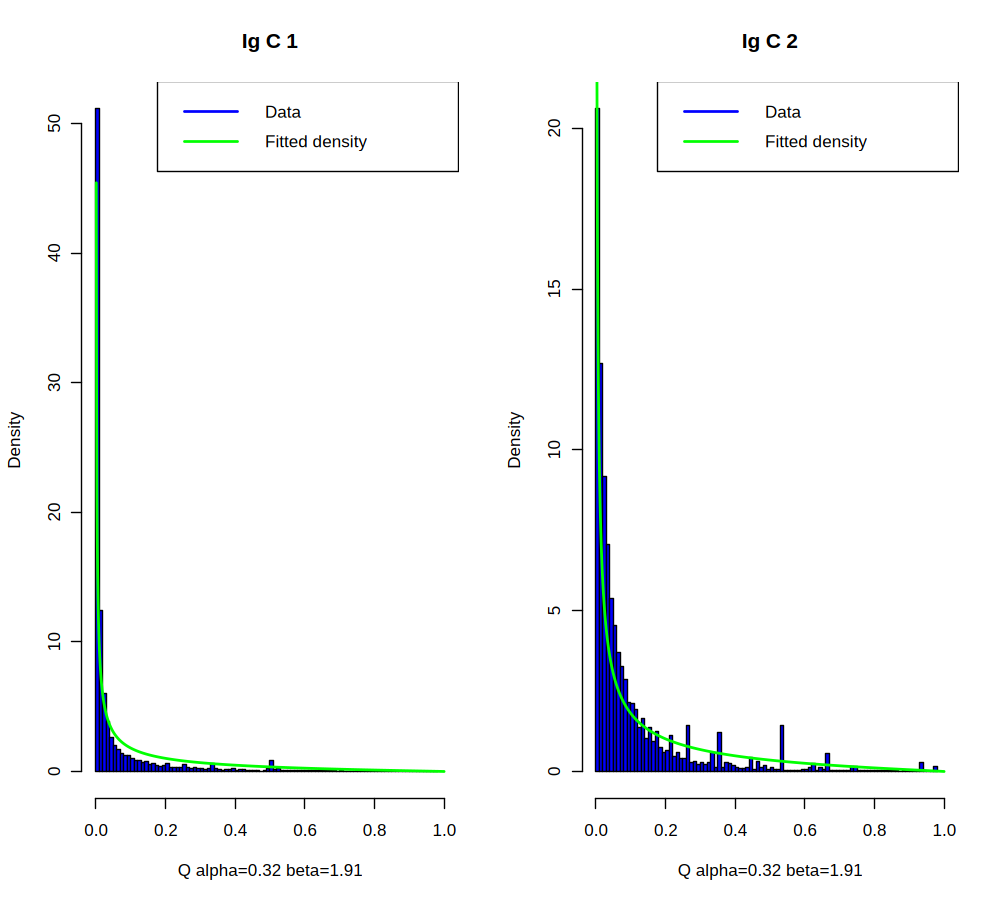

In [83]:
par(mfrow=c(1,2))
DenNHist(EBOut)

# try all the cell types with EBSeqHMM

In [231]:
GeneMat = mtx_coding_sel[gene_sel, ]
dim(GeneMat)
deg_list = lapply(cell_types, function( ii_cell_type ){
    cond = rep('Control', nrow(dsn_sel))
    cond[dsn_sel$cell_type == ii_cell_type] = ii_cell_type
    cond = factor(cond, levels = c(ii_cell_type, 'Control'))
    Sizes=MedianNorm(GeneMat)
    EBOut=EBTest(Data=GeneMat, Conditions=cond,sizeFactors=Sizes, maxround=5)
    #EBDERes=GetDEResults(EBOut, FDR=0.01, Threshold_FC = 1)
    EBDERes=GetDEResults(EBOut, FDR=0.05)
    GeneFC=PostFC(EBOut)
    geneFC_dt = data.table(symbol = names(GeneFC$RealFC))
    geneFC_dt[, realFC := GeneFC$RealFC]
    geneFC_dt[, PostFC := GeneFC$PostFC]
    geneFC_dt$PPEE = EBDERes$PPMat[geneFC_dt$symbol, 'PPEE']
    geneFC_dt$PPDE = EBDERes$PPMat[geneFC_dt$symbol, 'PPDE']
    geneFC_dt[, found := F] 
    geneFC_dt[symbol %in% EBDERes$DEfound, found := T]

    # add DEGSeq results
    deg_hmm = deg_coding_dt[.id == ii_cell_type, ]
    deg_hmm = merge(geneFC_dt, deg_hmm, by.x = 'symbol', by.y = 'rn', all.x = T)
    deg_hmm[, logRealFC := log2(realFC) ]
    deg_hmm[, logPostFC := log2(PostFC) ]
    deg_hmm[symbol %in% deg_coding_dt[.id == ii_cell_type, rn],  included := T]
    deg_hmm[, sig := F]
    deg_hmm[FDR < 0.05, sig :=T]
    deg_hmm = deg_hmm[order(FDR), ]
    deg_hmm
})


[1] 10876    24

Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2


In [317]:
names(deg_list) = cell_types
deg_dt = rbindlist(deg_list)
deg_dt[, gene_cell_type := factor(.id, levels = cell_types) ]
deg_dt[, cell_type_symbol := paste0(gene_cell_type, '_', symbol)]
head(deg_dt)


symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,FDR,logRealFC,logPostFC,included,sig,gene_cell_type,cell_type_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<fct>,<chr>
HMGA2-AS1,7.085084,7.035641,1.103032e-25,1.0000000,TRUE,HSC,2.624279,4.016068,5.451008e-05,0.1348273,2.824785,2.814682,TRUE,FALSE,HSC,HSC_HMGA2-AS1
TNFSF10,7.148743,7.042690,9.279500e-08,0.9999999,TRUE,HSC,2.633429,4.065532,8.934764e-05,0.1473305,2.837690,2.816127,TRUE,FALSE,HSC,HSC_TNFSF10
LOC101927745,7.220316,7.179128,2.197960e-22,1.0000000,TRUE,HSC,2.618232,4.814698,2.635155e-04,0.2744376,2.852062,2.843809,TRUE,FALSE,HSC,HSC_LOC101927745
SETBP1,6.641344,6.561073,2.641374e-14,1.0000000,TRUE,HSC,2.572233,4.914974,2.994291e-04,0.2890222,2.731475,2.713932,TRUE,FALSE,HSC,HSC_SETBP1
MECOM,6.487600,6.451549,1.946782e-23,1.0000000,TRUE,HSC,2.457369,5.483692,3.674771e-04,0.2916709,2.697685,2.689646,TRUE,FALSE,HSC,HSC_MECOM
PREX2,6.315690,6.255410,4.818166e-14,1.0000000,TRUE,HSC,2.467208,3.669218,3.603965e-04,0.2916709,2.658940,2.645105,TRUE,FALSE,HSC,HSC_PREX2


In [276]:
table(deg_dt[found == T, .id])[cell_types]


 HSC  MPP  CMP  GMP  MEP  CLP   EB   MK 
 115   44  177   93   86  119 2040 1570 

# heatmap with all cell type for coding gene analysis

In [303]:
tmp = deg_dt[found ==T, ]
row_df = setDF(tmp, rownames = paste0(tmp$.id, '_', tmp$symbol))
dim(row_df)
head(row_df)

[1] 4244   18

,.id,symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,FDR,logRealFC,logPostFC,included,sig,gene_cell_type,cell_type_symbol
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<fct>,<chr>
HSC_HMGA2-AS1,HSC,HMGA2-AS1,7.085084,7.035641,1.103032e-25,1.0000000,TRUE,HSC,2.624279,4.016068,5.451008e-05,0.1348273,2.824785,2.814682,TRUE,FALSE,HSC,HSC_HMGA2-AS1
HSC_TNFSF10,HSC,TNFSF10,7.148743,7.042690,9.279500e-08,0.9999999,TRUE,HSC,2.633429,4.065532,8.934764e-05,0.1473305,2.837690,2.816127,TRUE,FALSE,HSC,HSC_TNFSF10
HSC_LOC101927745,HSC,LOC101927745,7.220316,7.179128,2.197960e-22,1.0000000,TRUE,HSC,2.618232,4.814698,2.635155e-04,0.2744376,2.852062,2.843809,TRUE,FALSE,HSC,HSC_LOC101927745
HSC_SETBP1,HSC,SETBP1,6.641344,6.561073,2.641374e-14,1.0000000,TRUE,HSC,2.572233,4.914974,2.994291e-04,0.2890222,2.731475,2.713932,TRUE,FALSE,HSC,HSC_SETBP1
HSC_MECOM,HSC,MECOM,6.487600,6.451549,1.946782e-23,1.0000000,TRUE,HSC,2.457369,5.483692,3.674771e-04,0.2916709,2.697685,2.689646,TRUE,FALSE,HSC,HSC_MECOM
HSC_PREX2,HSC,PREX2,6.315690,6.255410,4.818166e-14,1.0000000,TRUE,HSC,2.467208,3.669218,3.603965e-04,0.2916709,2.658940,2.645105,TRUE,FALSE,HSC,HSC_PREX2


`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



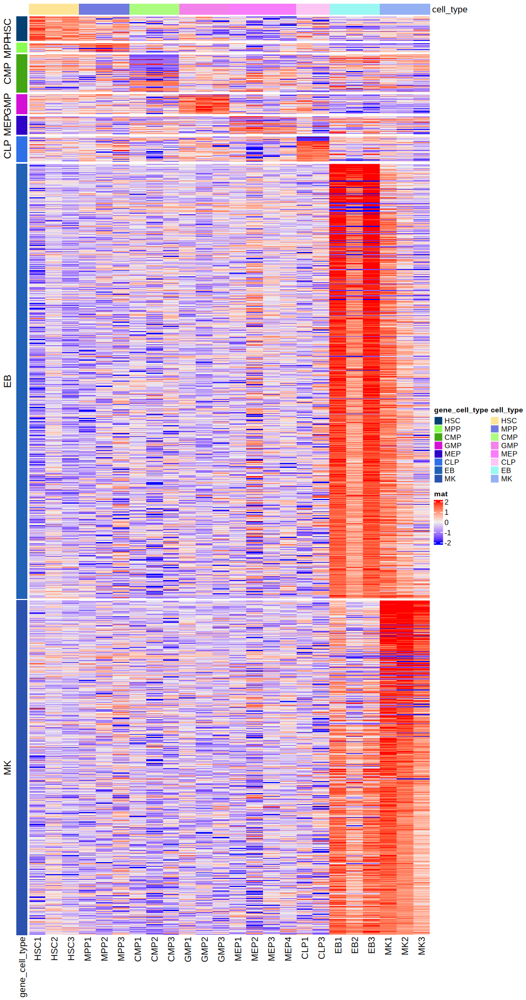

In [304]:
options(repr.plot.width = 10, repr.plot.height = 19, repr.plot.res = 100)

plotdat = logcpm_all[row_df$symbol, rownames(dsn_sel)]
rownames(plotdat) = row_df$cell_type_symbol

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

#column_ann = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
column_ann = columnAnnotation(df = dsn_sel[, 'cell_type', drop = F])
row_ann = rowAnnotation(df = row_df[, 'gene_cell_type', drop = F])
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ann, left_annotation = row_ann, row_split = factor(row_df$gene_cell_type, levels = cell_types)) #, column_split  factor(dsn_all_df$cell_type, levels = cell_types))  


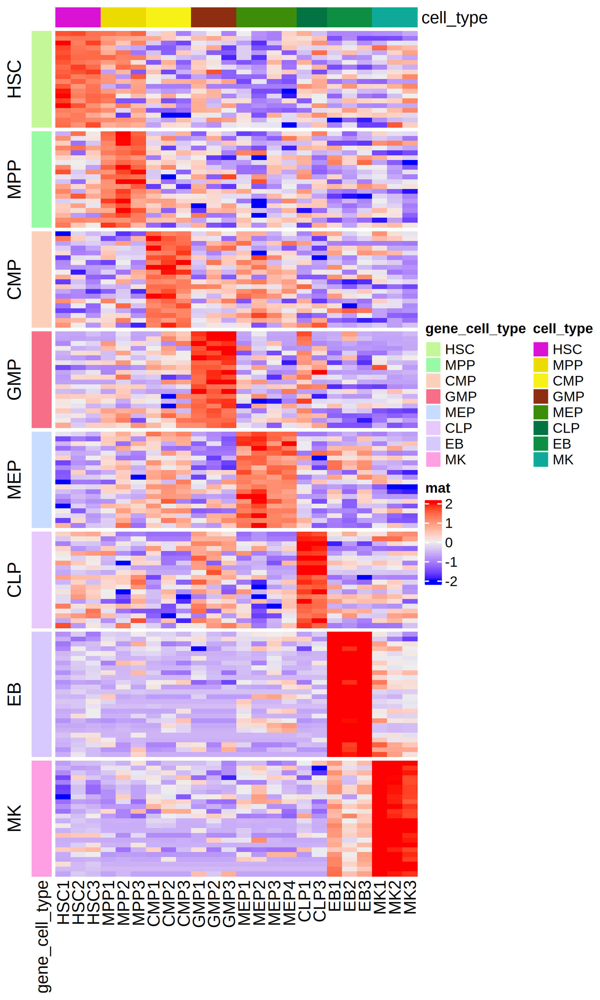

In [324]:
tmp = deg_dt[found == T & logPostFC > 0, ] %>% group_by(gene_cell_type) %>% slice_min(order_by = PPEE, n = 20) %>% as.data.table() 
row_df = setDF(tmp, rownames = tmp$cell_type_symbol)

options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

plotdat = logcpm_all[row_df$symbol, rownames(dsn_sel)]
rownames(plotdat) = row_df$cell_type_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

#column_ann = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
column_ann = columnAnnotation(df = dsn_sel[, 'cell_type', drop = F])
row_ann = rowAnnotation(df = row_df[, 'gene_cell_type', drop = F])
options(repr.plot.width = 6, repr.plot.height = 10, repr.plot.res = 300)        
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ann, left_annotation = row_ann, row_split = factor(row_df$gene_cell_type, levels = cell_types)) #, column_split  factor(dsn_all_df$cell_type, levels = cell_types))  


In [325]:
head(deg_coding_dt)

.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
HSC,OR11K2P,9.380614,-2.944438,2.118393e-09,0.0000838354
HSC,LOC124906836,7.401834,-2.141472,2.917073e-08,0.0005772158
HSC,RPL31P64,8.223059,-3.186283,6.894059e-08,0.0009094413
HSC,KRTAP6-1,7.981290,-4.024737,9.548944e-08,0.0009447486
HSC,PCDHA7,7.744114,-4.179213,1.936259e-07,0.0015325491
HSC,PRPF4BP1,5.585529,-3.700205,5.287894e-07,0.0034878068


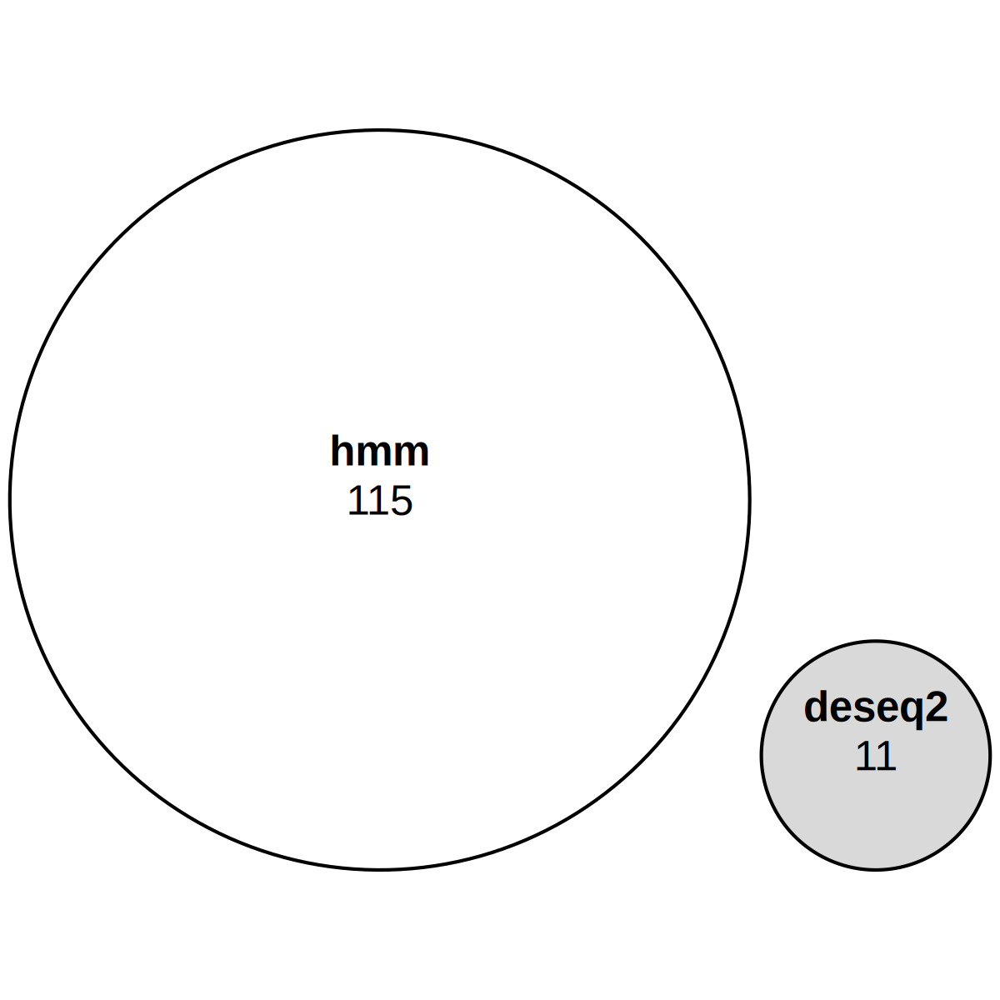

In [340]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 300)      
ii_cell_type = 'HSC'
ov = list(hmm = unique(deg_dt[found == T & gene_cell_type == ii_cell_type, symbol]), deseq2 = unique(deg_coding_dt[.id == ii_cell_type & FDR < 0.05, rn]))
plot(euler(ov, shape = "ellipse"), quantities = TRUE)


In [ ]:
head(logcpm_all_t)

In [343]:
logcpm_all[deg_coding_dt[.id == ii_cell_type & FDR < 0.05, rn], ]

,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3,GMP1,⋯,MEP3,MEP4,CLP1,CLP3,EB1,EB2,EB3,MK1,MK2,MK3
OR11K2P,0.6778316,0.47702065,0.2507073,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.000000000
LOC124906836,1.1304490,0.42716083,0.5543611,0.00000000,0.00000000,0.00000000,0.005012277,0.021214324,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00717393,0.00000000,0.00000000,0.00000000,0.00000000,0.02200308,0.01081966,0.043994700
RPL31P64,0.7041941,0.23621739,0.1897535,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.008955146
KRTAP6-1,0.2335456,0.15906023,0.2358136,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.000000000
PCDHA7,0.2033399,0.13195901,0.2053438,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.000000000
PRPF4BP1,0.5031469,0.07544835,0.1079334,0.00000000,0.01144922,0.01107151,0.005012277,0.000000000,0.00000000,0.00000000,⋯,0.006344488,0.0000000,0.00717393,0.00000000,0.00000000,0.00000000,0.00000000,0.01106205,0.00000000,0.008955146
KCNJ2-AS1,1.9668788,0.50578528,0.2507073,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.035349241
LOC390029,1.4247562,0.07544835,0.0732341,0.04257376,0.02838096,0.13516822,0.014962087,0.026448324,0.01883101,0.03420997,⋯,0.000000000,0.0227160,0.02839200,0.01068156,0.01385737,0.15231681,0.03045142,0.04353242,0.07338880,0.134466042
LOC124907350,0.1068294,0.28453484,0.2206948,0.00000000,0.00000000,0.00000000,0.000000000,0.005345922,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,0.02200308,0.00000000,0.008955146
SNRNP40P1,1.0857814,0.22376423,0.4630190,0.00000000,0.00000000,0.01107151,0.000000000,0.000000000,0.00000000,0.00000000,⋯,0.000000000,0.0000000,0.00000000,0.00000000,0.00000000,0.02705228,0.01534161,0.00000000,0.00000000,0.069491460


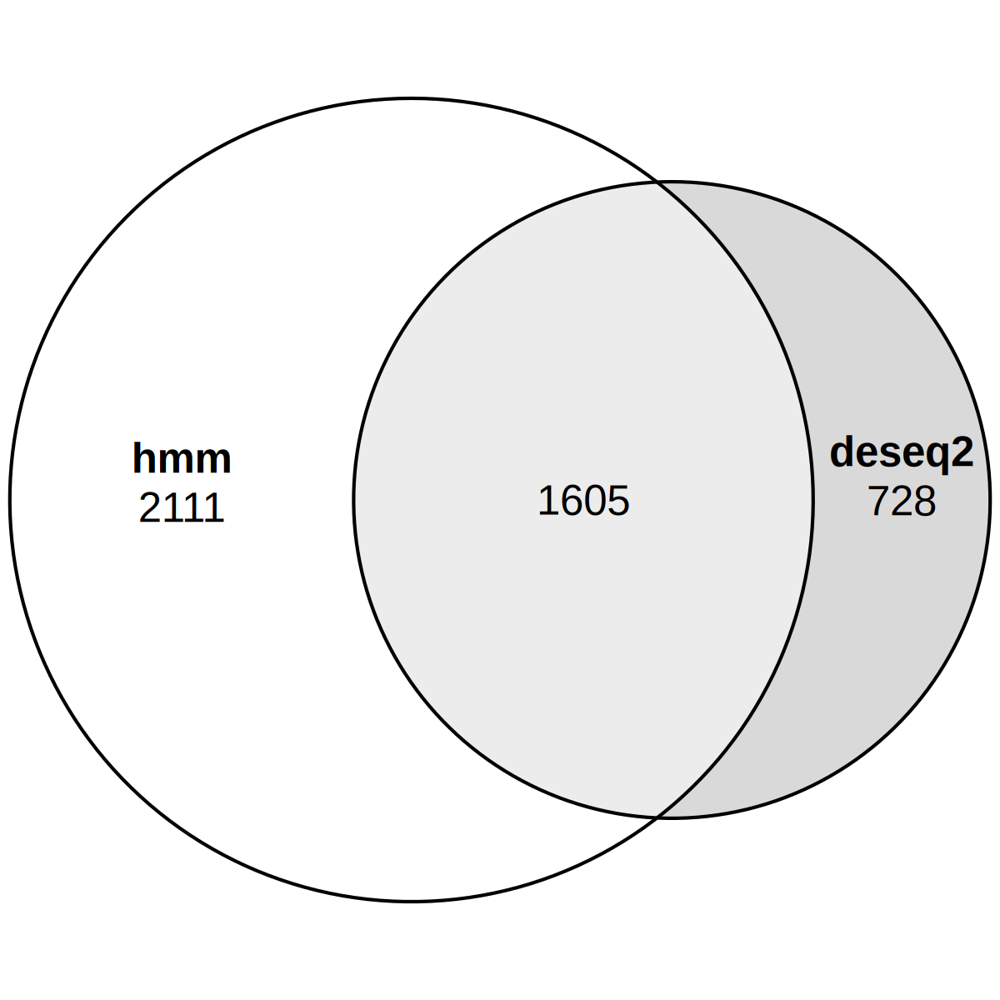

In [336]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 300)        
ov = list(hmm = unique(deg_dt[found == T, symbol]), deseq2 = unique(deg_coding_dt[FDR < 0.05, rn]))
plot(euler(ov, shape = "ellipse"), quantities = TRUE)


# compared with online resutls

In [345]:
st_4 = as.data.table(read_xlsx('/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/1251033s.xlsx', sheet = 4, skip = 1)  )
setnames(st_4, 9, 'pval')
st_4_sel = st_4 %>% group_by(Model) %>% slice_min(order_by = pval, n = 20)
dim(st_4_sel)
head(st_4_sel)

[1] 145   9

Model,Ensembl_gene_id,Gene_biotype,External_gene_id,Description,Model posterior probability,log(FC),Second model,pval
<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<dbl>
CLP,ENSG00000226979,protein_coding,LTA,"lymphotoxin alpha (TNF superfamily, member 1) [Source:HGNC Symbol;Acc:6709]",0.9998567,7.431380,ZERO,5.502297e-05
CLP,ENSG00000141556,protein_coding,TBCD,tubulin folding cofactor D [Source:HGNC Symbol;Acc:11581],0.9988962,1.521150,ZERO,7.807155e-04
CLP,ENSG00000234608,lincRNA,MAPKAPK5-AS1,MAPKAPK5 antisense RNA 1 [Source:HGNC Symbol;Acc:24091],0.9987265,0.771894,ZERO,1.036097e-03
CLP,ENSG00000147905,protein_coding,ZCCHC7,"zinc finger, CCHC domain containing 7 [Source:HGNC Symbol;Acc:26209]",0.9982218,1.331880,ZERO,1.272343e-03
CLP,ENSG00000102606,protein_coding,ARHGEF7,Rho guanine nucleotide exchange factor (GEF) 7 [Source:HGNC Symbol;Acc:15607],0.9948035,0.897202,ZERO,3.195232e-03
CLP,ENSG00000180011,protein_coding,ZADH2,zinc binding alcohol dehydrogenase domain containing 2 [Source:HGNC Symbol;Acc:28697],0.9941627,0.783446,ZERO,3.608838e-03


In [366]:
cell_types

[1] "HSC" "MPP" "CMP" "GMP" "MEP" "CLP" "EB"  "MK"

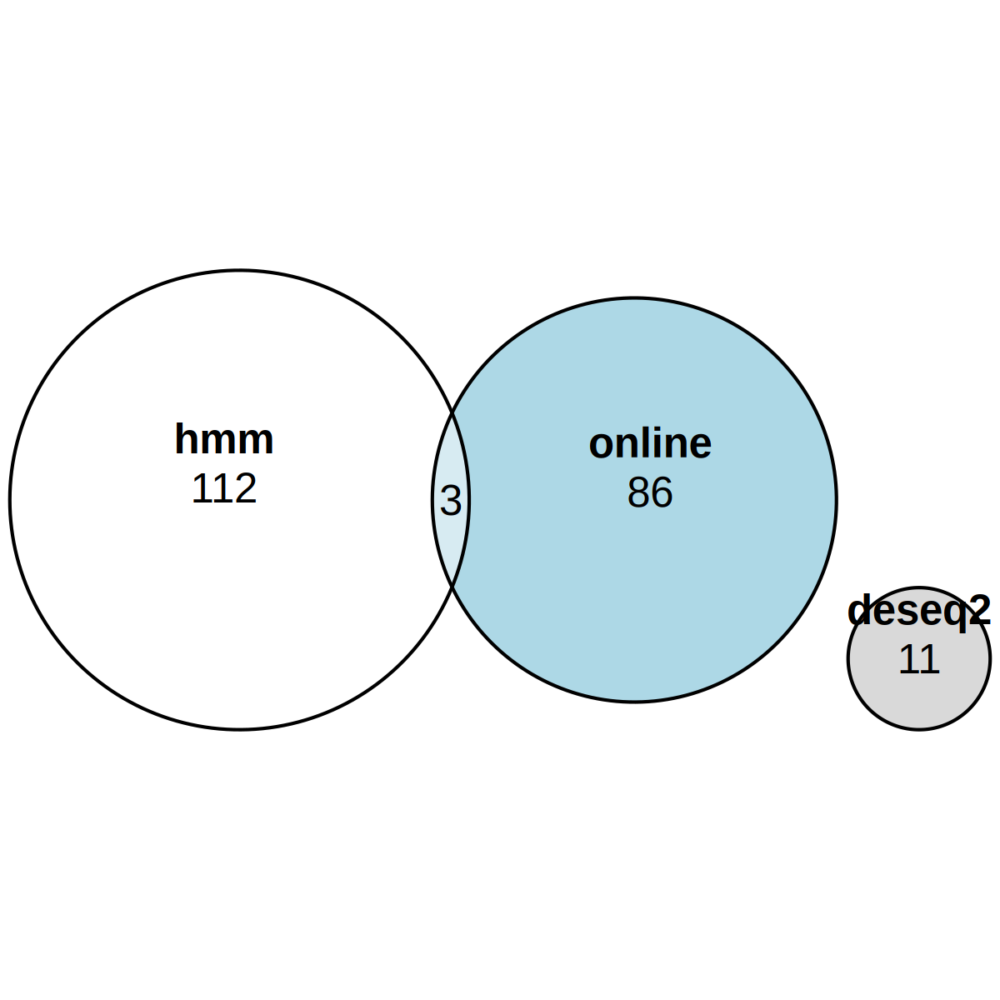

In [368]:
options(repr.plot.width = 4, repr.plot.height = 4, repr.plot.res = 300)     
ii_cell_type = 'HSC'
ov = list(hmm = unique(deg_dt[found == T & logPostFC > .7 & gene_cell_type == ii_cell_type, symbol]), 
          deseq2 = unique(deg_coding_dt[FDR < 0.05 & logFC > .7 & .id == ii_cell_type, rn]), 
          online = unique(st_4[Model == ii_cell_type, External_gene_id]))
plot(euler(ov, shape = "ellipse"), quantities = TRUE)


In [361]:
ii_cell_type == 'MEP'


[1] FALSE

# EBSeqHMM for TE genes

In [409]:
summary(rs)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
       0    13798    56173   450593   196386 48363862 

In [416]:
length(rs[rs > 10798])
gene_sel = names(rs[rs > 13798])
head(gene_sel)


[1] 1028

[1] "(CATTC)n:Satellite:Satellite" "(GAATG)n:Satellite:Satellite" "ALR/Alpha:centr:Satellite"    "Alu:Alu:SINE"                 "AluJb:Alu:SINE"              
[6] "AluJo:Alu:SINE"

In [417]:
GeneMat = as.matrix(mtx_te_df[gene_sel, rownames(dsn_sel)])
dim(GeneMat)
deg_list = lapply(cell_types, function( ii_cell_type ){
    cond = rep('Control', nrow(dsn_sel))
    cond[dsn_sel$cell_type == ii_cell_type] = ii_cell_type
    cond = factor(cond, levels = c(ii_cell_type, 'Control'))
    Sizes=MedianNorm(GeneMat)
    EBOut=EBTest(Data=GeneMat, Conditions=cond,sizeFactors=Sizes, maxround=5)
    #EBDERes=GetDEResults(EBOut, FDR=0.01, Threshold_FC = 1)
    EBDERes=GetDEResults(EBOut, FDR=0.05)
    GeneFC=PostFC(EBOut)
    geneFC_dt = data.table(symbol = names(GeneFC$RealFC))
    geneFC_dt[, realFC := GeneFC$RealFC]
    geneFC_dt[, PostFC := GeneFC$PostFC]
    geneFC_dt$PPEE = EBDERes$PPMat[geneFC_dt$symbol, 'PPEE']
    geneFC_dt$PPDE = EBDERes$PPMat[geneFC_dt$symbol, 'PPDE']
    geneFC_dt[, found := F] 
    geneFC_dt[symbol %in% EBDERes$DEfound, found := T]

    # add DEGSeq results
    deg_hmm = deg_te_dt[.id == ii_cell_type, ]
    deg_hmm = merge(geneFC_dt, deg_hmm, by.x = 'symbol', by.y = 'rn', all.x = T)
    deg_hmm[, logRealFC := log2(realFC) ]
    deg_hmm[, logPostFC := log2(PostFC) ]
    deg_hmm[symbol %in% deg_coding_dt[.id == ii_cell_type, rn],  included := T]
    deg_hmm[, sig := F]
    deg_hmm[FDR < 0.05, sig :=T]
    deg_hmm = deg_hmm[order(FDR), ]
    deg_hmm
})


[1] 982  24

Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2
Initial number of DE patterns = 2
Final number of DE patterns = 2


In [418]:
names(deg_list) = cell_types
hmm_te_dt = rbindlist(deg_list)
hmm_te_dt[, gene_cell_type := factor(.id, levels = cell_types) ]
hmm_te_dt[, cell_type_symbol := paste0(gene_cell_type, '_', symbol)]
head(hmm_te_dt)


symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,⋯,idd,class_id,family_id,gene_id,logRealFC,logPostFC,included,sig,gene_cell_type,cell_type_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>,<lgl>,<fct>,<chr>
Alu:Alu:SINE,0.6939360,0.6910525,0.9394241,0.060575886,FALSE,HSC,-0.6454290,8.683473,0.03193293,⋯,56,SINE,Alu,Alu,-0.5271256,-0.5331327,NA,FALSE,HSC,HSC_Alu:Alu:SINE
AluJb:Alu:SINE,0.6667443,0.6615157,0.9987426,0.001257431,FALSE,HSC,-0.6688196,16.182811,0.01043534,⋯,9,SINE,Alu,AluJb,-0.5847946,-0.5961528,NA,FALSE,HSC,HSC_AluJb:Alu:SINE
AluJo:Alu:SINE,0.6792521,0.6736412,0.9973254,0.002674642,FALSE,HSC,-0.6248479,11.563573,0.01285616,⋯,15,SINE,Alu,AluJo,-0.5579810,-0.5699477,NA,FALSE,HSC,HSC_AluJo:Alu:SINE
AluJr4:Alu:SINE,0.6982207,0.6931219,0.9962883,0.003711703,FALSE,HSC,-0.5900774,10.800899,0.02390629,⋯,35,SINE,Alu,AluJr4,-0.5182449,-0.5288190,NA,FALSE,HSC,HSC_AluJr4:Alu:SINE
AluJr:Alu:SINE,0.6935163,0.6887453,0.9968552,0.003144767,FALSE,HSC,-0.5882554,11.535766,0.01459471,⋯,20,SINE,Alu,AluJr,-0.5279982,-0.5379574,NA,FALSE,HSC,HSC_AluJr:Alu:SINE
AluSc8:Alu:SINE,0.8204499,0.8188020,0.9975022,0.002497830,FALSE,HSC,-0.3453458,12.014953,0.04916303,⋯,96,SINE,Alu,AluSc8,-0.2855129,-0.2884134,NA,FALSE,HSC,HSC_AluSc8:Alu:SINE


[1] 70 22

,symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,⋯,idd,class_id,family_id,gene_id,logRealFC,logPostFC,included,sig,gene_cell_type,cell_type_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>,<lgl>,<fct>,<chr>
HSC_ERVL-B4-int:ERVL:LTR,ERVL-B4-int:ERVL:LTR,1.654013,1.650140,1.083504e-07,0.9999999,TRUE,HSC,0.6461831,8.966138,0.00995068,⋯,6,LTR,ERVL,ERVL-B4-int,0.7259705,0.7225886,NA,FALSE,HSC,HSC_ERVL-B4-int:ERVL:LTR
HSC_LTR16A:ERVL:LTR,LTR16A:ERVL:LTR,1.393235,1.390703,9.077858e-03,0.9909221,TRUE,HSC,0.3963756,8.776317,0.07047276,⋯,144,LTR,ERVL,LTR16A,0.4784389,0.4758147,NA,FALSE,HSC,HSC_LTR16A:ERVL:LTR
HSC_L1PBa1:L1:LINE,L1PBa1:L1:LINE,1.589710,1.583588,1.113850e-03,0.9988861,TRUE,HSC,0.5200821,7.998530,0.10030759,⋯,185,LINE,L1,L1PBa1,0.6687639,0.6631969,NA,FALSE,HSC,HSC_L1PBa1:L1:LINE
HSC_MER89-int:ERV1:LTR,MER89-int:ERV1:LTR,1.885547,1.870992,1.601455e-02,0.9839855,TRUE,HSC,0.9507321,6.695526,0.10190134,⋯,188,LTR,ERV1,MER89-int,0.9149834,0.9038031,NA,FALSE,HSC,HSC_MER89-int:ERV1:LTR
HSC_FordPrefect:hAT-Tip100:DNA,FordPrefect:hAT-Tip100:DNA,2.357682,2.328704,6.451696e-03,0.9935483,TRUE,HSC,1.2852271,5.819017,0.11121808,⋯,198,DNA,hAT-Tip100,FordPrefect,1.2373692,1.2195274,NA,FALSE,HSC,HSC_FordPrefect:hAT-Tip100:DNA
HSC_L1PBa:L1:LINE,L1PBa:L1:LINE,1.432507,1.429710,6.406255e-03,0.9935937,TRUE,HSC,0.5378418,9.946424,0.11348463,⋯,200,LINE,L1,L1PBa,0.5185426,0.5157228,NA,FALSE,HSC,HSC_L1PBa:L1:LINE


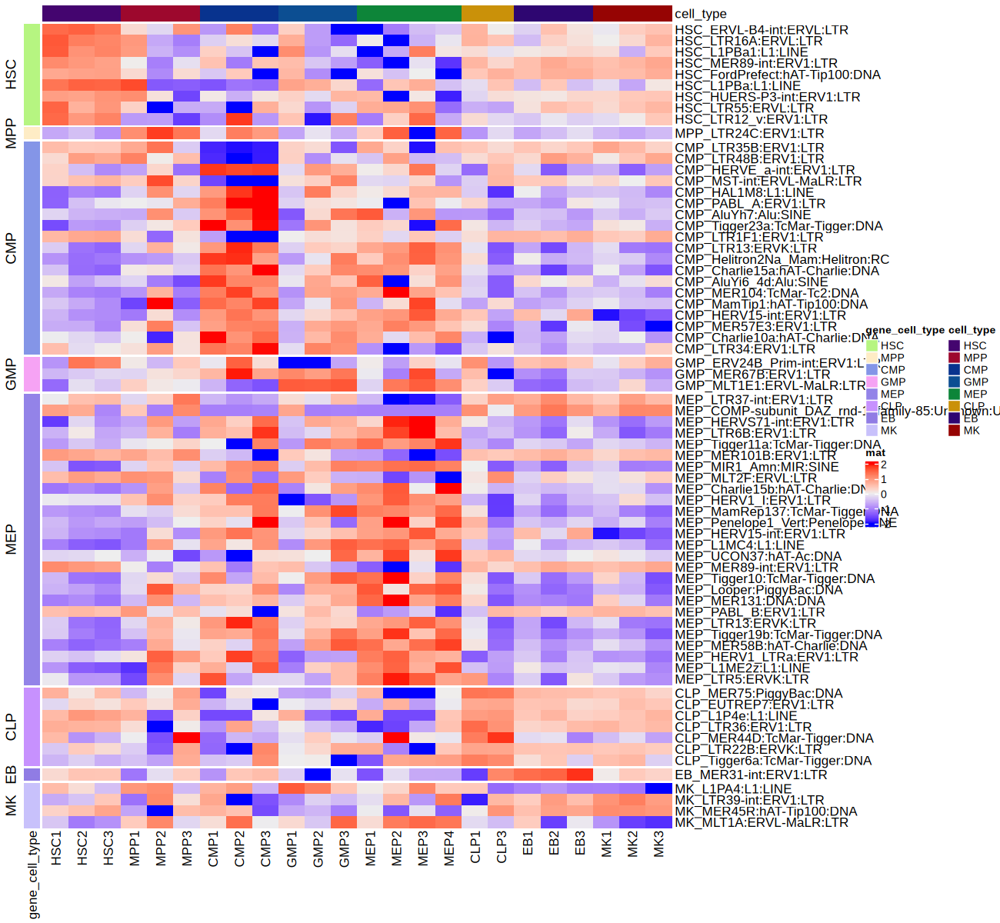

In [419]:
tmp = hmm_te_dt[found ==T, ]
row_df = setDF(tmp, rownames = paste0(tmp$.id, '_', tmp$symbol))
row_df = row_df[order(row_df$gene_cell_type), ]
dim(row_df)
head(row_df)

plotdat = logcpm_te[row_df$symbol, rownames(dsn_sel)]
rownames(plotdat) = row_df$cell_type_symbol

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

#column_ann = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
options(repr.plot.width = 13, repr.plot.height = 12, repr.plot.res = 100)
column_ann = columnAnnotation(df = dsn_sel[, 'cell_type', drop = F])
row_ann = rowAnnotation(df = row_df[, 'gene_cell_type', drop = F])
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ann, left_annotation = row_ann, row_split = factor(row_df$gene_cell_type, levels = cell_types)) #, column_split  factor(dsn_all_df$cell_type, levels = cell_types))  


In [420]:
head(hmm_te_dt)

symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,⋯,idd,class_id,family_id,gene_id,logRealFC,logPostFC,included,sig,gene_cell_type,cell_type_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>,<lgl>,<fct>,<chr>
Alu:Alu:SINE,0.6939360,0.6910525,0.9394241,0.060575886,FALSE,HSC,-0.6454290,8.683473,0.03193293,⋯,56,SINE,Alu,Alu,-0.5271256,-0.5331327,NA,FALSE,HSC,HSC_Alu:Alu:SINE
AluJb:Alu:SINE,0.6667443,0.6615157,0.9987426,0.001257431,FALSE,HSC,-0.6688196,16.182811,0.01043534,⋯,9,SINE,Alu,AluJb,-0.5847946,-0.5961528,NA,FALSE,HSC,HSC_AluJb:Alu:SINE
AluJo:Alu:SINE,0.6792521,0.6736412,0.9973254,0.002674642,FALSE,HSC,-0.6248479,11.563573,0.01285616,⋯,15,SINE,Alu,AluJo,-0.5579810,-0.5699477,NA,FALSE,HSC,HSC_AluJo:Alu:SINE
AluJr4:Alu:SINE,0.6982207,0.6931219,0.9962883,0.003711703,FALSE,HSC,-0.5900774,10.800899,0.02390629,⋯,35,SINE,Alu,AluJr4,-0.5182449,-0.5288190,NA,FALSE,HSC,HSC_AluJr4:Alu:SINE
AluJr:Alu:SINE,0.6935163,0.6887453,0.9968552,0.003144767,FALSE,HSC,-0.5882554,11.535766,0.01459471,⋯,20,SINE,Alu,AluJr,-0.5279982,-0.5379574,NA,FALSE,HSC,HSC_AluJr:Alu:SINE
AluSc8:Alu:SINE,0.8204499,0.8188020,0.9975022,0.002497830,FALSE,HSC,-0.3453458,12.014953,0.04916303,⋯,96,SINE,Alu,AluSc8,-0.2855129,-0.2884134,NA,FALSE,HSC,HSC_AluSc8:Alu:SINE


[1] 160  22

symbol,realFC,PostFC,PPEE,PPDE,found,.id,logFC,logCPM,PValue,⋯,idd,class_id,family_id,gene_id,logRealFC,logPostFC,included,sig,gene_cell_type,cell_type_symbol
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<lgl>,<lgl>,<fct>,<chr>
ERVL-B4-int:ERVL:LTR,1.654013,1.650140,1.083504e-07,0.9999999,TRUE,HSC,0.6461831,8.966138,0.00995068,⋯,6,LTR,ERVL,ERVL-B4-int,0.7259705,0.7225886,NA,FALSE,HSC,HSC_ERVL-B4-int:ERVL:LTR
LTR12_v:ERV1:LTR,1.462550,1.458912,1.930779e-05,0.9999807,TRUE,HSC,0.5653870,6.781359,0.15237077,⋯,252,LTR,ERV1,LTR12_v,0.5484864,0.5448928,NA,FALSE,HSC,HSC_LTR12_v:ERV1:LTR
L1PBa1:L1:LINE,1.589710,1.583588,1.113850e-03,0.9988861,TRUE,HSC,0.5200821,7.998530,0.10030759,⋯,185,LINE,L1,L1PBa1,0.6687639,0.6631969,NA,FALSE,HSC,HSC_L1PBa1:L1:LINE
LTR55:ERVL:LTR,1.709778,1.695536,5.581813e-03,0.9944182,TRUE,HSC,0.7975452,5.339547,0.14288274,⋯,235,LTR,ERVL,LTR55,0.7738088,0.7617414,NA,FALSE,HSC,HSC_LTR55:ERVL:LTR
L1PBa:L1:LINE,1.432507,1.429710,6.406255e-03,0.9935937,TRUE,HSC,0.5378418,9.946424,0.11348463,⋯,200,LINE,L1,L1PBa,0.5185426,0.5157228,NA,FALSE,HSC,HSC_L1PBa:L1:LINE
FordPrefect:hAT-Tip100:DNA,2.357682,2.328704,6.451696e-03,0.9935483,TRUE,HSC,1.2852271,5.819017,0.11121808,⋯,198,DNA,hAT-Tip100,FordPrefect,1.2373692,1.2195274,NA,FALSE,HSC,HSC_FordPrefect:hAT-Tip100:DNA


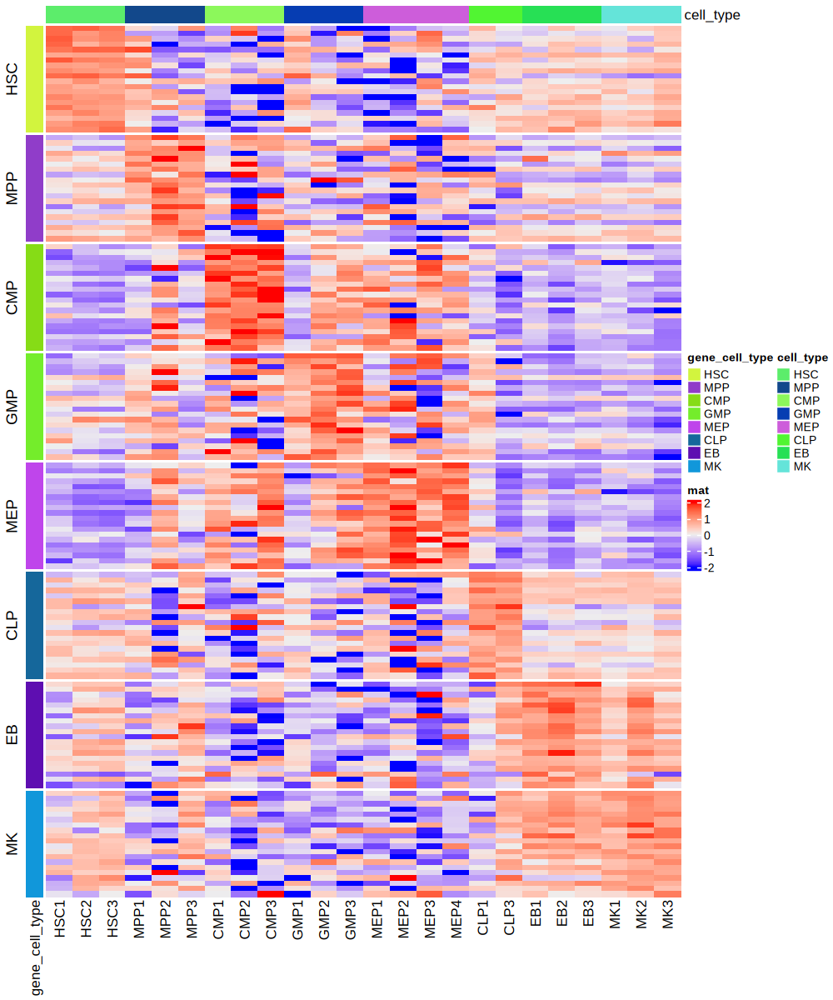

In [421]:
row_df = hmm_te_dt[logPostFC > 0, ] %>% group_by(gene_cell_type) %>% slice_min(PPEE, n = 20) %>% as.data.table()
row_df = row_df[order(row_df$gene_cell_type), ]
dim(row_df)
head(row_df)

plotdat = logcpm_te[row_df$symbol, rownames(dsn_sel)]
rownames(plotdat) = row_df$cell_type_symbol

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

#column_ann = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
options(repr.plot.width = 10, repr.plot.height = 12, repr.plot.res = 100)
column_ann = columnAnnotation(df = dsn_sel[, 'cell_type', drop = F])
row_ann = rowAnnotation(df = row_df[, 'gene_cell_type', drop = F])
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ann, left_annotation = row_ann, row_split = factor(row_df$gene_cell_type, levels = cell_types)) #, column_split  factor(dsn_all_df$cell_type, levels = cell_types))  


# EBSeqHMM multiple conditions

- this doesn't seem reasonable and more complicated, deprecated

## create pattern table 

In [84]:
CondVector = dsn_sel$cell_type
Conditions = factor(CondVector, levels = cell_types) 


In [86]:
Conditions

[1] HSC HSC HSC MPP MPP MPP CMP CMP CMP GMP GMP GMP MEP MEP MEP MEP CLP CLP EB  EB  EB  MK  MK  MK 
Levels: HSC MPP CMP GMP MEP CLP EB MK

,HSC,MPP,CMP,GMP,MEP,CLP,EB,MK
MK,1,1,1,1,1,1,1,2
EB,1,1,1,1,1,1,2,1
CLP,1,1,1,1,1,2,1,1
MEP,1,1,1,1,2,1,1,1
GMP,1,1,1,2,1,1,1,1
CMP,1,1,2,1,1,1,1,1
MPP,1,2,1,1,1,1,1,1
HSC,2,1,1,1,1,1,1,1


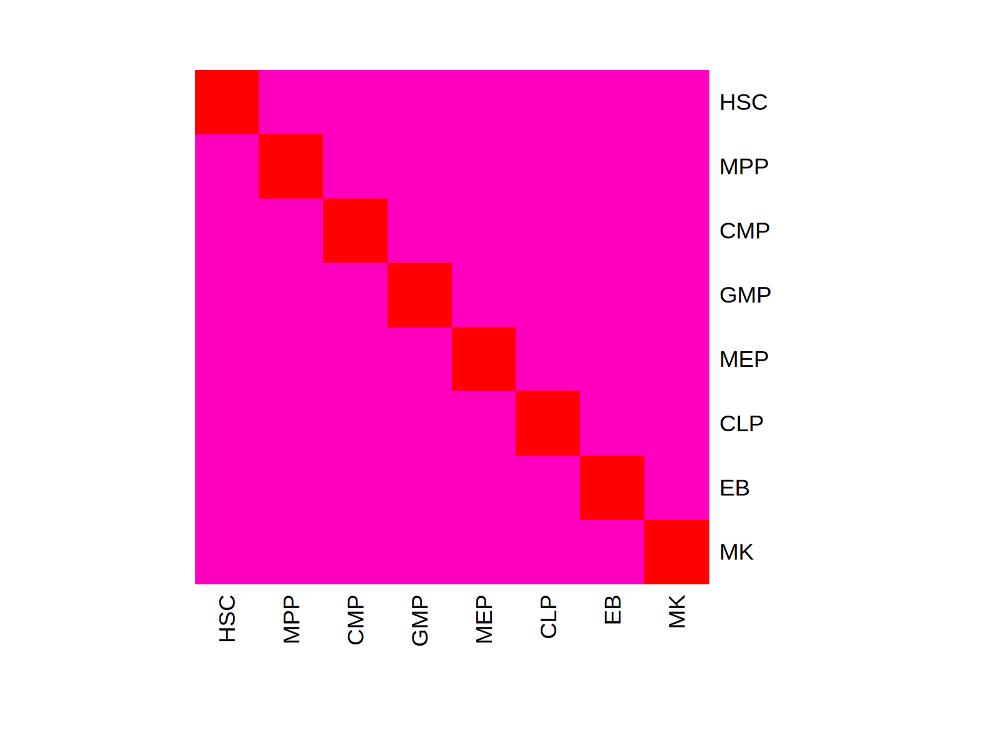

In [85]:
PosParti = GetPatterns(Conditions)
tmp1 = apply(PosParti, 1, function(rr){sum(rr == 1)})
tmp2 = apply(PosParti, 1, function(rr){sum(rr == 2)})
tmp = PosParti[tmp1 == 7 & tmp2 == 1, ]
tmp = rbind(tmp, c(2,1,1,1,1,1,1,1))
rownames(tmp) = rev(cell_types)
PosParti = tmp
PosParti



## calculate poster p values 

In [87]:
MultiSize=MedianNorm(mtx_coding_sel)
MultiOut=EBMultiTest(mtx_coding_sel, NgVector=NULL, Conditions = Conditions, AllParti = PosParti, sizeFactors = MultiSize, maxround = 19)
MultiPP=GetMultiPP(MultiOut)
names(MultiPP)
head(MultiPP$PP)

Removing transcripts with 100 th quantile < = 0 
52792 transcripts will be tested 
Initial number of DE patterns = 8
Final number of DE patterns = 8


[1] "PP"       "MAP"      "Patterns"

,pattern1,pattern2,pattern3,pattern4,pattern5,pattern6,pattern7,pattern8
A1BG,9.144256e-02,8.461523e-01,8.517042e-03,1.826956e-02,1.814617e-03,0.020544874,1.449370e-03,1.180969e-02
A1BG-AS1,9.711394e-02,3.000882e-01,2.301683e-02,2.344029e-01,2.633057e-02,0.140712403,4.023001e-02,1.381051e-01
A1CF,7.495511e-08,4.623551e-08,1.617167e-06,7.563513e-01,2.560119e-09,0.243646898,1.742020e-09,3.430486e-08
A2M,6.629503e-02,7.411348e-01,1.135324e-02,3.572656e-02,6.686180e-03,0.074543505,3.413801e-03,6.084690e-02
A2M-AS1,5.254275e-01,4.667973e-01,7.245051e-04,1.531180e-03,1.496200e-04,0.001083988,3.523358e-03,7.624894e-04
A2ML1,8.227643e-09,1.058820e-09,5.656715e-10,6.698201e-07,2.026653e-10,0.999999271,1.957679e-10,4.893200e-08


## calculate Posterior FC

In [88]:
MultiFC=GetMultiFC(MultiOut)

In [89]:
head(MultiFC$Log2FCMat)

,HSC Over MPP,HSC Over CMP,HSC Over GMP,HSC Over MEP,HSC Over CLP,HSC Over EB,HSC Over MK,MPP Over CMP,MPP Over GMP,MPP Over MEP,⋯,GMP Over MEP,GMP Over CLP,GMP Over EB,GMP Over MK,MEP Over CLP,MEP Over EB,MEP Over MK,CLP Over EB,CLP Over MK,EB Over MK
A1BG,-0.5065653,-1.5383293,-0.91140658,-1.431435,-0.05663426,3.6999819,0.9801265,-1.03176400,-0.4048413,-0.9248697,⋯,-0.5200285,0.85477231,4.6113885,1.8915331,1.3748008,5.131417,2.4115615,3.7566162,1.0367608,-2.7198554
A1BG-AS1,0.2960573,-2.1457232,0.02186821,-2.133879,-1.48689013,0.9824327,-1.3041906,-2.44178046,-0.2741890,-2.4299364,⋯,-2.1557473,-1.50875834,0.9605645,-1.3260588,0.6469890,3.116312,0.8296885,2.4693228,0.1826995,-2.2866233
A1CF,1.9891335,14.3384064,1.64093456,14.338406,14.33840639,0.6109448,0.8302016,12.34927289,-0.3481989,12.3492729,⋯,12.6974718,12.69747182,-1.0299897,-0.8107330,0.0000000,-13.727462,-13.5082048,-13.7274616,-13.5082048,0.2192568
A2M,0.2652021,0.2217470,1.28111688,0.979581,1.33405300,2.5077975,1.1407776,-0.04345513,1.0159148,0.7143789,⋯,-0.3015358,0.05293613,1.2266806,-0.1403393,0.3544720,1.528216,0.1611966,1.1737445,-0.1932754,-1.3670199
A2M-AS1,2.3683652,-0.1927312,0.10162534,-0.497975,-0.93410905,6.5468447,5.2476356,-2.56109644,-2.2667399,-2.8663402,⋯,-0.5996003,-1.03573439,6.4452193,5.1460102,-0.4361341,7.044820,5.7456106,7.4809537,6.1817446,-1.2992091
A2ML1,2.0716149,9.8385437,1.59122142,4.581937,1.79398076,1.2511072,0.2356669,7.76692882,-0.4803935,2.5103217,⋯,2.9907152,0.20275935,-0.3401142,-1.3555545,-2.7879558,-3.330829,-4.3462696,-0.5428736,-1.5583138,-1.0154403


In [90]:
head(MultiFC$Log2PostFCMat)

,HSC Over MPP,HSC Over CMP,HSC Over GMP,HSC Over MEP,HSC Over CLP,HSC Over EB,HSC Over MK,MPP Over CMP,MPP Over GMP,MPP Over MEP,⋯,GMP Over MEP,GMP Over CLP,GMP Over EB,GMP Over MK,MEP Over CLP,MEP Over EB,MEP Over MK,CLP Over EB,CLP Over MK,EB Over MK
A1BG,-0.5053017,-1.5355296,-0.90940753,-1.4776256,0.0352245,3.6497002,0.9759837,-1.03022792,-0.4041058,-0.9723238,⋯,-0.5682180,0.94463203,4.5591078,1.8853912,1.5128501,5.127326,2.4536092,3.6144757,0.94075918,-2.6737165
A1BG-AS1,0.2934107,-2.1366937,0.02169061,-2.1714803,-1.3913471,0.9711293,-1.2972539,-2.43010442,-0.2717201,-2.4648910,⋯,-2.1931709,-1.41303771,0.9494386,-1.3189445,0.7801332,3.142610,0.8742264,2.3624764,0.09409319,-2.2683832
A1CF,1.9786073,8.6359193,1.63341770,9.0066168,8.1357467,0.6090705,0.8274370,6.65731205,-0.3451896,7.0280096,⋯,7.3731991,6.50232904,-1.0243472,-0.8059807,-0.8708701,-8.397546,-8.1791798,-7.5266762,-7.30830972,0.2183665
A2M,0.2650832,0.2216491,1.28027458,0.9622362,1.3659438,2.5050388,1.1400679,-0.04343413,1.0151914,0.6971530,⋯,-0.3180384,0.08566925,1.2247642,-0.1402066,0.4037076,1.542803,0.1778318,1.1390950,-0.22587589,-1.3649708
A2M-AS1,2.3597105,-0.1924705,0.10147319,-0.5472154,-0.8381800,6.3658397,5.1724999,-2.55218096,-2.2582373,-2.9069259,⋯,-0.6486886,-0.93965316,6.2643665,5.0710268,-0.2909646,6.913055,5.7197153,7.2040197,6.01067992,-1.1933398
A2ML1,2.0666140,8.8448140,1.58807694,4.5141850,1.8672103,1.2489505,0.2353895,6.77820009,-0.4785370,2.4475711,⋯,2.9261081,0.27913333,-0.3391265,-1.3526875,-2.6469748,-3.265235,-4.2787955,-0.6182598,-1.63182079,-1.0135610


## construct target genes

In [34]:
MultiOut$Alpha
tail(MultiOut$Beta)

[1] 0.3358099

[1] 1.586578 1.622422 1.678921 1.678603 1.678295 1.678732

In [ ]:
MultiFC = GetMultiFC(MultiOut)


In [398]:
tmp = MultiPP$PP
tmp_dt = as.data.table(tmp, keep.rownames = T)


In [402]:
head(MultiFC$Log2PostFCMat)

,HSC Over MPP,HSC Over CMP,HSC Over GMP,HSC Over MEP,HSC Over CLP,HSC Over EB,HSC Over MK,MPP Over CMP,MPP Over GMP,MPP Over MEP,⋯,GMP Over MEP,GMP Over CLP,GMP Over EB,GMP Over MK,MEP Over CLP,MEP Over EB,MEP Over MK,CLP Over EB,CLP Over MK,EB Over MK
A1BG,-0.5053017,-1.5355296,-0.90940753,-1.4776256,0.0352245,3.6497002,0.9759837,-1.03022792,-0.4041058,-0.9723238,⋯,-0.5682180,0.94463203,4.5591078,1.8853912,1.5128501,5.127326,2.4536092,3.6144757,0.94075918,-2.6737165
A1BG-AS1,0.2934107,-2.1366937,0.02169061,-2.1714803,-1.3913471,0.9711293,-1.2972539,-2.43010442,-0.2717201,-2.4648910,⋯,-2.1931709,-1.41303771,0.9494386,-1.3189445,0.7801332,3.142610,0.8742264,2.3624764,0.09409319,-2.2683832
A1CF,1.9786073,8.6359193,1.63341770,9.0066168,8.1357467,0.6090705,0.8274370,6.65731205,-0.3451896,7.0280096,⋯,7.3731991,6.50232904,-1.0243472,-0.8059807,-0.8708701,-8.397546,-8.1791798,-7.5266762,-7.30830972,0.2183665
A2M,0.2650832,0.2216491,1.28027458,0.9622362,1.3659438,2.5050388,1.1400679,-0.04343413,1.0151914,0.6971530,⋯,-0.3180384,0.08566925,1.2247642,-0.1402066,0.4037076,1.542803,0.1778318,1.1390950,-0.22587589,-1.3649708
A2M-AS1,2.3597105,-0.1924705,0.10147319,-0.5472154,-0.8381800,6.3658397,5.1724999,-2.55218096,-2.2582373,-2.9069259,⋯,-0.6486886,-0.93965316,6.2643665,5.0710268,-0.2909646,6.913055,5.7197153,7.2040197,6.01067992,-1.1933398
A2ML1,2.0666140,8.8448140,1.58807694,4.5141850,1.8672103,1.2489505,0.2353895,6.77820009,-0.4785370,2.4475711,⋯,2.9261081,0.27913333,-0.3391265,-1.3526875,-2.6469748,-3.265235,-4.2787955,-0.6182598,-1.63182079,-1.0135610


In [400]:
nrow(tmp_dt[pattern1 < 0.05, ])

[1] 25318

## heatmap test for multiple conditions

In [51]:
ov = intersect(rownames(logcpm_all), EBDERes$DEfound)
row_df = data.frame(pattern = cell_types[unname(apply(tmp < 0.05, 1, which.max))], row.names = names(apply(tmp < 0.05, 1, which.max)))
row_df = row_df[ov, ,drop = F]
row_df$pattern = factor(row_df$pattern, levels = cell_types)
head(row_df)
dim(row_df)

,pattern
,<fct>
ABITRAM,EB
ABRAXAS1,EB
ACAP3,CMP
ADAMTSL4-AS2,EB
AGAP7P,CMP
AGPS,MEP


[1] 607   1

In [78]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

plotdat = logcpm_all[EBDERes$DEfound, rownames(dsn_sel)]

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ann = HeatmapAnnotation(df = dsn_sel[, 'cell_type', drop = F])
row_ann = rowAnnotation(df = row_df )
#top_annotation = column_ha, 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = T,  
        show_row_dend = F, top_annotation = column_ann, left_annotation = row_ann, row_split = row_df$pattern) #, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


ERROR: Error in logcpm_all[EBDERes$DEfound, rownames(dsn_sel)]: subscript out of bounds


In [52]:
MultiFC=GetMultiFC(MultiOut)

In [56]:
length(MultiFC)

[1] 6

In [57]:
names(MultiFC)

[1] "FCMat"          "Log2FCMat"      "PostFCMat"      "Log2PostFCMat" 
[5] "CondMeans"      "ConditionOrder"

In [59]:
head(MultiFC$Log2FCMat)

,HSC Over MPP,HSC Over CMP,HSC Over GMP,HSC Over MEP,HSC Over CLP,HSC Over EB,HSC Over MK,MPP Over CMP,MPP Over GMP,MPP Over MEP,⋯,GMP Over MEP,GMP Over CLP,GMP Over EB,GMP Over MK,MEP Over CLP,MEP Over EB,MEP Over MK,CLP Over EB,CLP Over MK,EB Over MK
A1BG,-0.5065653,-1.5383293,-0.91140658,-1.431435,-0.05663426,3.6999819,0.9801265,-1.03176400,-0.4048413,-0.9248697,⋯,-0.5200285,0.85477231,4.6113885,1.8915331,1.3748008,5.131417,2.4115615,3.7566162,1.0367608,-2.7198554
A1BG-AS1,0.2960573,-2.1457232,0.02186821,-2.133879,-1.48689013,0.9824327,-1.3041906,-2.44178046,-0.2741890,-2.4299364,⋯,-2.1557473,-1.50875834,0.9605645,-1.3260588,0.6469890,3.116312,0.8296885,2.4693228,0.1826995,-2.2866233
A1CF,1.9891335,14.3384064,1.64093456,14.338406,14.33840639,0.6109448,0.8302016,12.34927289,-0.3481989,12.3492729,⋯,12.6974718,12.69747182,-1.0299897,-0.8107330,0.0000000,-13.727462,-13.5082048,-13.7274616,-13.5082048,0.2192568
A2M,0.2652021,0.2217470,1.28111688,0.979581,1.33405300,2.5077975,1.1407776,-0.04345513,1.0159148,0.7143789,⋯,-0.3015358,0.05293613,1.2266806,-0.1403393,0.3544720,1.528216,0.1611966,1.1737445,-0.1932754,-1.3670199
A2M-AS1,2.3683652,-0.1927312,0.10162534,-0.497975,-0.93410905,6.5468447,5.2476356,-2.56109644,-2.2667399,-2.8663402,⋯,-0.5996003,-1.03573439,6.4452193,5.1460102,-0.4361341,7.044820,5.7456106,7.4809537,6.1817446,-1.2992091
A2ML1,2.0716149,9.8385437,1.59122142,4.581937,1.79398076,1.2511072,0.2356669,7.76692882,-0.4803935,2.5103217,⋯,2.9907152,0.20275935,-0.3401142,-1.3555545,-2.7879558,-3.330829,-4.3462696,-0.5428736,-1.5583138,-1.0154403


In [60]:
head(MultiFC$FCMat)

,HSC Over MPP,HSC Over CMP,HSC Over GMP,HSC Over MEP,HSC Over CLP,HSC Over EB,HSC Over MK,MPP Over CMP,MPP Over GMP,MPP Over MEP,⋯,GMP Over MEP,GMP Over CLP,GMP Over EB,GMP Over MK,MEP Over CLP,MEP Over EB,MEP Over MK,CLP Over EB,CLP Over MK,EB Over MK
A1BG,0.7038962,3.442839e-01,0.5316665,3.707619e-01,9.615046e-01,12.995875,1.9726384,0.4891117,0.7553194,0.5267281,⋯,0.6973581,1.8084733,24.4436610,3.7102929,2.5933210,3.505181e+01,5.320499e+00,1.351619e+01,2.051616e+00,0.1517896
A1BG-AS1,1.2277844,2.259815e-01,1.0152734,2.278444e-01,3.567808e-01,1.975794,0.4049482,0.1840564,0.8269150,0.1855736,⋯,0.2244168,0.3514135,1.9460712,0.3988564,1.5658967,8.671682e+00,1.777302e+00,5.537838e+00,1.135006e+00,0.2049547
A1CF,3.9699848,2.071526e+04,3.1186779,2.071526e+04,2.071526e+04,1.527259,1.7779338,5217.9698259,0.7855642,5217.9698259,⋯,6642.3214261,6642.3214261,0.4897136,0.5700922,1.0000000,7.372628e-05,8.582725e-05,7.372628e-05,8.582725e-05,1.1641337
A2M,1.2018044,1.166145e+00,2.4302705,1.971893e+00,2.521099e+00,5.687511,2.2049984,0.9703283,2.0221847,1.6407767,⋯,0.8113882,1.0373740,2.3402791,0.9073058,1.2785175,2.884290e+00,1.118214e+00,2.255965e+00,8.746178e-01,0.3876913
A2M-AS1,5.1635570,8.749478e-01,1.0729816,7.081000e-01,5.233656e-01,93.496774,37.9923115,0.1694467,0.2077989,0.1371341,⋯,0.6599368,0.4877675,87.1373503,35.4081667,0.7391125,1.320389e+02,5.365388e+01,1.786452e+02,7.259230e+01,0.4063489
A2ML1,4.2035694,9.155810e+02,3.0130433,2.394972e+01,3.467704e+00,2.380240,1.1774509,217.8103686,0.7167821,5.6974711,⋯,7.9486793,1.1508975,0.7899788,0.3907846,0.1447910,9.938491e-02,4.916346e-02,6.864024e-01,3.395477e-01,0.4946773


In [ ]:
# this file name changes to blueprint.cntTable2 after running TElocal
dsn6[, count_fname := paste0(sample_dir, '/blueprint.cntTable2')]
table(file.exists(dsn6$count_fname))


In [ ]:
table(dsn6$count_file)

In [ ]:
count_list = lapply(dsn6[count_file == 'No', count_fname], function(fname){
    tmp = fread(fname)
    sname = sub('_Aligned.sortedByCoord.out.bam', '', basename(colnames(tmp)[2]))
    setnames(tmp, 1, 'gene') 
    setnames(tmp, 2, 'value')
    tmp
})
names(count_list) = dsn6[count_file == 'No', sample_name]


In [ ]:
count_dt = rbindlist(count_list, idcol = T)
count_dt = dcast(formula = gene ~ .id, value.var = 'value', count_dt) 
head(count_dt)


In [ ]:
count_df = setDF(count_dt[, 2:ncol(count_dt)], rownames = count_dt$gene)
head(count_df)


In [ ]:
head(mtx)

In [ ]:
mtx_df = setDF(mtx[, 2:ncol(mtx)], rownames = mtx$gene)

In [ ]:
mtx_all = cbind(mtx_df, count_df[rownames(mtx_df), ])
head(mtx_all)

In [838]:
mtx_all[1:10, 1:10]

ERROR: Error in eval(expr, envir, enclos): object 'mtx_all' not found


In [839]:
# change the sample name to cell type and replications
dsn6[, tag := paste0(cell_type, '_', SAMPLE_DESC_2)]
dsn6[, cell_type_replication := as.integer(factor(.SD$tag)), by = 'cell_type']
dsn6[, sample_name_id := paste0(cell_type, cell_type_replication)]
head(dsn6[, .(sample_name_id, sample_name, tag)])


sample_name_id,sample_name,tag
<chr>,<chr>,<chr>
MEP1,Blueprint_C000WYB3_MEP_RNA_Seq_A1,MEP_C000WY
EB1,Blueprint_C006MUB1_EB_RNA_Seq_A31,EB_C006MU
EB1,Blueprint_C006MUB1_EB_RNA_Seq_A32,EB_C006MU
EB1,Blueprint_C006MUB1_EB_RNA_Seq_A33,EB_C006MU
MK1,Blueprint_C006NSB1_MK_RNA_Seq_A31,MK_C006NS
MK1,Blueprint_C006NSB1_MK_RNA_Seq_A32,MK_C006NS


In [ ]:

all_samples = unique(dsn6$sample_name_id)

# combine the reads for each sample
all_sample_rowsum_list = lapply(all_samples, function(ii_sample){
    mtx_sel = mtx_all[, dsn6[sample_name_id == ii_sample, sample_name], drop = F]
    if(ncol(mtx_sel) > 0){
        apply(mtx_sel, 1, sum)
    }
})
names(all_sample_rowsum_list) = all_samples


In [ ]:
head(all_sample_rowsum_list[[1]])

In [ ]:
tmp = lapply(all_sample_rowsum_list, function(ii){enframe(ii)})
tmp2 = rbindlist(tmp, idcol = T)
tmp3 = dcast(tmp2, name ~ .id)
setkey(tmp3, 'name')
tmp4 = tmp3[rownames(mtx_df), ]
mtx_merged = copy(tmp4)
rm(tmp, tmp2, tmp3, tmp4)


In [ ]:
head(mtx_merged)

In [ ]:
mtx_all_df = setDF(mtx_merged[, 2:ncol(mtx_merged)], rownames = mtx_merged$name)
head(mtx_all_df)


In [ ]:
dsn_all = data.table(sample_name = colnames(mtx_all_df))
dsn_all[, cell_type := sub('\\d+', '', sample_name)]
dsn_all_df = setDF(dsn_all[, 2:ncol(dsn_all)], rownames = dsn_all$sample_name)
head(dsn_all_df)


In [ ]:
# for later usage
dsn_all_df$cell_type = factor(dsn_all_df$cell_type, levels = cell_types)
dsn_all_df = dsn_all_df[order(dsn_all_df$cell_type), , drop = F]
head(dsn_all_df)


In [ ]:
fwrite(deg_te_dt, file = 'data/deg_te.xls', sep = '\t')
fwrite(deg_coding_dt, file = 'data/deg_coding.xls', sep = '\t')


In [ ]:
fwrite(mtx_all_df, file = 'data/mtx_all_df.tsv', sep = '\t', row.names = T)
fwrite(dsn_all_df, file = 'data/dsn_all_df.tsv', sep = '\t', row.names = T, col.names = T)


In [ ]:
saveRDS(mtx_all_df, file = 'data/mtx_all_df.rds')
saveRDS(dsn_all_df, file = 'data/dsn_all_df.rds')


In [12]:
mtx_all_df = readRDS('data/mtx_all_df.rds')
dsn_all_df = readRDS('data/dsn_all_df.rds')


In [21]:
deg_te_dt =  fread('data/deg_te.xls') 
deg_coding_dt = fread('data/deg_coding.xls')

mtx_all_df = readRDS(file = 'data/mtx_all_df_may15.rds')
dge_all = readRDS(file = 'data/dge_all_may1.rds')
fit_all = readRDS(file = 'data/fit_all_may1.rds')
logcpm_all_t = readRDS(file = 'data/logcpm_all_t_may1.rds')
logcpm_all = readRDS( file = 'data/logcpm_all_may1.rds')


# back up code

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
qc = as.data.table(enframe(apply(mtx_all_df, 2, sum)) )
qc[, name := factor(name, levels = sample_names)] 
ggplot(qc, aes(name, value)) + geom_bar(stat = 'identity') + theme_pubr() + theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1))


In [ ]:
sample_names

In [ ]:
st_1 = as.data.table(read_xlsx('1251033s.xlsx', sheet = 1, skip = 1, n_max = 25) )
head(st_1)


In [ ]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
st_1 = as.data.table(read_xlsx('1251033s.xlsx', sheet = 1, skip = 1, n_max = 25) )
setnames(st_1, 5, 'reads')
st_1[, Sample := factor(Sample, levels = sample_names)]
st_1 = st_1[order(Sample), ]
ggplot(st_1, aes(Sample, reads)) +  geom_bar(stat = 'identity') + theme_pubr() + theme(axis.text.x = element_text(angle = 90, vjust = .5, hjust = 1))

In [ ]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
qc[, value2 := value / 1000000] 
plotdat = merge(st_1[, .(Sample, reads)], qc, by.x = 'Sample', by.y = 'name')
plotdat[, Sample := factor(Sample, levels = sample_names) ]
plotdat = plotdat[order(Sample)]
plotdat[, cell_type := sub('\\d+', '', Sample)] 
ggplot(plotdat, aes(reads, value2)) + geom_point() + theme_pubr() + xlab('online: Reads after trimming x10^6') + ylab('ours: aligned counted x10^6') +
  stat_smooth(method = "lm",  formula = y ~ x,  geom = "smooth")  + stat_cor(p.accuracy = 0.001, r.accuracy = 0.01)



In [ ]:
head(st_1)
head(qc)

## PCA

In [ ]:
rsum = rowSums(logcpm_coding)
rsd  = rowSds(logcpm_coding)
summary(rsum)
summary(rsd)

In [ ]:
logcpm_coding[1:10,1:10]

In [ ]:
plotdat = logcpm_coding[rsum > 41 & rsd > .75, ]
plotdat = scale(plotdat, scale = F, center = T)
plotdat = prcomp(t(plotdat))
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 200)
plot(plotdat, main = '')


In [ ]:
plotdat_x = as.data.table(plotdat$x, keep.rownames = T)
plotdat_x[, cell_type := sub('\\d+', '', rn)]


In [ ]:
options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat_x, aes(PC1, PC2, label = rn, color = cell_type)) + geom_point() + theme_pubr() + geom_text_repel()

In [ ]:
plotdat[1:3, 1:3]

In [ ]:
# cluster analysis
options(repr.plot.width = 14, repr.plot.height = 14, repr.plot.res = 200)
plotdat = logcpm_coding[rsum > 41 & rsd > .75, ]
plotdat = cor(plotdat)
plotdat = round(plotdat, 2)
corrplot.mixed(plotdat, order = 'AOE') 


In [ ]:
mtx_coding_df = mtx_all_df[coding_genes, ]
mtx_te_df = mtx_all_df[!rownames(mtx_all_df) %in% coding_genes, ]
dsn_all_df$cell_type


In [14]:
GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf"
TE_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"


In [ ]:
# TE gene list:
! cat /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf \ 
| sed 's/.*family_id "//' | sed 's/".*//' |sort -u > te_gene_list 
# coding gene list:
! cat /research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/hs1.ncbiRefSeq.gtf | sed 's/.*gene_id "//' | sed 's/".*//' |sort -u > coding_gene_list 


In [15]:
coding_genes = read.table('coding_gene_list', header = F)$V1
te_genes = read.table('te_gene_list', header = F)$V1


In [ ]:
print(length(sample_names))

In [16]:
sample_names_n24 = setdiff(sample_names, 'CLP2')
sample_names_n24

[1] "HSC1" "HSC2" "HSC3" "MPP1" "MPP2" "MPP3" "CMP1" "CMP2" "CMP3" "GMP1"
[11] "GMP2" "GMP3" "MEP1" "MEP2" "MEP3" "MEP4" "CLP1" "CLP3" "EB1"  "EB2" 
[21] "EB3"  "MK1"  "MK2"  "MK3"

In [ ]:
mtx_all_df = mtx_all_df[, sample_names_n24] 
dsn_all_df = dsn_all_df[sample_names_n24, ,drop = F]

In [ ]:
dsn_all_df = data.frame(cell_type = sub('\\d+', '', sample_names_n24), row.names = sample_names_n24)
head(dsn_all_df)


In [ ]:
dim(mtx_all_df)

In [20]:
dsn_all = as.data.table(dsn_all_df, keep.rownames = T)
head(dsn_all)

rn,cell_type
<chr>,<fct>
HSC1,HSC
HSC2,HSC
HSC3,HSC
MPP1,MPP
MPP2,MPP
MPP3,MPP


In [ ]:
# take all together for logcpm
subtype = factor(dsn_all_df$cell_type)
subtype = relevel(subtype, ref = 'HSC')

dge_all = DGEList(counts=mtx_all_df, group = subtype)
dge_all <- calcNormFactors(dge_all)

keep = filterByExpr(dge_all)
dge_all = dge_all[keep, , keep.lib.sizes=FALSE]
dge_all = normLibSizes(dge_all)
design = model.matrix( ~  subtype)
dge_all = estimateDisp(dge_all, design)
fit_all = glmQLFit(dge_all, design, robust = T)

logcpm_all = log1p(cpm(dge_all, normalize = T))
logcpm_all_t = merge(as.data.table(t(logcpm_all), keep.rownames = T), dsn_all, by.x = 'rn', by.y = 'rn', all.x = T)
head(logcpm_all_t)



In [ ]:
saveRDS(mtx_all_df, file = 'data/mtx_all_df_may15.rds')
saveRDS(dge_all, file = 'data/dge_all_may1.rds')
saveRDS(fit_all, file = 'data/fit_all_may1.rds')
saveRDS(logcpm_all_t, file = 'data/logcpm_all_t_may1.rds')
saveRDS(logcpm_all, file = 'data/logcpm_all_may1.rds')


In [ ]:
mtx_all_df = readRDS(file = 'data/mtx_all_df_may15.rds')
dge_all = readRDS(file = 'data/dge_all_may1.rds')
fit_all = readRDS(file = 'data/fit_all_may1.rds')
logcpm_all_t = readRDS(file = 'data/logcpm_all_t_may1.rds')
logcpm_all = readRDS( file = 'data/logcpm_all_may1.rds')


### based on the gene list from the paper

In [ ]:
head(st_4)

In [ ]:
table(st_4$Model)

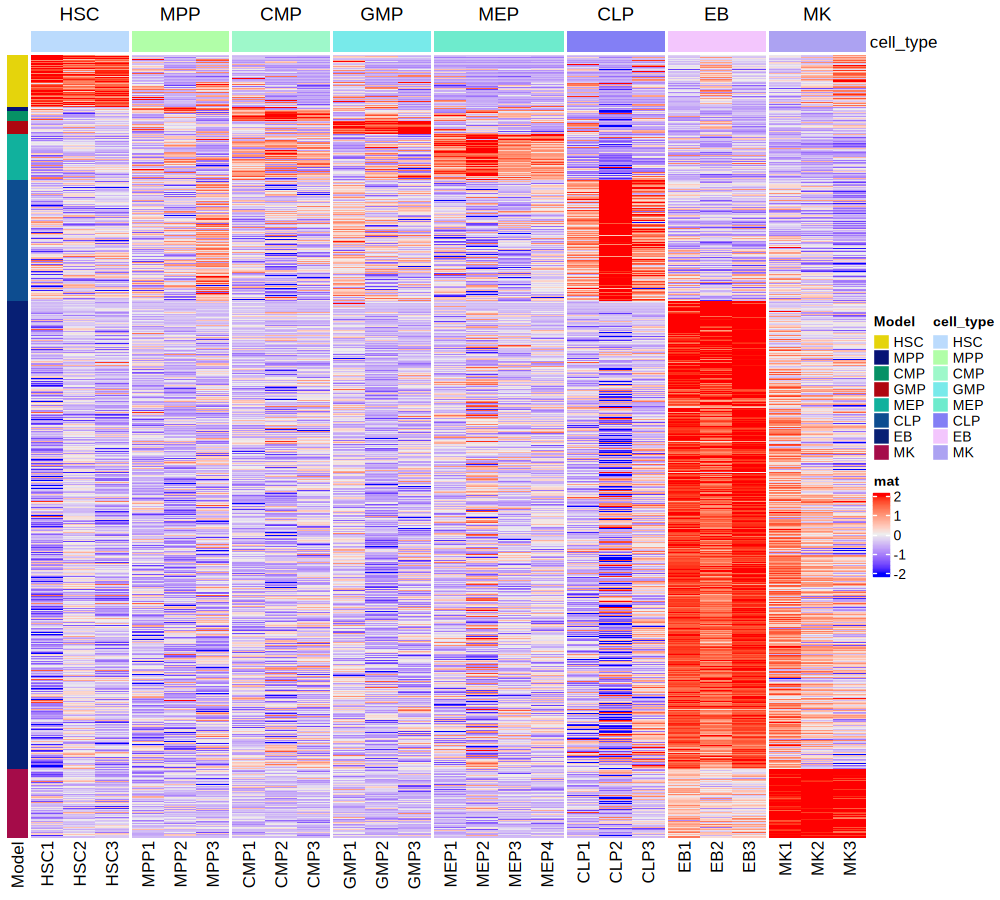

In [672]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

st_4 = as.data.table(read_xlsx('data/1251033s.xlsx', sheet = 4, skip = 1)  )
setnames(st_4, 9, 'pval')
sig_genes = st_4$External_gene_id
sig_genes = intersect(sig_genes, rownames(logcpm_coding))

st_4_sel = st_4[External_gene_id %in% sig_genes, ]
st_4_sel[, ctype_gene := paste0(Model, '_', External_gene_id)]
st_4_sel[, Model := factor(Model, levels = cell_types)]
st_4_sel = st_4_sel[order(Model), ]

plotdat = logcpm_coding[st_4_sel$External_gene_id, rownames(dsn_all_df)]
rownames(plotdat) = st_4_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = st_4_sel[, .(Model)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [ ]:
st_4 = as.data.table(read_xlsx('data/1251033s.xlsx', sheet = 4, skip = 1)  )
setnames(st_4, 9, 'pval')
st_4_sel = st_4 %>% group_by(Model) %>% slice_min(order_by = pval, n = 20)
dim(st_4_sel)
head(st_4_sel)

In [ ]:
head(deg_coding_dt)

In [ ]:
colnames(st_4)

In [ ]:
st_4 = as.data.table(read_xlsx('data/1251033s.xlsx', sheet = 4, skip = 1)  )
sig = deg_coding_dt[FDR < .1, rn]
summary(st_4[External_gene_id %in% sig, `Second posterior probability`])


In [678]:
dsn_all_df = data.frame(cell_type = sub('\\d+', '', sample_names_n24), row.names = sample_names_n24)
dim(dsn_all_df)

[1] 24  1

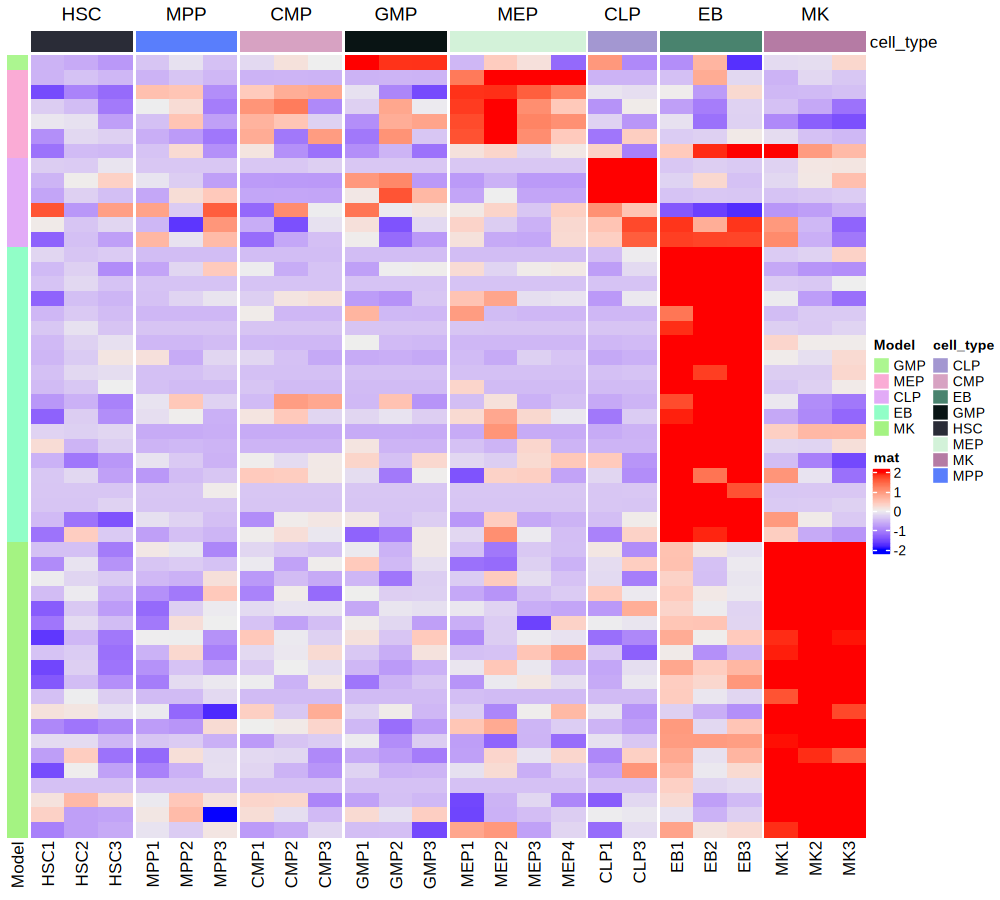

In [679]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

st_4 = as.data.table(read_xlsx('data/1251033s.xlsx', sheet = 4, skip = 1)  )
st_4 = st_4[External_gene_id %in% deg_coding_dt[FDR < 0.05, rn], ]
setnames(st_4, 9, 'pval')
st_4_sel = st_4 %>% group_by(Model) %>% slice_min(order_by = pval, n = 20)
st_4_sel = as.data.table(st_4_sel)

sig_genes = intersect(sig_genes, rownames(logcpm_coding))

st_4_sel = st_4_sel[External_gene_id %in% sig_genes, ]
st_4_sel[, ctype_gene := paste0(Model, '_', External_gene_id)]
st_4_sel[, Model := factor(Model, levels = cell_types)]
st_4_sel = st_4_sel[order(Model), ]

plotdat = logcpm_coding[st_4_sel$External_gene_id, rownames(dsn_all_df)]
rownames(plotdat) = st_4_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = st_4_sel[, .(Model)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


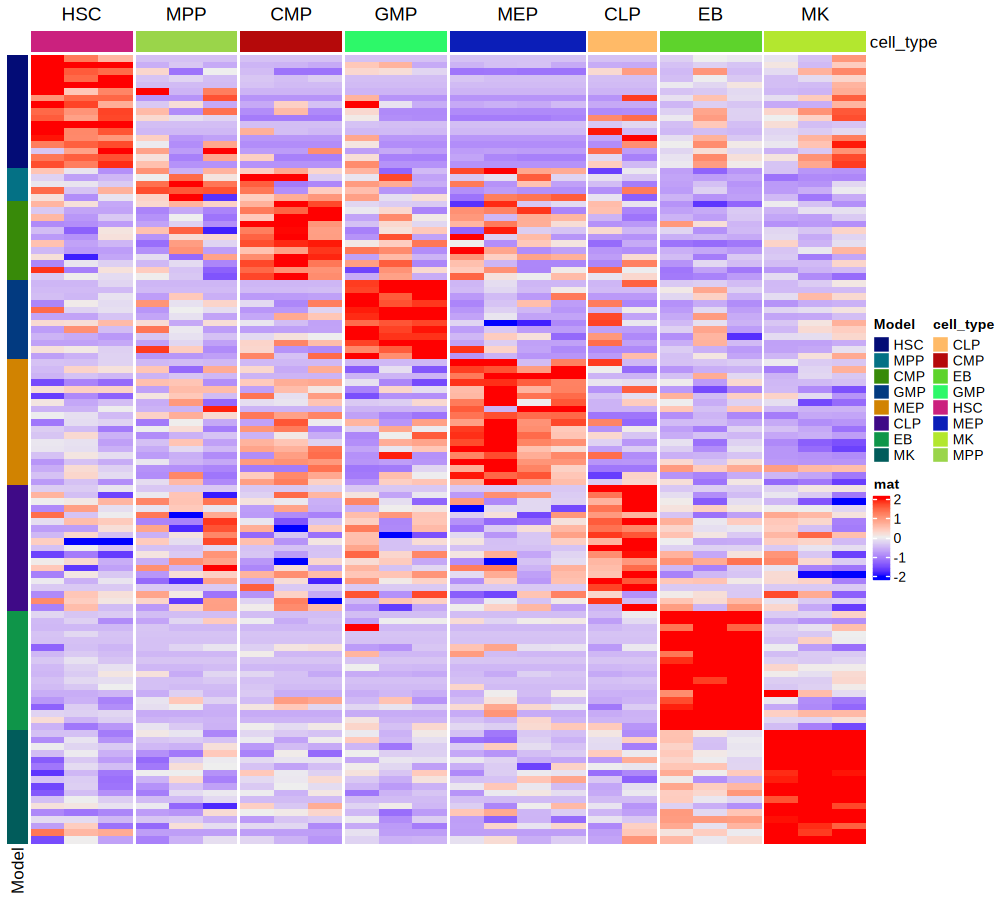

In [680]:
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

st_4 = as.data.table(read_xlsx('data/1251033s.xlsx', sheet = 4, skip = 1)  )
setnames(st_4, 9, 'pval')
st_4_sel = st_4 %>% group_by(Model) %>% slice_min(order_by = pval, n = 20)
st_4_sel = as.data.table(st_4_sel)

sig_genes = intersect(sig_genes, rownames(logcpm_coding))

st_4_sel = st_4_sel[External_gene_id %in% sig_genes, ]
st_4_sel[, ctype_gene := paste0(Model, '_', External_gene_id)]
st_4_sel[, Model := factor(Model, levels = cell_types)]
st_4_sel = st_4_sel[order(Model), ]

plotdat = logcpm_coding[st_4_sel$External_gene_id, rownames(dsn_all_df)]
rownames(plotdat) = st_4_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = st_4_sel[, .(Model)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, cluster_rows = F,  
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


### overlap between two analysis 

Coordinate system already present. Adding new coordinate system, which will replace the existing one.


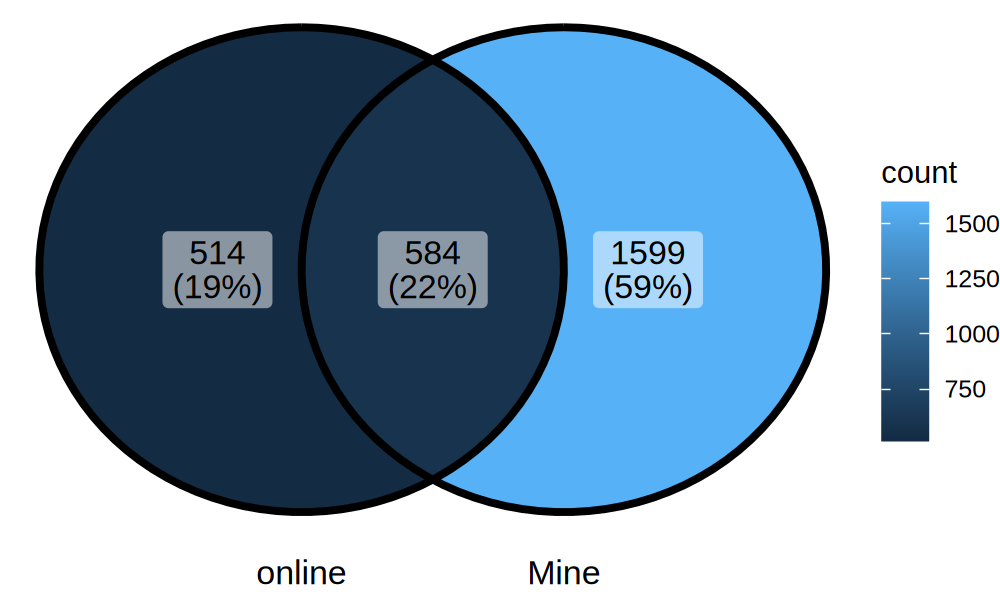

In [681]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
gene_sel = unique(deg_coding_dt[FDR < 0.1 & logFC > 0, rn])
ggVennDiagram(list(online = st_4$External_gene_id, Mine = gene_sel)) + coord_flip() 


Coordinate system already present. Adding new coordinate system, which will replace the existing one.


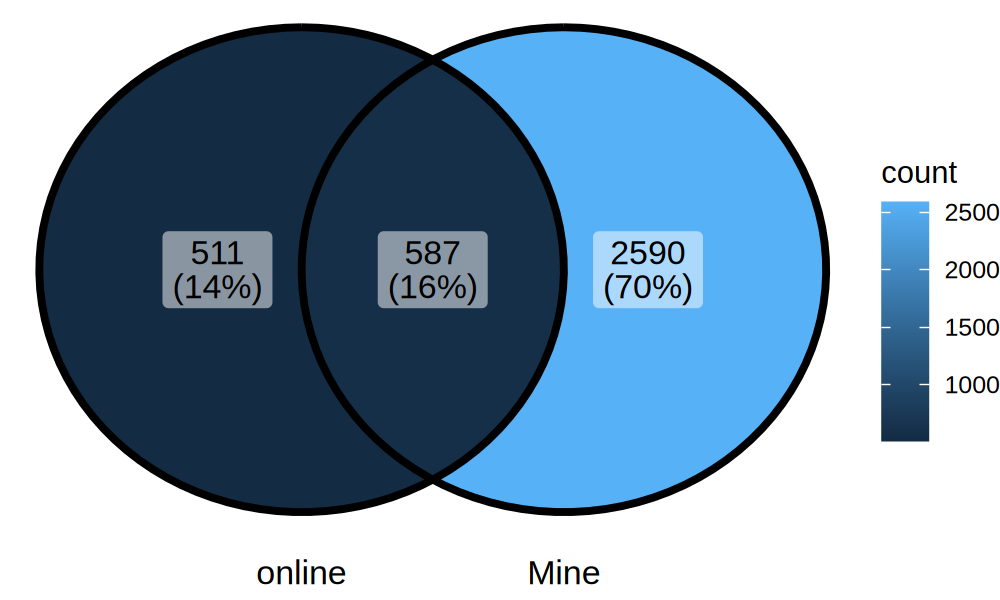

In [682]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
gene_sel = unique(deg_coding_dt[FDR < 0.1, rn])
ggVennDiagram(list(online = st_4$External_gene_id, Mine = gene_sel)) + coord_flip() 


### based on the sig genes from this analysis

In [683]:
logcpm_coding_t[1:3, ]

rn,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2MP1,A4GALT,A4GNT,⋯,ZXDA,ZXDB,ZXDC,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZZEF1,ZZZ3,cell_type
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
CLP1,0.2455252,0.009550539,0,2.42367147,2.919004,0.000000,2.38907214,0,0.009550539,⋯,1.4408663,0.19154423,3.000074,0,0,2.22492733,4.2183973,3.07771753,3.2672181,CLP
CLP2,1.0554484,0.000000000,0,0.02130323,0.000000,0.000000,0.02130323,0,0.000000000,⋯,0.0000000,5.59529324,3.526601,0,0,0.02130323,3.5772157,0.06259471,0.1022486,CLP
CLP3,1.6267041,1.661039277,0,1.24074000,0.000000,1.445273,1.27027429,0,0.000000000,⋯,0.1251111,0.07142846,2.920351,0,0,2.51669224,0.4175842,2.09284703,3.9639706,CLP


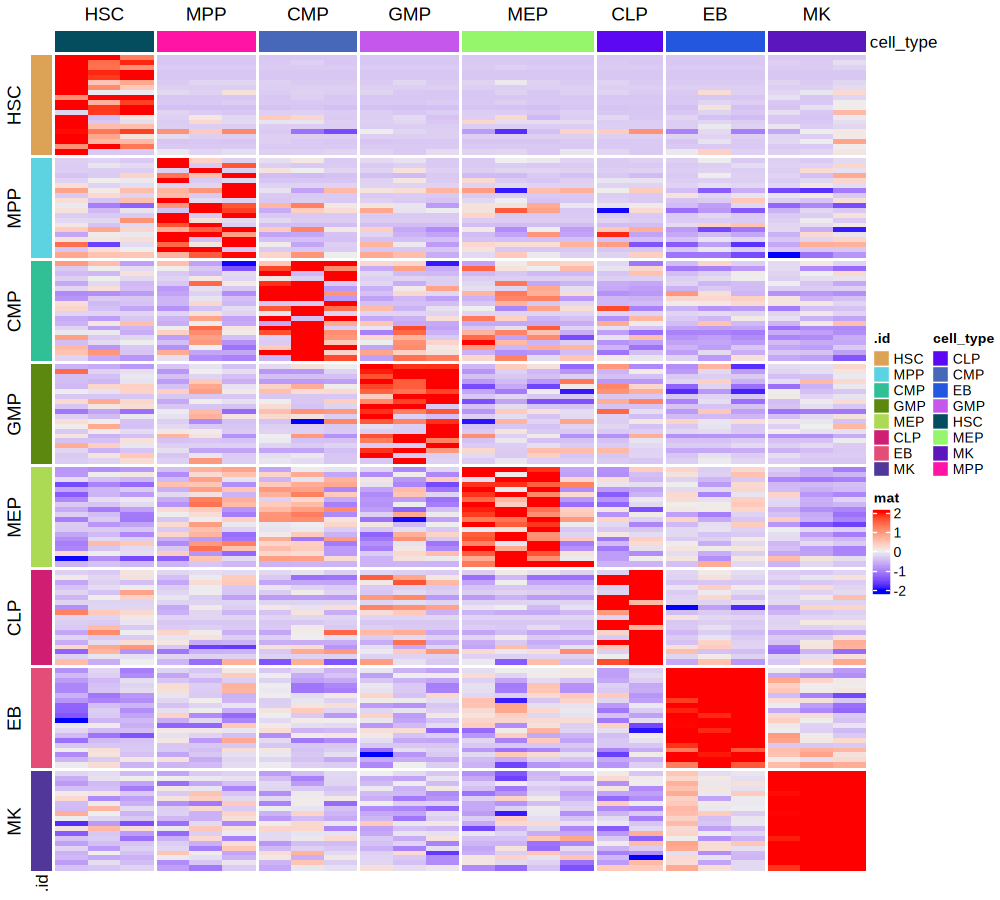

In [684]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_coding_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_coding))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_coding[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

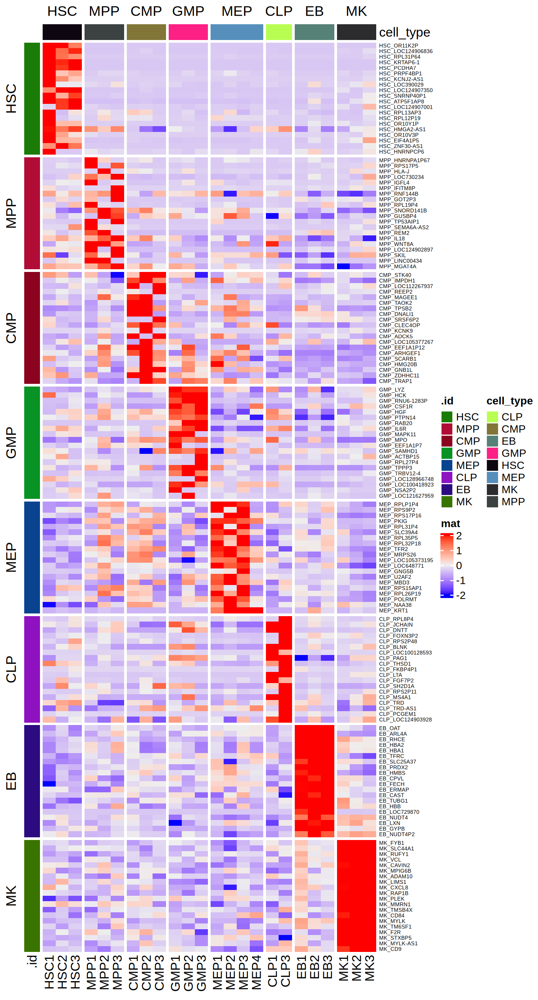

In [685]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 7, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_coding_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_coding))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_coding[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id,   row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

In [686]:
head(row_sel)

.id,rn,logFC,logCPM,PValue,FDR,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HSC,OR11K2P,9.380614,-2.944438,2.118393e-09,0.0000838354,HSC_OR11K2P
HSC,LOC124906836,7.401834,-2.141472,2.917073e-08,0.0005772158,HSC_LOC124906836
HSC,RPL31P64,8.223059,-3.186283,6.894059e-08,0.0009094413,HSC_RPL31P64
HSC,KRTAP6-1,7.981290,-4.024737,9.548944e-08,0.0009447486,HSC_KRTAP6-1
HSC,PCDHA7,7.744114,-4.179213,1.936259e-07,0.0015325491,HSC_PCDHA7
HSC,PRPF4BP1,5.585529,-3.700205,5.287894e-07,0.0034878068,HSC_PRPF4BP1


In [ ]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x =PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


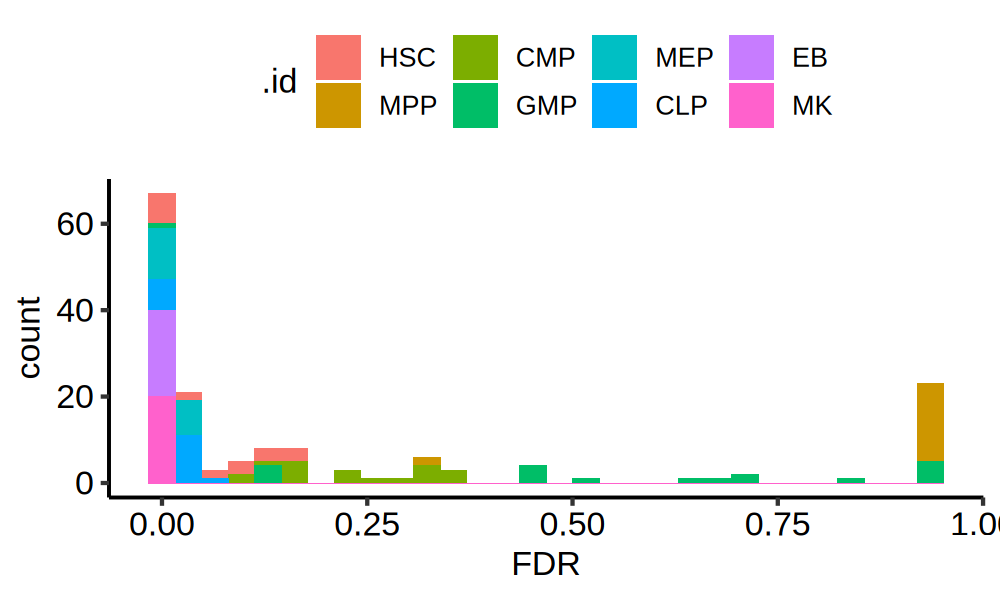

In [687]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


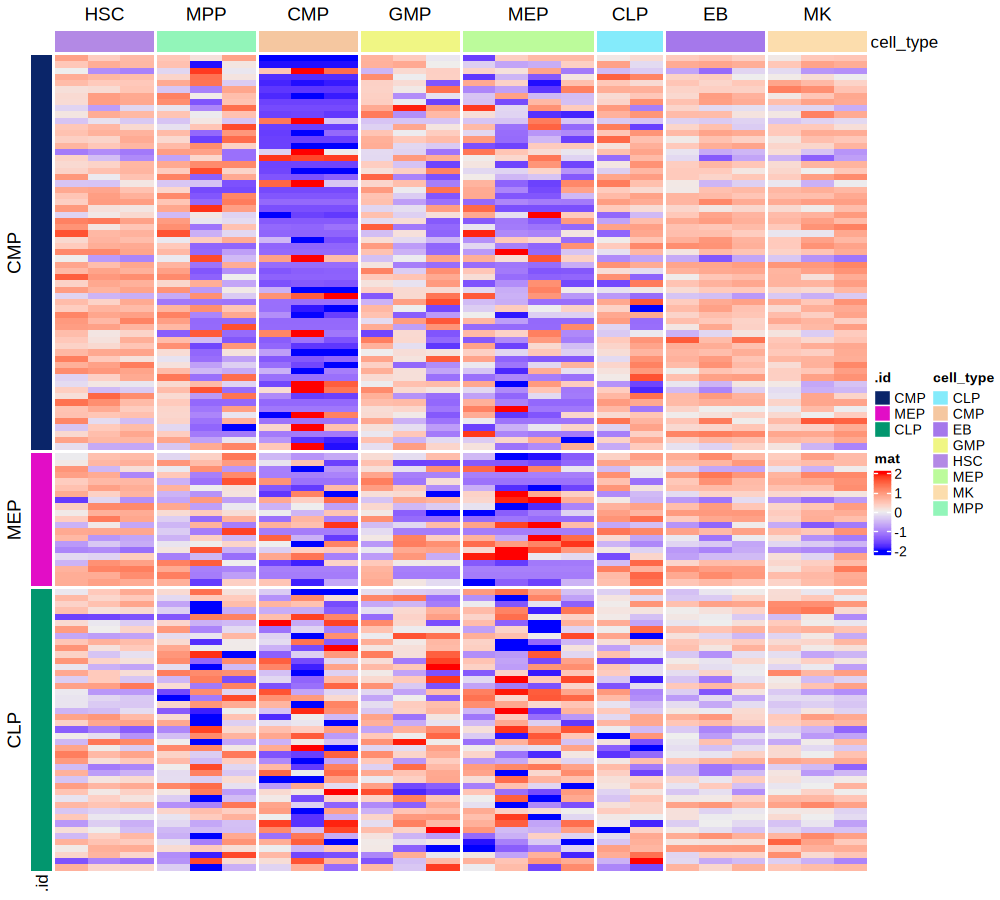

In [688]:
# significant TEs
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

In [689]:
table(sign(row_sel$logFC))


-1  1 
66 63 

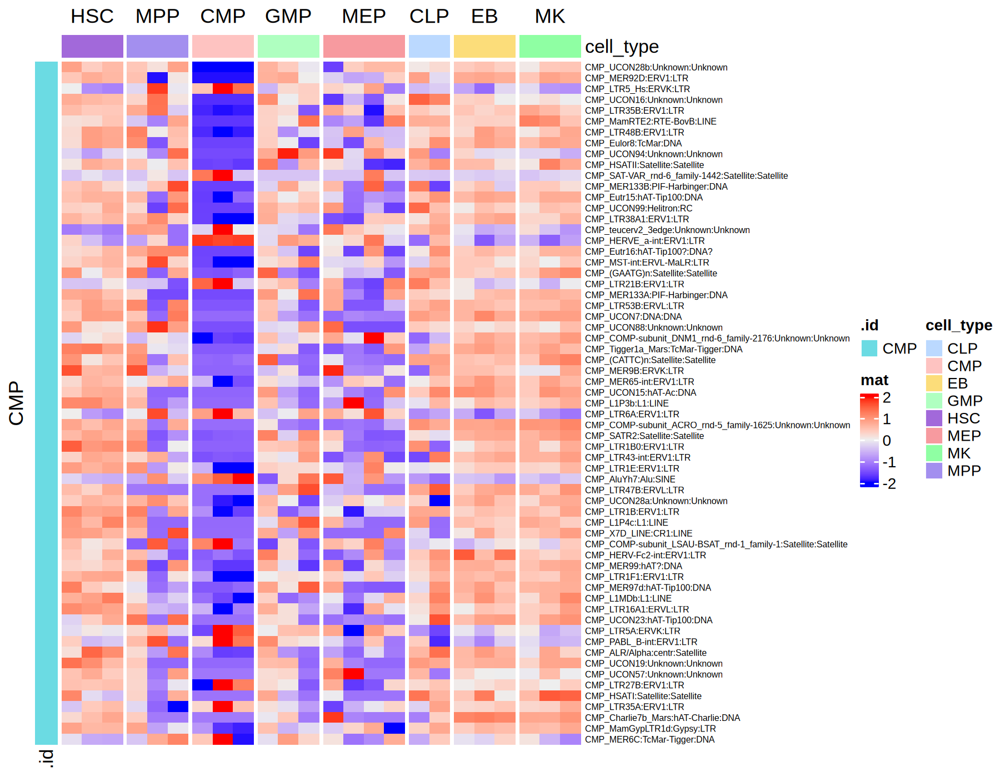

In [690]:
# significant TEs
options(repr.plot.width = 9, repr.plot.height = 7, repr.plot.res = 200)

row_sel = deg_te_dt[abs(logFC) > 1 & FDR < 0.1, ]
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ][.id == 'CMP', ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id,   row_names_gp = grid::gpar(fontsize = 5.5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

In [691]:
table(sign(row_sel$logFC))


-1  1 
50 13 

In [692]:
nrow( deg_te_dt[.id == 'MK' & logFC > 0 & FDR < 0.1, ] )

[1] 0

In [693]:
mk = deg_te_dt[logFC > 0 & .id == 'MK', ] %>% slice_min(order_by = PValue, n = 20)


In [694]:
head(deg_te_dt)

.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>
HSC,FLAM_C:Alu:SINE,-0.9128241,12.467095,0.003354908,0.5944787,NA,1,SINE,Alu,FLAM_C
HSC,UCON44:TcMar-Tigger:DNA,-1.6884823,7.812925,0.004110851,0.5944787,NA,2,DNA,TcMar-Tigger,UCON44
HSC,L1ME3G:L1:LINE,-0.5030516,12.483404,0.005752892,0.5944787,NA,3,LINE,L1,L1ME3G
HSC,L1ME4a:L1:LINE,-0.5586001,12.695243,0.007049395,0.5944787,NA,4,LINE,L1,L1ME4a
HSC,MER33:hAT-Charlie:DNA,-0.7200624,10.986634,0.008228203,0.5944787,NA,5,DNA,hAT-Charlie,MER33
HSC,ERVL-B4-int:ERVL:LTR,0.6461831,8.966138,0.009950680,0.5944787,NA,6,LTR,ERVL,ERVL-B4-int


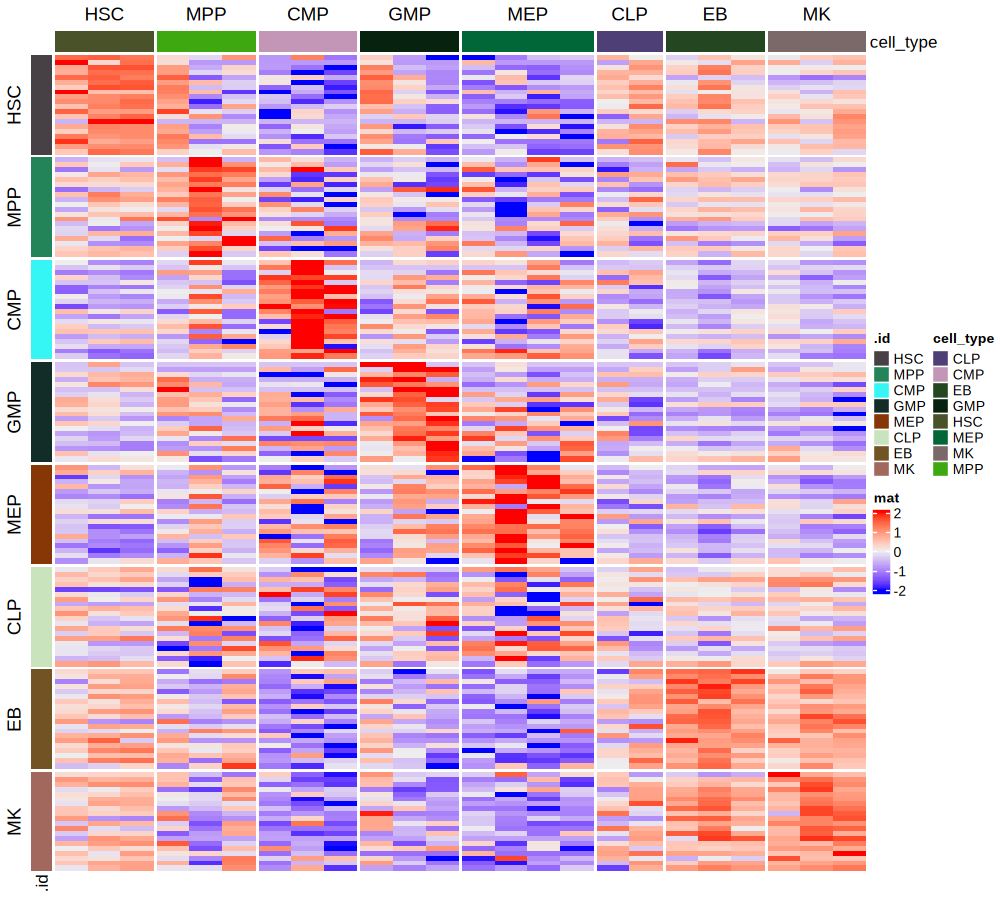

In [695]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

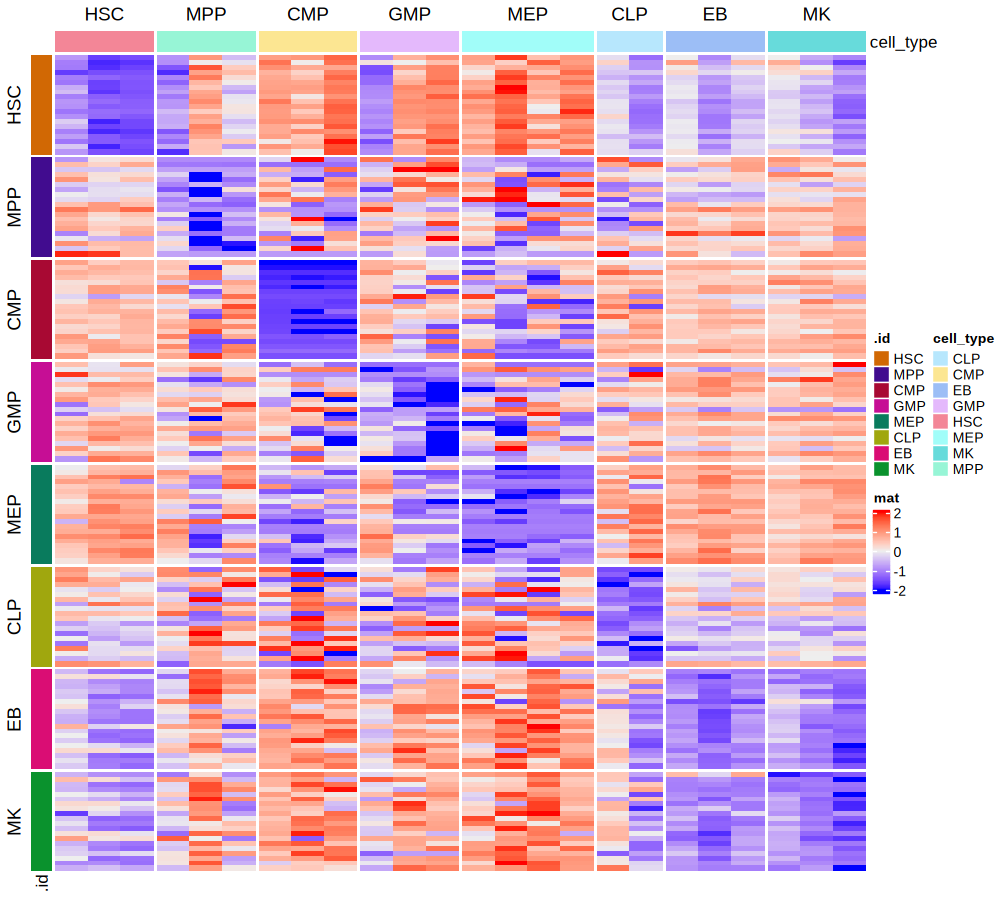

In [696]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_te_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


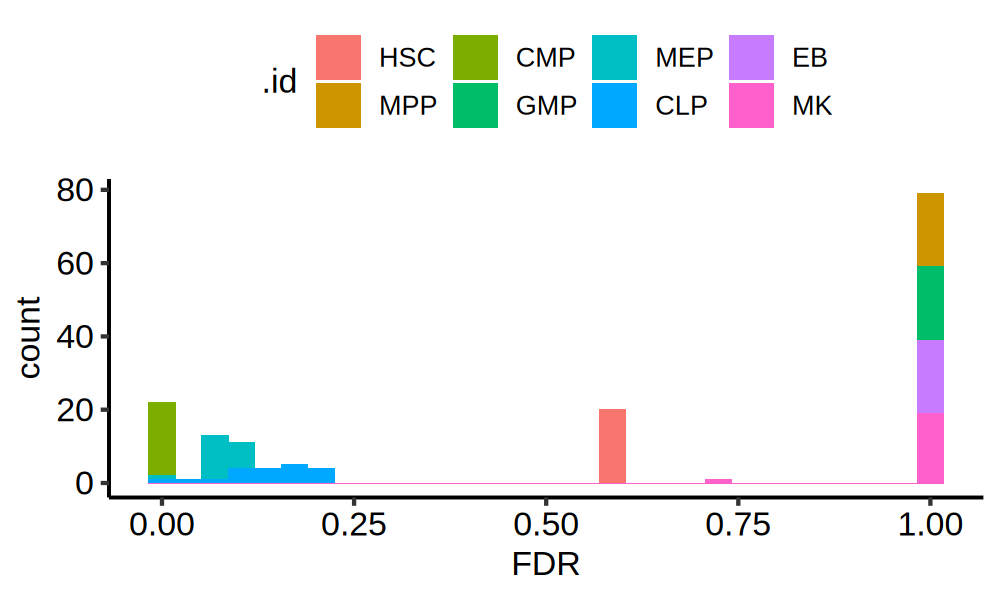

In [697]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


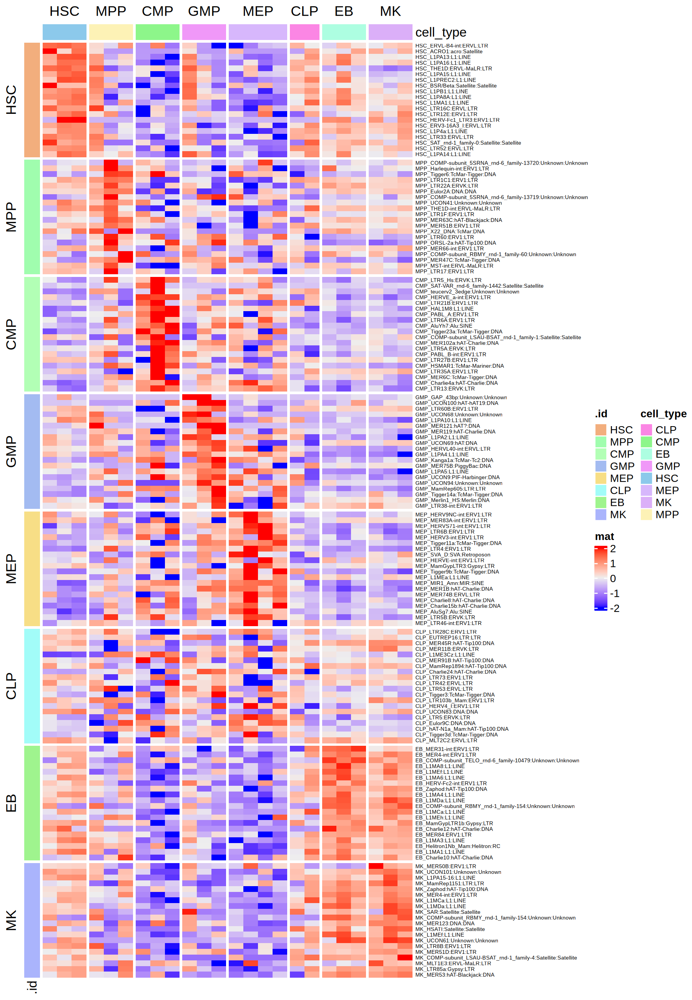

In [699]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 9, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_te_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = F, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


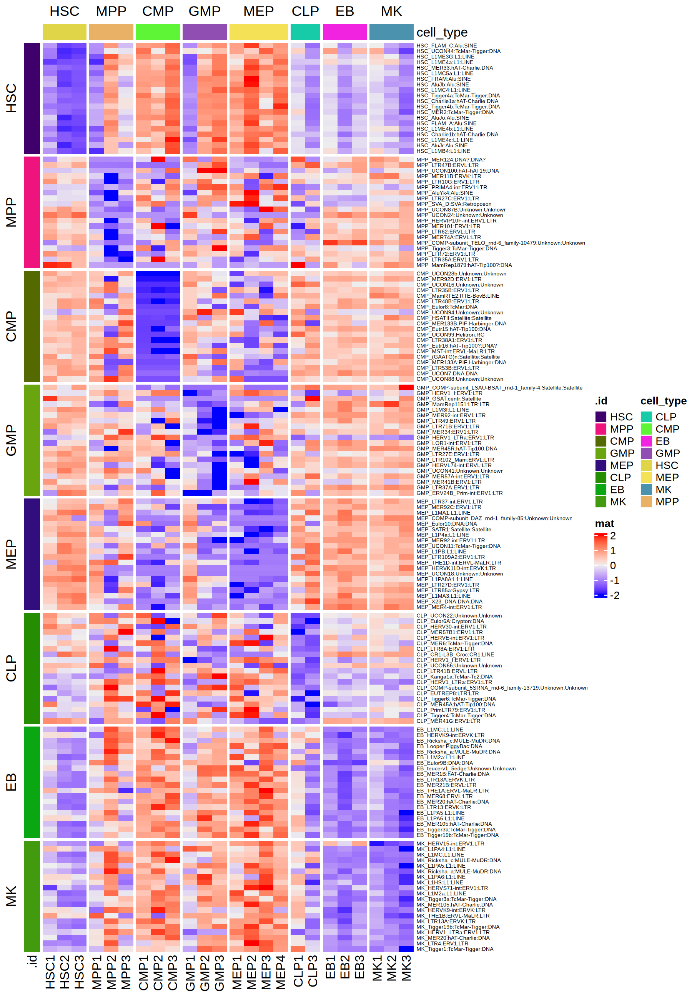

In [701]:
# top 20 up-regulated te genes for each cell type
options(repr.plot.width = 9, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_te_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_te))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_te[row_sel$rn, rownames(dsn_all_df)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [114]:
head(row_sel)

.id,rn,logFC,logCPM,PValue,FDR,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HSC,ERVL-B4-int:ERVL:LTR,0.6461831,8.9661377,0.00995068,0.5944787,HSC_ERVL-B4-int:ERVL:LTR
HSC,ACRO1:acro:Satellite,2.7482259,-0.9587067,0.01463087,0.5944787,HSC_ACRO1:acro:Satellite
HSC,L1PA13:L1:LINE,0.5100995,11.3827194,0.01521246,0.5944787,HSC_L1PA13:L1:LINE
HSC,L1PA16:L1:LINE,0.5246390,11.9908499,0.02056969,0.5944787,HSC_L1PA16:L1:LINE
HSC,THE1D:ERVL-MaLR:LTR,0.3698013,10.9466090,0.02080387,0.5944787,HSC_THE1D:ERVL-MaLR:LTR
HSC,L1PA15:L1:LINE,0.3740317,11.6198445,0.02907687,0.5944787,HSC_L1PA15:L1:LINE


## import telocal count data

In [326]:
# the TE family DEG based on TEcount analysis
deg_te_dt[, class_id := unlist(strsplit(rn, ':'))[3], by = 1:nrow(deg_te_dt)]
deg_te_dt[, family_id:= unlist(strsplit(rn, ':'))[2], by = 1:nrow(deg_te_dt)]
deg_te_dt[, gene_id := unlist(strsplit(rn, ':'))[1], by = 1:nrow(deg_te_dt)]

## decide the TEs to analysis


In [805]:
deg_te_dt[, idd := 1:nrow(deg_te_dt)]
deg_te_dt_sel = deg_te_dt %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
deg_te_dt_sel = rbind(deg_te_dt_sel, deg_te_dt[FDR < 0.1,]) %>% as.data.table()
deg_te_dt_sel = deg_te_dt_sel[!duplicated(idd), ]
head(deg_te_dt_sel)


.id,rn,logFC,logCPM,PValue,FDR,sel,idd,class_id,family_id,gene_id
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<lgl>,<int>,<chr>,<chr>,<chr>
CLP,LTR28C:ERV1:LTR,2.752677,6.486922,1.827448e-09,2.320858e-06,TRUE,6343,LTR,ERV1,LTR28C
CLP,EUTREP16:LTR:LTR,2.168245,5.857023,3.668335e-07,2.329393e-04,TRUE,6344,LTR,LTR,EUTREP16
CLP,MER45R:hAT-Tip100:DNA,2.719814,6.380868,6.223043e-07,2.634421e-04,TRUE,6345,DNA,hAT-Tip100,MER45R
CLP,MER11B:ERVK:LTR,2.857181,5.773299,3.118558e-06,9.901420e-04,TRUE,6346,LTR,ERVK,MER11B
CLP,L1ME3Cz:L1:LINE,1.112515,11.985298,7.606676e-06,1.932096e-03,TRUE,6347,LINE,L1,L1ME3Cz
CLP,MER91B:hAT-Tip100:DNA,1.489138,7.039102,1.181644e-05,2.501146e-03,TRUE,6348,DNA,hAT-Tip100,MER91B


In [807]:
length(intersect(deg_te_dt_sel$family_id, te_dt$family_id))
length(intersect(deg_te_dt_sel$gene_id, te_dt$gene_id))
length(unique(deg_te_dt_sel$gene_id))


[1] 33

[1] 245

[1] 245

In [ ]:
- The first column corresponds to the rosette file column on which the read count was performed.
- If more than one variable column was provided in the rosette file, they will be put after the first column.
- The next following column(s), but the last, correspond to the number of mapping reads for each sample (fastq/sam files).
- The last column corresponds to the total of these counts.

## organize TE GTF

In [31]:
# te table
te_dt = fread('/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf')
setnames(te_dt, c('chr', 'rmsk', 'exon', 'start', 'end', 'width', 'strand', 'score', 'info'))
te_dt[, gene_id       := sub('gene_id "(.*)"; transcript_id "(.*)"; family_id "(.*)"; class_id "(.*)";', '\\1', info)]
te_dt[, transcript_id := sub('gene_id "(.*)"; transcript_id "(.*)"; family_id "(.*)"; class_id "(.*)";', '\\2', info)]
te_dt[, family_id     := sub('gene_id "(.*)"; transcript_id "(.*)"; family_id "(.*)"; class_id "(.*)";', '\\3', info)]
te_dt[, class_id      := sub('gene_id "(.*)"; transcript_id "(.*)"; family_id "(.*)"; class_id "(.*)";', '\\4', info)]
te_dt[, idd := paste0(transcript_id, ':', gene_id, ':', family_id, ':', class_id)]
te_dt[, idd_2 := paste0(chr, '_', start, '_', end, '__', transcript_id, ':', gene_id, ':', family_id, ':', class_id)]
te_dt[, info := NULL]
#TE_GTF_FILE= "/research/groups/jxugrp/home/common/Lab_Members/SyedAhmad/Projects_Main_Farhan/trimmed_copy_leukemia_samples/testig_new_T2T_GTF/T2T_CHM13_v2_rmsk_TE.gtf"
#TE_loc_GTF_FILE="/research/groups/jxugrp/home/common/Lab_Members/WenhuoHu/collab_Farhan/data/T2T-CHM13v2_rmsk_TE.gtf.locInd"

head(te_dt)
# chr1    UCSC_rmsk       exon    2710    4402    5119    -       .       gene_id "TAR1"; transcript_id "TAR1_dup164"; family_id "subtelo"; class_id "Satellite";


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR,chr1_4534_4660__LTR60B_dup191:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE
chr1,UCSC_rmsk,exon,5275,5528,1403,+,.,MER34C_v,MER34C_v_dup375,ERV1,LTR,MER34C_v_dup375:MER34C_v:ERV1:LTR,chr1_5275_5528__MER34C_v_dup375:MER34C_v:ERV1:LTR
chr1,UCSC_rmsk,exon,5529,5686,3544,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_5529_5686__L1MC3_dup5932:L1MC3:L1:LINE


In [323]:
nrow(te_dt[family_id %in% deg_te_dt_sel$rn, ])

[1] 0

In [811]:
file.exists(dsn6$telocal_count_file_ori)

[1] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[36] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE
[71] TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE TRUE

In [32]:
saveRDS(te_dt, file = 'data/te_dt_may08.rds')

In [33]:
head(te_dt)

chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd,idd_2
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite,chr1_2710_4402__TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR,chr1_4083_4533__LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR,chr1_4534_4660__LTR60B_dup191:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_4664_5263__L1MC3_dup5932:L1MC3:L1:LINE
chr1,UCSC_rmsk,exon,5275,5528,1403,+,.,MER34C_v,MER34C_v_dup375,ERV1,LTR,MER34C_v_dup375:MER34C_v:ERV1:LTR,chr1_5275_5528__MER34C_v_dup375:MER34C_v:ERV1:LTR
chr1,UCSC_rmsk,exon,5529,5686,3544,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE,chr1_5529_5686__L1MC3_dup5932:L1MC3:L1:LINE


## load TElocal count

In [841]:
telocal_list = lapply(1:nrow(dsn6), function (xx) {
    fname = dsn6[xx, telocal_count_file_ori]
    tmp = fread(fname)
    setnames(tmp, 1, 'gene')
    setnames(tmp, 2, 'count')
})


In [842]:
head(dsn6$sample_name_id)

[1] "MEP1" "EB1"  "EB1"  "EB1"  "MK1"  "MK1"

In [843]:
names(telocal_list) = dsn6$sample_name_id
telocal_dt = rbindlist(telocal_list, idcol = T)


In [846]:
telocal_dt[1:10, ]

.id,gene,count,tag,count_agg
<chr>,<chr>,<int>,<chr>,<int>
CLP1,(CATTC)n:(CATTC)n:Satellite:Satellite,0,CLP1_(CATTC)n:(CATTC)n:Satellite:Satellite,0
CLP1,(CATTC)n_dup100:(CATTC)n:Satellite:Satellite,14,CLP1_(CATTC)n_dup100:(CATTC)n:Satellite:Satellite,14
CLP1,(CATTC)n_dup101:(CATTC)n:Satellite:Satellite,7,CLP1_(CATTC)n_dup101:(CATTC)n:Satellite:Satellite,7
CLP1,(CATTC)n_dup102:(CATTC)n:Satellite:Satellite,3,CLP1_(CATTC)n_dup102:(CATTC)n:Satellite:Satellite,3
CLP1,(CATTC)n_dup103:(CATTC)n:Satellite:Satellite,19,CLP1_(CATTC)n_dup103:(CATTC)n:Satellite:Satellite,19
CLP1,(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,27,CLP1_(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,27
CLP1,(CATTC)n_dup105:(CATTC)n:Satellite:Satellite,9,CLP1_(CATTC)n_dup105:(CATTC)n:Satellite:Satellite,9
CLP1,(CATTC)n_dup106:(CATTC)n:Satellite:Satellite,79,CLP1_(CATTC)n_dup106:(CATTC)n:Satellite:Satellite,79
CLP1,(CATTC)n_dup107:(CATTC)n:Satellite:Satellite,44,CLP1_(CATTC)n_dup107:(CATTC)n:Satellite:Satellite,44


In [845]:
# there are multiple bam file for a same cell type sample, aggregate them
telocal_dt[, tag := paste0(.id, '_', gene)]
telocal_dt[, count_agg := sum(.SD$count), by = 'tag' ]
setkey(telocal_dt, 'tag')
telocal_dt_agg = telocal_dt[!duplicated(tag), ]


In [847]:
rm(telocal_list, telocal_dt)


## organize & export telocal values on the raw counts

In [848]:
telocal_dt_w = dcast(gene ~ .id, value.var = 'count_agg', data = telocal_dt_agg)


In [850]:
te_dt[1:3, ]

chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR


In [ ]:
con <- dbConnect(RSQLite::SQLite(), "data/bluepring_telocal.sqlite")
dbWriteTable(con, "bp_telocal_agg", telocal_dt_agg)
dbSendStatement(con, 'CREATE INDEX `fk_agg_tag` ON `bp_telocal_agg` (`tag` ASC);')
#dbWriteTable(con, "te_gtf", te_dt)
dbWriteTable(con, "bp_telocal_wide", telocal_dt_w)


In [855]:
telocal_dt_agg[1:10, ]

.id,gene,count,tag,count_agg
<chr>,<chr>,<int>,<chr>,<int>
CLP1,(CATTC)n:(CATTC)n:Satellite:Satellite,0,CLP1_(CATTC)n:(CATTC)n:Satellite:Satellite,0
CLP1,(CATTC)n_dup100:(CATTC)n:Satellite:Satellite,14,CLP1_(CATTC)n_dup100:(CATTC)n:Satellite:Satellite,14
CLP1,(CATTC)n_dup101:(CATTC)n:Satellite:Satellite,7,CLP1_(CATTC)n_dup101:(CATTC)n:Satellite:Satellite,7
CLP1,(CATTC)n_dup102:(CATTC)n:Satellite:Satellite,3,CLP1_(CATTC)n_dup102:(CATTC)n:Satellite:Satellite,3
CLP1,(CATTC)n_dup103:(CATTC)n:Satellite:Satellite,19,CLP1_(CATTC)n_dup103:(CATTC)n:Satellite:Satellite,19
CLP1,(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,27,CLP1_(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,27
CLP1,(CATTC)n_dup105:(CATTC)n:Satellite:Satellite,9,CLP1_(CATTC)n_dup105:(CATTC)n:Satellite:Satellite,9
CLP1,(CATTC)n_dup106:(CATTC)n:Satellite:Satellite,79,CLP1_(CATTC)n_dup106:(CATTC)n:Satellite:Satellite,79
CLP1,(CATTC)n_dup107:(CATTC)n:Satellite:Satellite,44,CLP1_(CATTC)n_dup107:(CATTC)n:Satellite:Satellite,44


In [851]:
rs <- dbGetQuery(con, 'SELECT * FROM te_gtf limit 3 ')
rs


Warning message:
"Closing open result set, pending rows"


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR


## filter TElocal

In [857]:
telocal_dt_w[1:10, ]

gene,CLP1,CLP2,CLP3,CMP1,CMP2,CMP3,EB1,EB2,EB3,⋯,MEP1,MEP2,MEP3,MEP4,MK1,MK2,MK3,MPP1,MPP2,MPP3
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
(CATTC)n:(CATTC)n:Satellite:Satellite,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,1,0,0,0,0
(CATTC)n_dup100:(CATTC)n:Satellite:Satellite,14,1,9,0,0,0,2,2,1,⋯,1,0,0,0,1,8,34,35,0,7
(CATTC)n_dup101:(CATTC)n:Satellite:Satellite,7,0,15,0,0,0,2,0,2,⋯,1,0,0,0,2,22,44,28,0,3
(CATTC)n_dup102:(CATTC)n:Satellite:Satellite,3,0,3,0,0,0,1,4,2,⋯,0,0,0,0,2,9,19,1,0,5
(CATTC)n_dup103:(CATTC)n:Satellite:Satellite,19,0,19,0,0,0,1,2,2,⋯,1,0,0,0,2,11,41,37,0,4
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,27,5,10,0,0,0,4,4,5,⋯,0,0,0,0,5,22,64,24,0,2
(CATTC)n_dup105:(CATTC)n:Satellite:Satellite,9,0,10,0,0,0,7,11,4,⋯,0,0,0,0,7,3,99,19,0,5
(CATTC)n_dup106:(CATTC)n:Satellite:Satellite,79,8,12,0,0,0,2,6,2,⋯,0,0,0,0,7,9,68,34,0,8
(CATTC)n_dup107:(CATTC)n:Satellite:Satellite,44,0,45,0,0,0,5,6,8,⋯,16,0,0,0,4,10,161,35,0,10


In [859]:
dim(telocal_dt_w)

length(intersect(telocal_dt_w$gene, te_dt$idd))


[1] 3845463      26

[1] 3787949

In [858]:
# make small table to get the family & class information separately for filtering with the deg_te_dt_sel
telocal_dt_w_meta = data.table(gene = telocal_dt_w$gene)
telocal_dt_w_meta[, class_id := unlist(strsplit(gene, ':'))[4], by = 1:nrow(telocal_dt_w_meta)]
telocal_dt_w_meta[, family_id:= unlist(strsplit(gene, ':'))[3], by = 1:nrow(telocal_dt_w_meta)]
telocal_dt_w_meta[, sub_family_id := unlist(strsplit(gene, ':'))[2], by = 1:nrow(telocal_dt_w_meta)]
telocal_dt_w_meta[, gene_id  := unlist(strsplit(gene, ':'))[1], by = 1:nrow(telocal_dt_w_meta)]
telocal_dt_w_meta[, nn := length(unlist(strsplit(gene, ':'))), by = 1:nrow(telocal_dt_w_meta)]
telocal_dt_w_meta[, ifTE := T]
telocal_dt_w_meta[gene %in% coding_genes, ifTE := F]
head(telocal_dt_w_meta) 
head(telocal_dt_w_meta) 

## HERE Mark

gene,class_id,family_id,sub_family_id,gene_id,nn,ifTE
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<lgl>
(CATTC)n:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n,4,TRUE
(CATTC)n_dup100:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup100,4,TRUE
(CATTC)n_dup101:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup101,4,TRUE
(CATTC)n_dup102:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup102,4,TRUE
(CATTC)n_dup103:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup103,4,TRUE
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,4,TRUE


gene,class_id,family_id,sub_family_id,gene_id,nn,ifTE
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<lgl>
(CATTC)n:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n,4,TRUE
(CATTC)n_dup100:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup100,4,TRUE
(CATTC)n_dup101:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup101,4,TRUE
(CATTC)n_dup102:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup102,4,TRUE
(CATTC)n_dup103:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup103,4,TRUE
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,Satellite,Satellite,(CATTC)n,(CATTC)n_dup104,4,TRUE


In [434]:
intersect(telocal_dt_w_meta$class_id, deg_te_dt$class_id)

[1] "Satellite"  "SINE"       "DNA"        "LINE"       "Unknown"    "LTR"        "DNA?"       "RC"         "Retroposon"

In [439]:
length(unique(intersect(telocal_dt_w_meta$family_id, deg_te_dt$family_id)))
length(unique(intersect(telocal_dt_w_meta$sub_family_id, deg_te_dt_sel$gene_id)))


[1] 45

[1] 245

In [437]:
length(unique(deg_te_dt_sel$gene_id))

[1] 245

In [430]:
table(telocal_dt_w_meta$nn)


      1       4 
  57514 4711929 

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
       0        1       11      365       71 35431864 

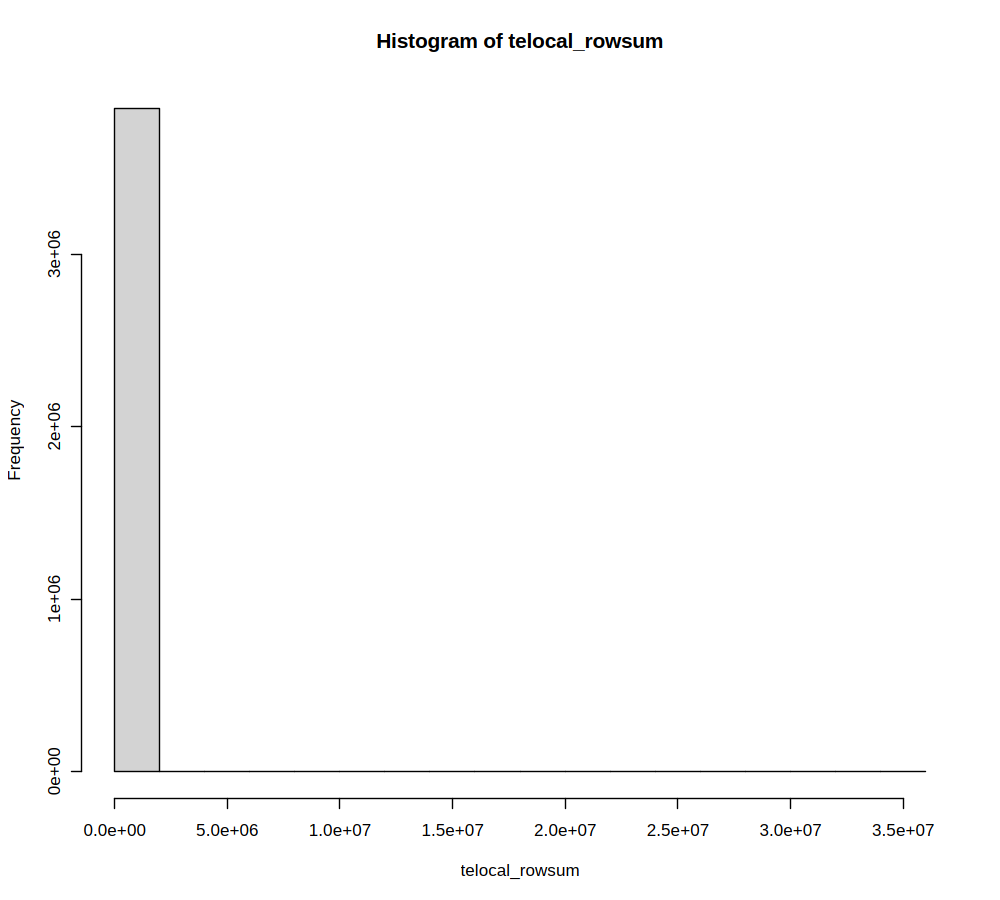

In [860]:
# calculate row sum
telocal_rowsum = rowSums(telocal_dt_w[, 2:ncol(telocal_dt_w)])
summary(telocal_rowsum)
hist(telocal_rowsum)


    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
     0.0      0.2      1.4     16.2      7.7 785068.5 

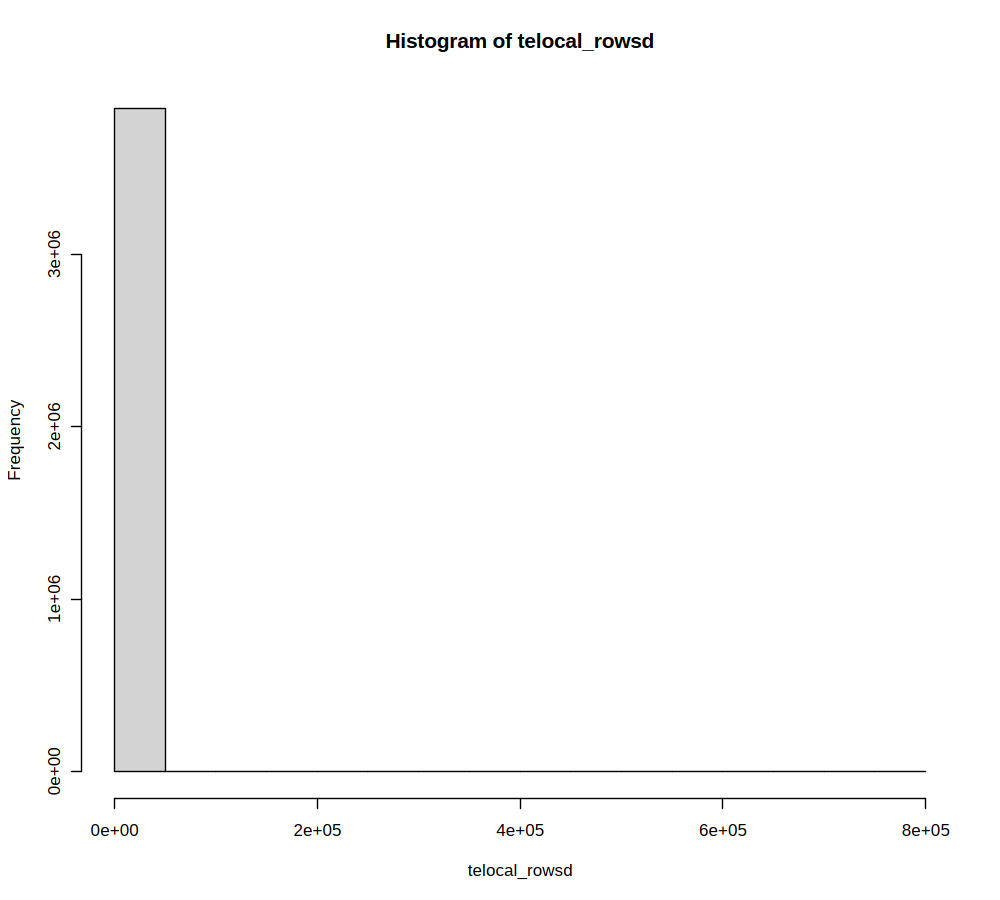

In [861]:
# calculate row variation SD
telocal_rowsd = rowSds(telocal_dt_w[, 2:ncol(telocal_dt_w)])
summary(telocal_rowsd)
hist(telocal_rowsd)


In [866]:
# select the highly changed TEs based on the bluepring results: deg_te_dt_sel
# select the TEs expression > median 
telocal_dt_w_sel = telocal_dt_w[telocal_dt_w_meta$sub_family_id %in% deg_te_dt_sel$gene_id & telocal_rowsd > 16.2 & telocal_rowsum > 365, ] 
telocal_dt_w_sel = telocal_dt_w_sel[!(gene %in% coding_genes), c('gene', sample_names), with = F]
dim(telocal_dt_w_sel) 


[1] 42850    26

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    366     461     623    1088     994  565249 

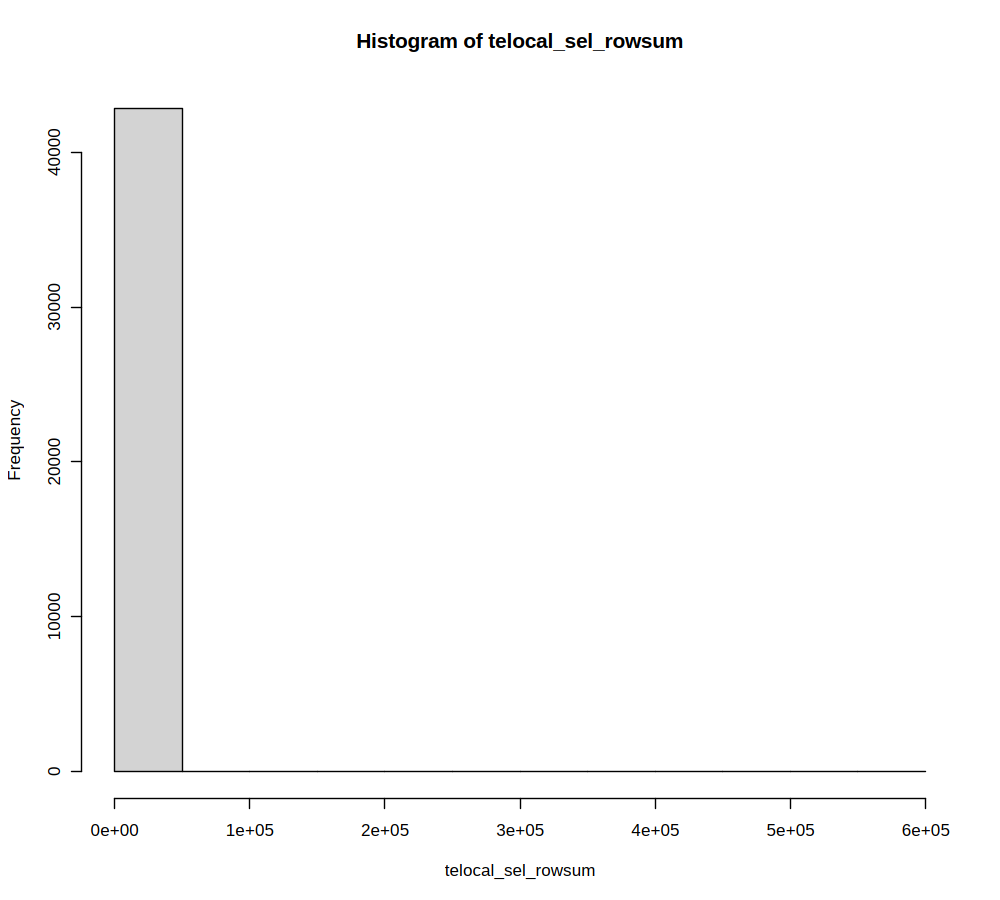

In [867]:
# calculate row sum
telocal_sel_rowsum = rowSums(telocal_dt_w_sel[, 2:ncol(telocal_dt_w_sel)])
summary(telocal_sel_rowsum)
hist(telocal_sel_rowsum)


In [868]:
telocal_dt_w_sel[1:10, 1:10]

gene,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3
<chr>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,36,3,8,24,0,2,0,0,0
(CATTC)n_dup106:(CATTC)n:Satellite:Satellite,56,1,13,34,0,8,0,0,0
(CATTC)n_dup107:(CATTC)n:Satellite:Satellite,29,3,23,35,0,10,0,0,0
(CATTC)n_dup109:(CATTC)n:Satellite:Satellite,188,10,28,46,0,19,0,0,0
(CATTC)n_dup113:(CATTC)n:Satellite:Satellite,46,2,14,130,0,25,0,0,0
(CATTC)n_dup115:(CATTC)n:Satellite:Satellite,31,5,23,57,0,20,0,0,0
(CATTC)n_dup122:(CATTC)n:Satellite:Satellite,71,4,30,52,0,28,0,0,0
(CATTC)n_dup93:(CATTC)n:Satellite:Satellite,57,3,10,47,0,3,0,0,0
(CATTC)n_dup96:(CATTC)n:Satellite:Satellite,60,0,16,21,0,12,0,0,0


In [869]:
dim(telocal_dt_w_sel)


[1] 42850    26

In [878]:
dim(telocal_dt_w)

[1] 3845463      26

In [877]:
saveRDS(telocal_dt_w_sel, file = 'data/telocal_dt_w_sel.rds')
saveRDS(telocal_dt_w, file = 'data/telocal_dt_w.rds')


## telocal DEG

In [870]:
dsn_telocal = data.frame(cell_type = sub('\\d+', '', sample_names_n24), row.names = sample_names_n24)
telocal_dt_w_sel_mtx = setDF(telocal_dt_w_sel[, 2:ncol(telocal_dt_w_sel)], rownames = telocal_dt_w_sel$gene)
telocal_dt_w_sel_mtx = telocal_dt_w_sel_mtx[, rownames(dsn_telocal)]
dim(telocal_dt_w_sel_mtx)
dim(dsn_telocal)


[1] 42850    24

[1] 24  1

In [900]:
dim(telocal_dt_w_sel[gene %in% coding_genes, ])

[1]  0 26

In [875]:
saveRDS(telocal_dt_w_sel_mtx, file = 'data/telocal_dt_w_sel_mtx.rds')


In [874]:
dim(telocal_dt_w_sel_mtx)
head(telocal_dt_w_sel_mtx)


[1] 42850    24

,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3,GMP1,⋯,MEP3,MEP4,CLP1,CLP3,EB1,EB2,EB3,MK1,MK2,MK3
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
(CATTC)n_dup104:(CATTC)n:Satellite:Satellite,36,3,8,24,0,2,0,0,0,152,⋯,0,0,27,10,4,4,5,5,22,64
(CATTC)n_dup106:(CATTC)n:Satellite:Satellite,56,1,13,34,0,8,0,0,0,61,⋯,0,0,79,12,2,6,2,7,9,68
(CATTC)n_dup107:(CATTC)n:Satellite:Satellite,29,3,23,35,0,10,0,0,0,81,⋯,0,0,44,45,5,6,8,4,10,161
(CATTC)n_dup109:(CATTC)n:Satellite:Satellite,188,10,28,46,0,19,0,0,0,210,⋯,0,0,105,26,1,5,5,4,21,95
(CATTC)n_dup113:(CATTC)n:Satellite:Satellite,46,2,14,130,0,25,0,0,0,165,⋯,0,0,46,27,3,16,4,5,36,81
(CATTC)n_dup115:(CATTC)n:Satellite:Satellite,31,5,23,57,0,20,0,0,0,77,⋯,0,0,31,69,7,10,8,6,51,125


In [871]:
# get logcpm
subtype = factor(dsn_telocal$cell_type, levels = c(cell_types))

dge = DGEList(counts=telocal_dt_w_sel_mtx, group = subtype)
dge <- calcNormFactors(dge)

keep = filterByExpr(dge)
dge = dge[keep, , keep.lib.sizes=FALSE]
dge = normLibSizes(dge)
design = model.matrix( ~ 0 + subtype)
dge = estimateDisp(dge, design)

logcpm_telocal = log1p(cpm(dge, normalize = T))
saveRDS(dge, file = 'data/dge_telocal.rds')
saveRDS(logcpm_telocal, file = 'data/logcpm_telocal.rds')


In [879]:
deg_telocal_list = lapply(cell_types, function(cc){
    dsn_telocal$ctype = 'Other'
    dsn_telocal$ctype[dsn_telocal$cell_type == cc] = cc
    dsn_telocal$ctype = factor(dsn_telocal$ctype, levels = c('Other', cc))

    subtype = factor(dsn_telocal$ctype, levels = c('Other', cc))

    dge = DGEList(counts=telocal_dt_w_sel_mtx, group = subtype)
    dge <- calcNormFactors(dge)

    keep = filterByExpr(dge)
    dge = dge[keep, , keep.lib.sizes=FALSE]
    dge = normLibSizes(dge)
    design = model.matrix( ~ 0 + subtype)
    dge = estimateDisp(dge, design)
    et <- exactTest(dge)
    deg = topTags(et, n = length(keep))
    deg = as.data.table(deg$table, keep.rownames = T)
    deg
})



In [880]:
names(deg_telocal_list) = cell_types
deg_telocal_dt = rbindlist(deg_telocal_list, idcol = T)

In [881]:
saveRDS(deg_telocal_dt, file = 'data/deg_telocal_list_may15.rds')
fwrite(deg_telocal_dt, file = 'data/deg_telocal_dt_may15.xls', sep = '\t')


In [891]:
tmp

CLP1     CLP2     CLP3     CMP1     CMP2     CMP3      EB1      EB2      EB3     GMP1     GMP2     GMP3     HSC1     HSC2     HSC3     MEP1     MEP2     MEP3     MEP4      MK1 
62738917 47458840 50445076 72828888 70367504 60301543 47134744 44364558 43366495 64222432 62776036 48885681 64075000 28913455 29999466 57108018 70973762 61398705 63961689 53992948 
     MK2      MK3     MPP1     MPP2     MPP3 
52707767 62206944 60996972 70992529 53129546

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.91   32.05   38.95   43.49   50.12  203.26 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.4041  1.3548  1.5135  1.5243  1.6925  2.8716 

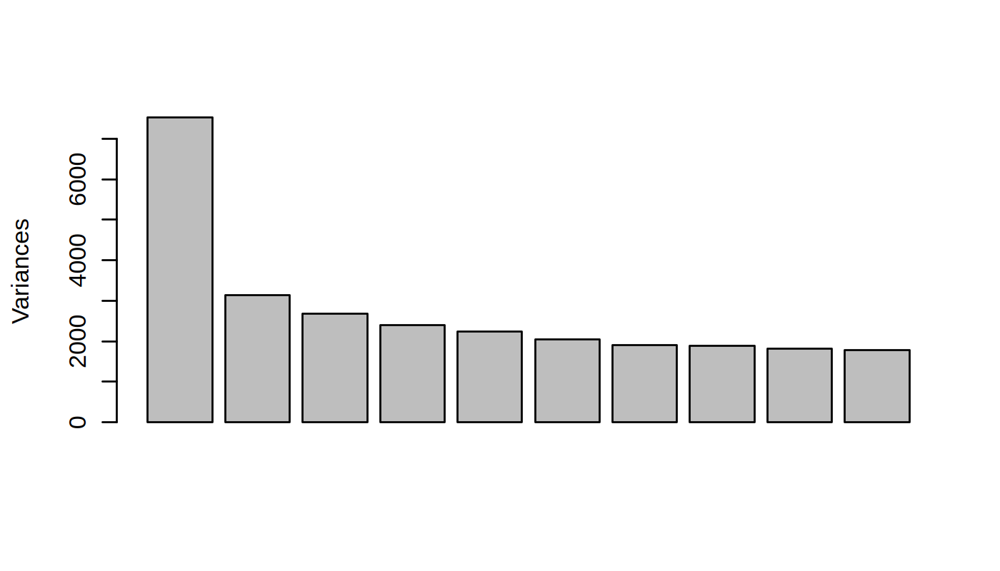

In [895]:
rsum = rowSums(logcpm_telocal)
rsd  = rowSds(logcpm_telocal)
summary(rsum)
summary(rsd)

plotdat = logcpm_telocal[rsum > 41 & rsd > .75, ]
plotdat = scale(plotdat, scale = F, center = T)
plotdat = prcomp(t(plotdat))
options(repr.plot.width = 7, repr.plot.height = 4, repr.plot.res = 200)
plot(plotdat, main = '')


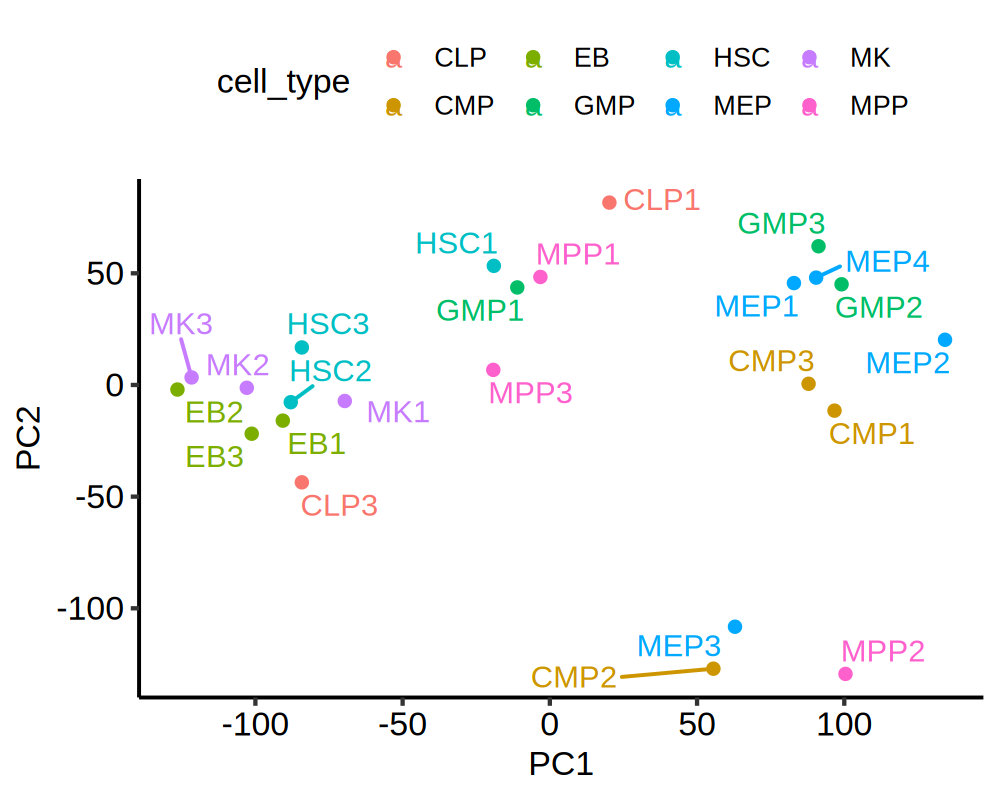

In [896]:
plotdat_x = as.data.table(plotdat$x, keep.rownames = T)
plotdat_x[, cell_type := sub('\\d+', '', rn)]

options(repr.plot.width = 5, repr.plot.height = 4, repr.plot.res = 200)
ggplot(plotdat_x, aes(PC1, PC2, label = rn, color = cell_type)) + geom_point() + theme_pubr() + geom_text_repel()


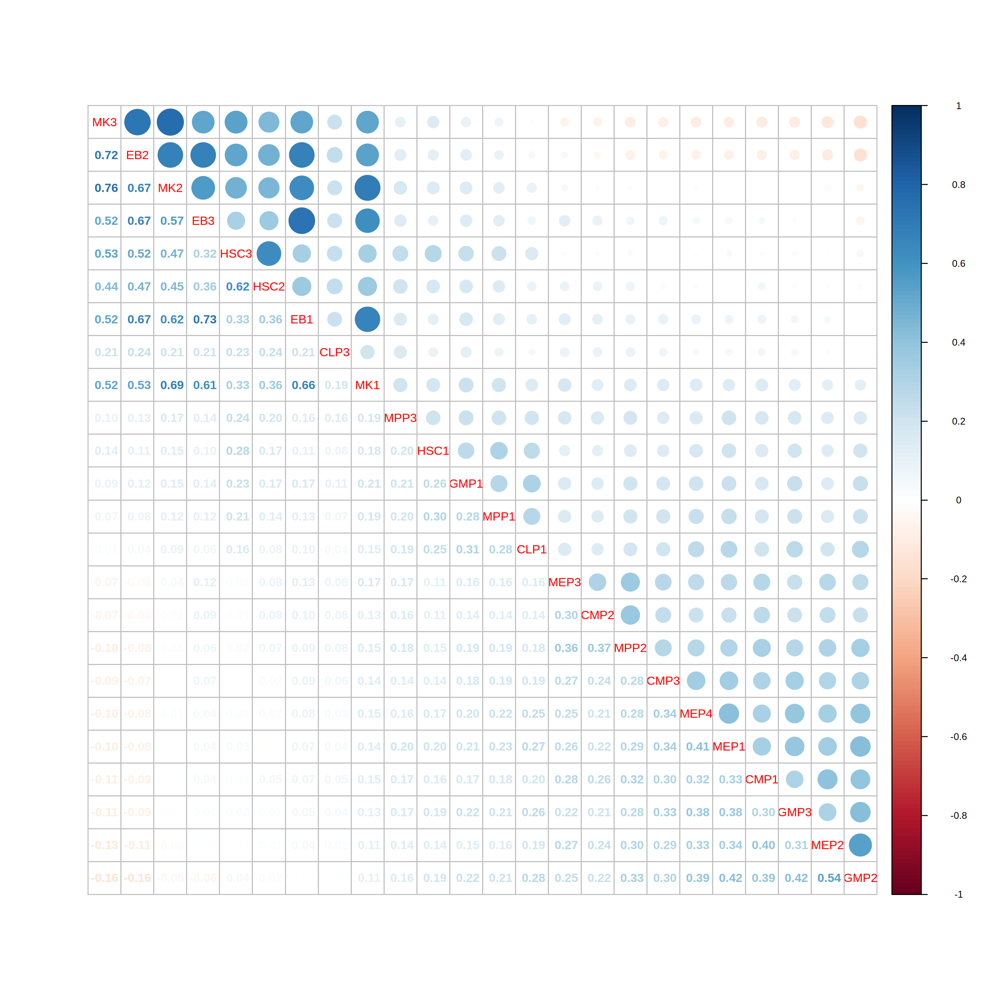

In [898]:

# cluster analysis
options(repr.plot.width = 14, repr.plot.height = 14, repr.plot.res = 200)
plotdat = logcpm_telocal[rsum > 41 & rsd > .75, ]
plotdat = cor(plotdat)
plotdat = round(plotdat, 2)
corrplot.mixed(plotdat, order = 'AOE') 


## telocal heatmap

In [883]:
table(deg_telocal_dt[FDR < .1, .id])


CLP  EB MEP  MK MPP 
  1  21 613  26   1 

In [884]:
telocal_list = list()

In [904]:
head(dsn_telocal)

,cell_type
,<chr>
HSC1,HSC
HSC2,HSC
HSC3,HSC
MPP1,MPP
MPP2,MPP
MPP3,MPP


`use_raster` is automatically set to TRUE for a matrix with more than 2000 rows. You can control `use_raster` argument by explicitly setting TRUE/FALSE to it.

Set `ht_opt$message = FALSE` to turn off this message.

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.



png 
  2

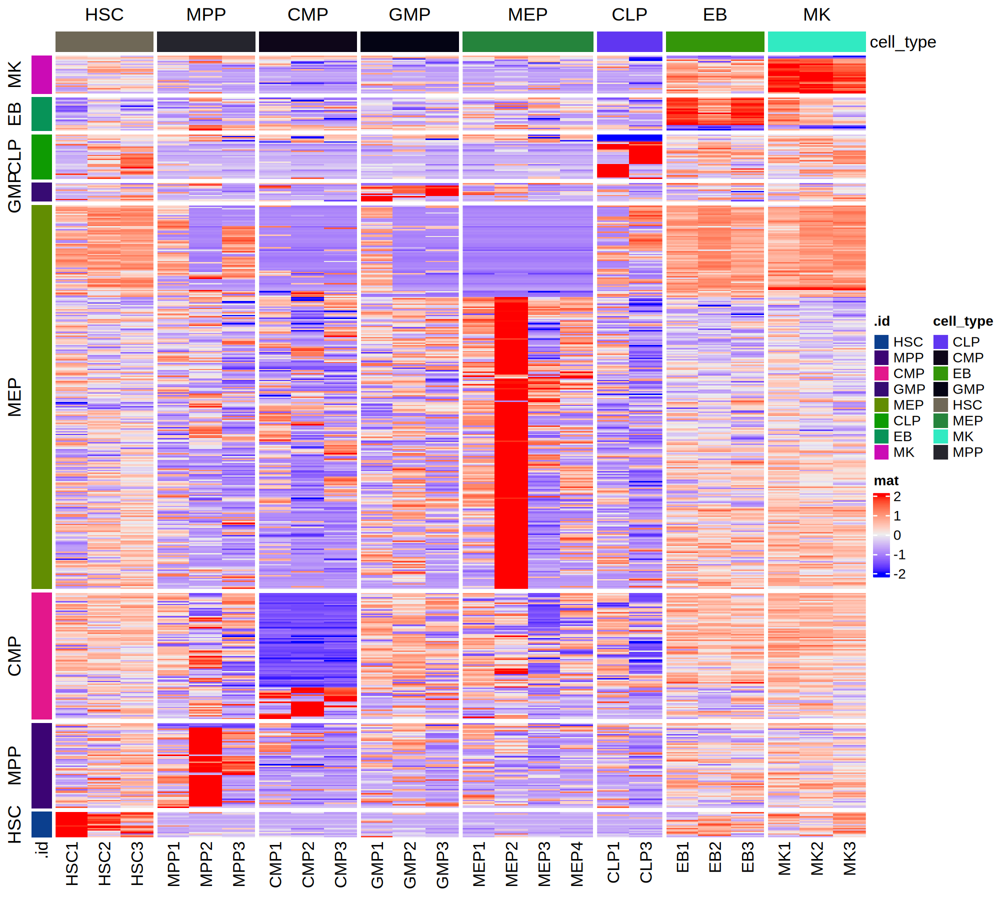

In [905]:
# all sig ones with FDr < 0.1
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 200)

row_sel = deg_telocal_dt[ PValue < 0.01 & abs(logFC) > 1, ] 
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

telocal_list = c(telocal_list, list(sig = row_sel))

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
hp = Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = row_sel$.id, row_names_gp = grid::gpar(size = 6), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  
hp
pdf('heatmap.pdf', width = 10, height = 13)
hp
dev.off()

In [911]:
head(row_sel)

.id,rn,logFC,logCPM,PValue,FDR,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HSC,L1PA4_dup1026:L1PA4:L1:LINE,5.936436,3.164052,6.412631e-06,0.2728831,HSC_L1PA4_dup1026:L1PA4:L1:LINE
HSC,L1MA5_dup1975:L1MA5:L1:LINE,6.554444,2.938303,3.966342e-05,0.8439185,HSC_L1MA5_dup1975:L1MA5:L1:LINE
HSC,L1PA10_dup1389:L1PA10:L1:LINE,6.677560,2.658130,7.357540e-05,0.8610581,HSC_L1PA10_dup1389:L1PA10:L1:LINE
HSC,L1PA2_dup3592:L1PA2:L1:LINE,4.570589,2.999451,8.093793e-05,0.8610581,HSC_L1PA2_dup3592:L1PA2:L1:LINE
HSC,L1PA4_dup3068:L1PA4:L1:LINE,3.910597,3.125766,1.015730e-04,0.8644678,HSC_L1PA4_dup3068:L1PA4:L1:LINE
HSC,L1PA5_dup8894:L1PA5:L1:LINE,6.045896,2.690809,1.421106e-04,0.9066953,HSC_L1PA5_dup8894:L1PA5:L1:LINE


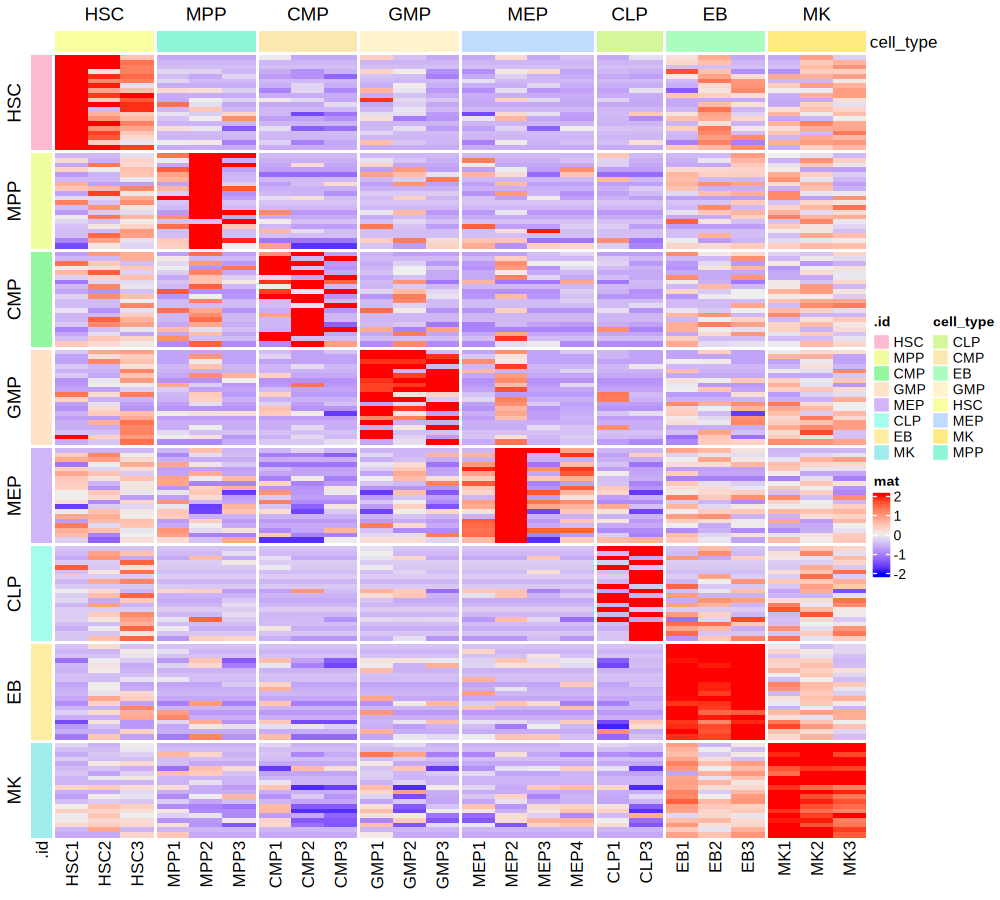

In [922]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_telocal_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_up20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

telocal_list = c(telocal_list, list(up20 = row_sel))

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = factor(row_sel$.id, levels = cell_types), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


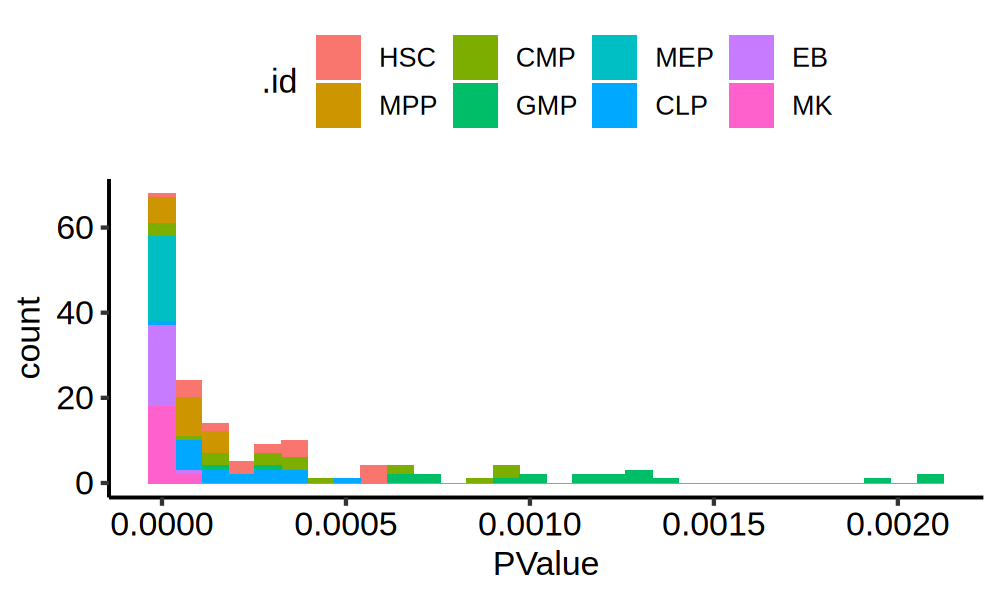

In [888]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


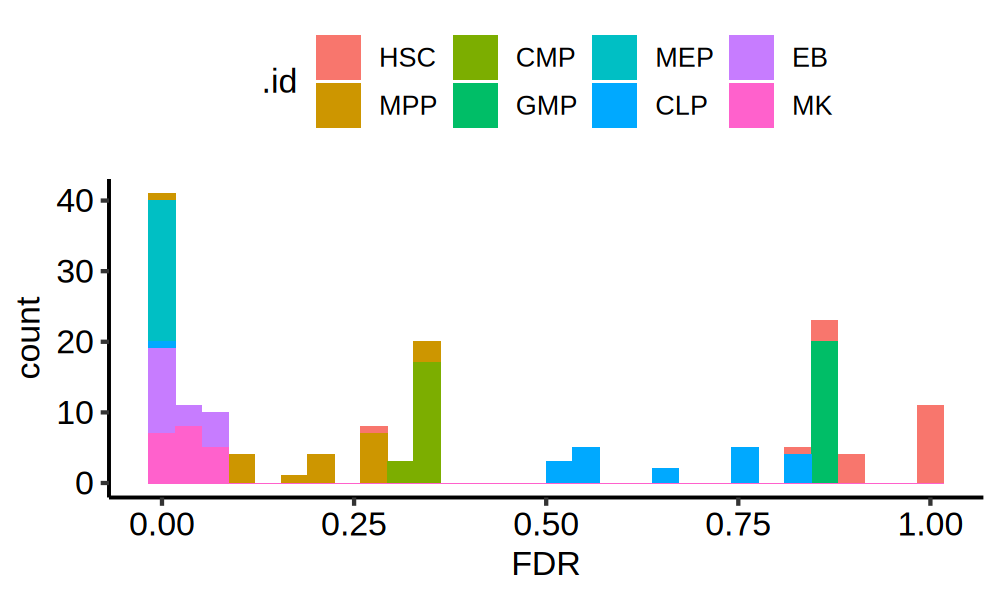

In [887]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


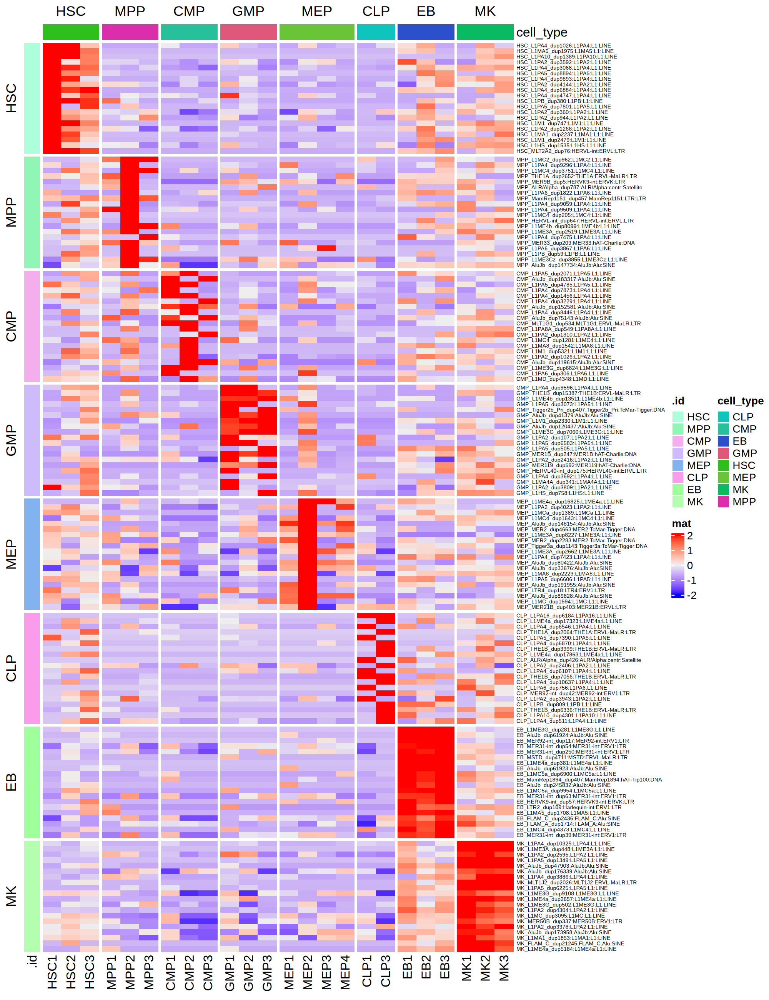

In [889]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_telocal_dt[logFC > 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = T,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [724]:
plotdat[1:3, 1:10]

,HSC1,HSC2,HSC3,MPP1,MPP2,MPP3,CMP1,CMP2,CMP3,GMP1
HSC_HERV15-int_dup33:HERV15-int:ERV1:LTR,-1.216618,-1.285242,-1.1534324,-0.2554381,0.1265225,-1.6238314,0.8332750,0.85097397,0.9198785,0.2000048
HSC_L1MD_dup1005:L1MD:L1:LINE,-1.260610,-1.156266,-1.2079864,-1.0375605,0.5899172,-0.9161918,-1.1750184,0.04120087,0.2262641,-1.0758196
HSC_AluJr_dup1452:AluJr:Alu:SINE,-2.000000,-0.834153,-0.9389894,-0.1175482,0.5844460,-0.4856305,0.6675626,-0.24131293,0.5566047,-0.3777248


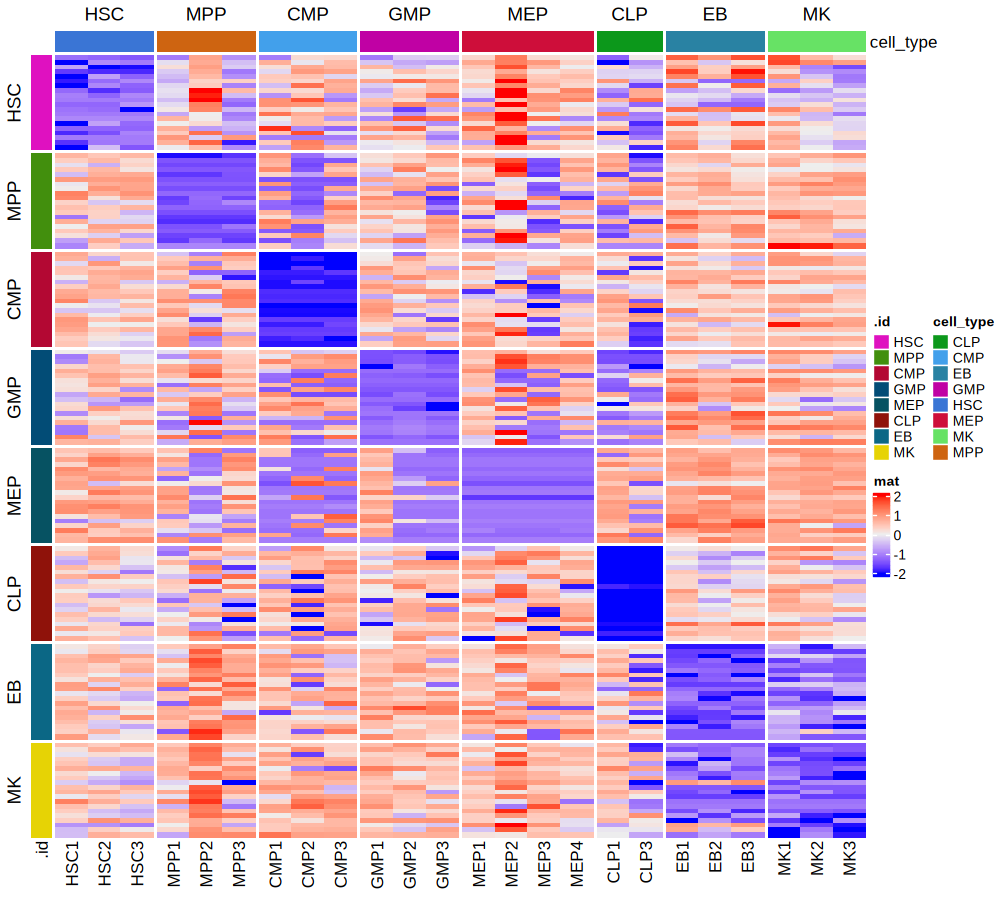

In [916]:
# top 20 dn-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 9, repr.plot.res = 100)

row_sel = deg_telocal_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
fwrite(row_sel, file = 'data/telocal_down20.xls', sep = '\t') 
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

telocal_list = c(telocal_list, list(dn20 = row_sel))

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_telocal[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = F, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


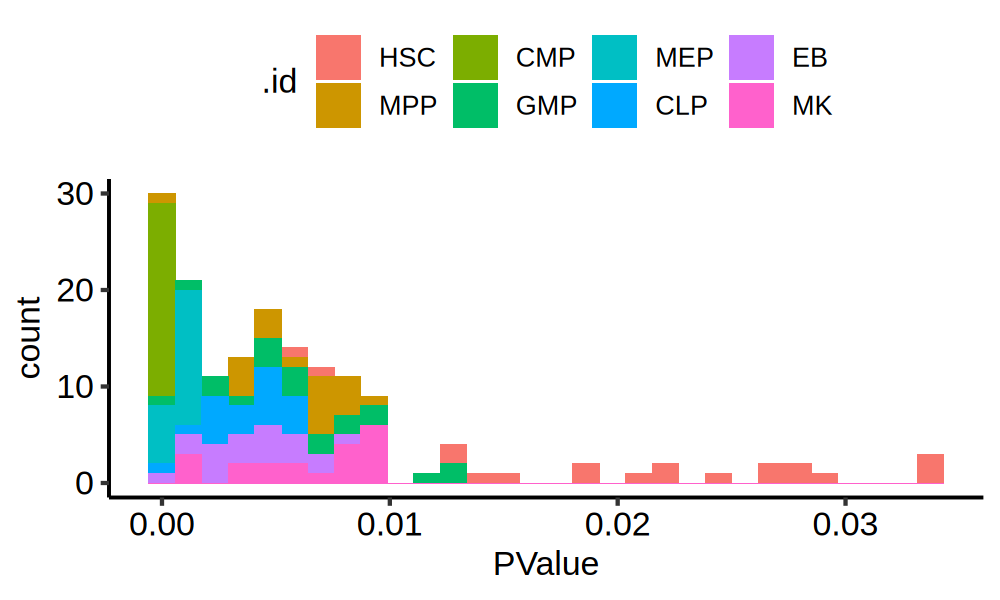

In [917]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = PValue, fill = .id)) + geom_histogram() + theme_pubr()


`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


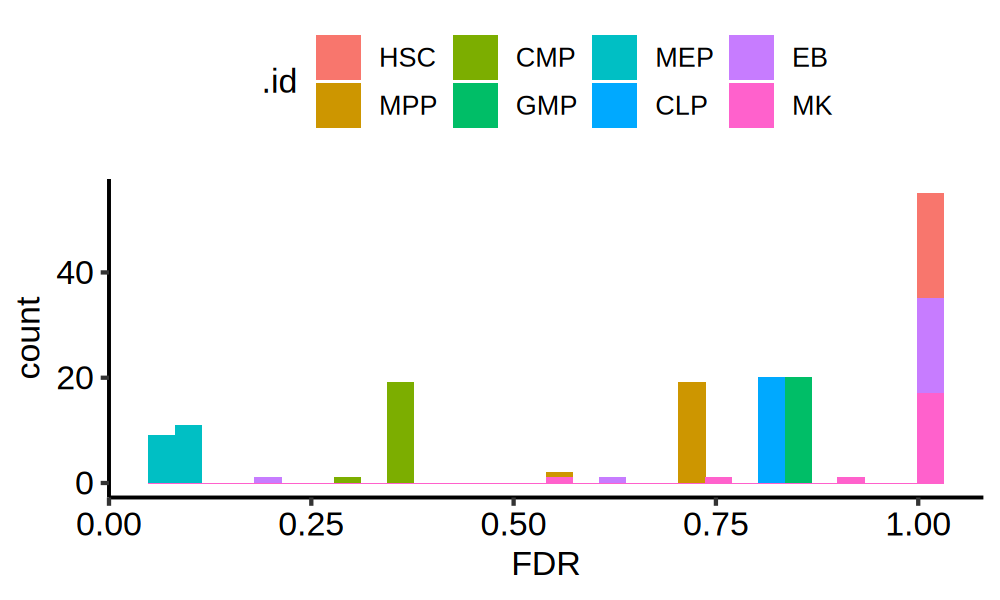

In [918]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
ggplot(row_sel, aes(x = FDR, fill = .id)) + geom_histogram() + theme_pubr()


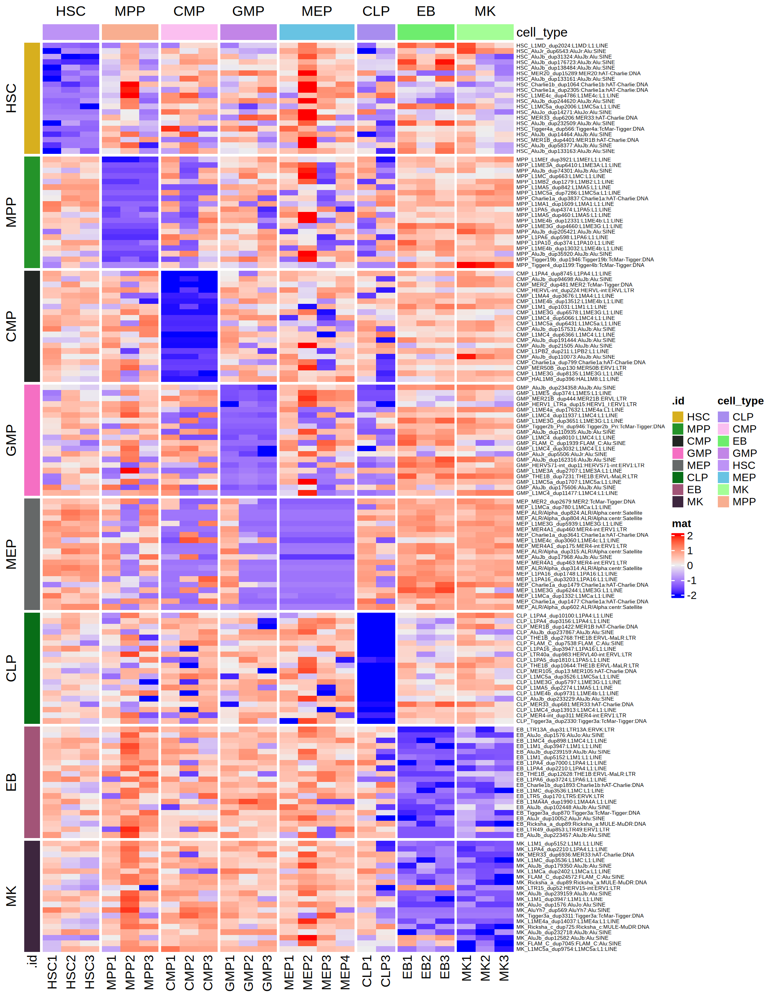

In [933]:
# top 20 up-regulated coding genes for each cell type
options(repr.plot.width = 10, repr.plot.height = 13, repr.plot.res = 200)

row_sel = deg_telocal_dt[logFC < 0, ] %>% group_by(.id) %>% slice_min(order_by = PValue, n = 20)
row_sel = as.data.table(row_sel)
row_sel[, ctype_gene := paste0(.id, '_', rn)]
row_sel[, .id := factor(.id, levels = cell_types)]
row_sel = row_sel[order(.id), ]
ov = intersect(row_sel$rn, rownames(logcpm_telocal))
row_sel = row_sel[rn %in% ov, ]

plotdat = logcpm_telocal[row_sel$rn, rownames(dsn_telocal)]
rownames(plotdat) = row_sel$ctype_gene

plotdat = scale_fun(plotdat) 
plotdat[plotdat > 2] = 2
plotdat[plotdat < -2] = -2

column_ha = HeatmapAnnotation(df = dsn_all_df[, 'cell_type', drop = F])
column_ra = rowAnnotation(df = row_sel[, .(.id)]) 
Heatmap(plotdat, name = "mat", show_column_names = T, show_row_names = T, show_column_dend = F, cluster_columns  = F, 
        cluster_rows = F,  row_split = row_sel$.id, row_names_gp = grid::gpar(fontsize = 5), 
        show_row_dend = F, top_annotation = column_ha, left_annotation = column_ra, 
        column_split = factor(dsn_all_df$cell_type, levels = cell_types))  


In [938]:
row_sel[1:5, ]

.id,rn,logFC,logCPM,PValue,FDR,ctype_gene
<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
HSC,L1MD_dup2024:L1MD:L1:LINE,-5.351829,10.686590,0.006267821,1,HSC_L1MD_dup2024:L1MD:L1:LINE
HSC,AluJr_dup6543:AluJr:Alu:SINE,-6.687467,9.314801,0.007097942,1,HSC_AluJr_dup6543:AluJr:Alu:SINE
HSC,AluJb_dup31324:AluJb:Alu:SINE,-3.793383,9.220092,0.012262250,1,HSC_AluJb_dup31324:AluJb:Alu:SINE
HSC,AluJb_dup176723:AluJb:Alu:SINE,-3.729088,7.535264,0.012912024,1,HSC_AluJb_dup176723:AluJb:Alu:SINE
HSC,AluJb_dup138484:AluJb:Alu:SINE,-3.995137,9.181538,0.014095934,1,HSC_AluJb_dup138484:AluJb:Alu:SINE


In [950]:
telocal_sel = rbindlist(telocal_list, idcol = T)
setnames(telocal_sel, 1, 'sig_type')
setnames(telocal_sel, 2, 'cell_type')
telocal_sel[, cell_type_agg := paste(.SD$cell_type, collapse = ' '), by = 'rn']
telocal_sel = telocal_sel[!duplicated(rn), ]
head(telocal_sel)
#telocal_sel = merge(telocal_sel, te_dt, by.x = 'rn', by.y = 'idd', all.x = T)
#fwrite(telocal_sel, file = 'data/telocal_selected.tsv')


sig_type,cell_type,rn,logFC,logCPM,PValue,FDR,ctype_gene,cell_type_agg
<chr>,<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
sig,MPP,L1MC2_dup962:L1MC2:L1:LINE,7.900020,4.429032,3.774423e-07,0.016061678,MPP_L1MC2_dup962:L1MC2:L1:LINE,MPP MPP MPP MPP MPP MPP MPP MPP MPP MPP MPP MPP MPP MPP
sig,MEP,L1ME4a_dup16825:L1ME4a:L1:LINE,7.861616,5.392640,1.339613e-07,0.005659330,MEP_L1ME4a_dup16825:L1ME4a:L1:LINE,MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP
sig,MEP,L1PA2_dup4023:L1PA2:L1:LINE,4.617730,5.310166,4.218421e-07,0.007151983,MEP_L1PA2_dup4023:L1PA2:L1:LINE,MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP
sig,MEP,L1MCa_dup1389:L1MCa:L1:LINE,7.047260,5.983230,6.448921e-07,0.007151983,MEP_L1MCa_dup1389:L1MCa:L1:LINE,MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP
sig,MEP,L1MC4_dup1643:L1MC4:L1:LINE,5.465708,5.942621,8.258426e-07,0.007151983,MEP_L1MC4_dup1643:L1MC4:L1:LINE,MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP
sig,MEP,AluJb_dup148154:AluJb:Alu:SINE,6.125822,3.938554,8.464687e-07,0.007151983,MEP_AluJb_dup148154:AluJb:Alu:SINE,MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP MEP


In [951]:
head(te_dt)


chr,rmsk,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd
<chr>,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,UCSC_rmsk,exon,2710,4402,5119,-,.,TAR1,TAR1_dup164,subtelo,Satellite,TAR1_dup164:TAR1:subtelo:Satellite
chr1,UCSC_rmsk,exon,4083,4533,962,-,.,LTR60B,LTR60B_dup190,ERV1,LTR,LTR60B_dup190:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4534,4660,505,-,.,LTR60B,LTR60B_dup191,ERV1,LTR,LTR60B_dup191:LTR60B:ERV1:LTR
chr1,UCSC_rmsk,exon,4664,5263,1304,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE
chr1,UCSC_rmsk,exon,5275,5528,1403,+,.,MER34C_v,MER34C_v_dup375,ERV1,LTR,MER34C_v_dup375:MER34C_v:ERV1:LTR
chr1,UCSC_rmsk,exon,5529,5686,3544,+,.,L1MC3,L1MC3_dup5932,L1,LINE,L1MC3_dup5932:L1MC3:L1:LINE


In [944]:
head(telocal_sel)
dim(telocal_sel)


sig_type,cell_type,rn,logFC,logCPM,PValue,FDR,ctype_gene,cell_type_agg
<chr>,<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
sig,MPP,L1PA4_dup5118:L1PA4:L1:LINE,6.692403,4.420084,1.933025e-08,1.031752e-03,MPP_L1PA4_dup5118:L1PA4:L1:LINE,MPP MPP
sig,CMP,L1PA4_dup5560:L1PA4:L1:LINE,6.081185,3.666404,1.987178e-06,8.822843e-02,CMP_L1PA4_dup5560:L1PA4:L1:LINE,CMP CMP
sig,CMP,L1ME3C_dup2379:L1ME3C:L1:LINE,-9.688420,7.010773,3.305983e-06,8.822843e-02,CMP_L1ME3C_dup2379:L1ME3C:L1:LINE,CMP CMP
sig,MEP,L1ME4a_dup18726:L1ME4a:L1:LINE,8.333388,4.451539,6.617833e-07,3.499245e-02,MEP_L1ME4a_dup18726:L1ME4a:L1:LINE,MEP MEP
sig,EB,MER31-int_dup383:MER31-int:ERV1:LTR,12.868093,7.513748,2.124311e-25,1.133851e-20,EB_MER31-int_dup383:MER31-int:ERV1:LTR,EB EB
sig,EB,L1ME3G_dup21477:L1ME3G:L1:LINE,11.934552,6.906337,7.708321e-20,2.057158e-15,EB_L1ME3G_dup21477:L1ME3G:L1:LINE,EB EB


[1] 326   9

In [952]:
telocal_sel_seqino = merge(telocal_sel, te_dt, by.x = 'rn', by.y = 'idd', all.x = T)
fwrite(telocal_sel_seqino, file = 'data/telocal_sel.xls', sep = '\t')


In [12]:
telocal_sel_seqino = fread('data/telocal_sel.xls')
telocal_sel_seqino[, ctype_gene := paste0(.id, '_', rn)] 
head(telocal_sel_seqino)


rn,.id,logFC,logCPM,PValue,FDR,updn,tag,chr,rmsk,⋯,end,width,strand,score,gene_id,transcript_id,family_id,class_id,idd_2,ctype_gene
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,⋯,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32920060,1044,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32919806_32920060__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite
ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP,-10.394113,6.156018,1.119425e-03,0.09111988,dn,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32952929,1308,-,.,ALR/Alpha,ALR/Alpha_dup314,centr,Satellite,chr16_32920075_32952929__ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite
ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP,-10.519311,6.279623,8.760105e-04,0.08353937,dn,MEP_ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,chr16,UCSC_rmsk,⋯,32975480,1325,+,.,ALR/Alpha,ALR/Alpha_dup315,centr,Satellite,chr16_32952964_32975480__ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,MEP_ALR/Alpha_dup315:ALR/Alpha:centr:Satellite
ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP,7.377682,3.151155,1.170015e-04,0.55519789,up,CLP_ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,chr15,UCSC_rmsk,⋯,15883791,1177,+,.,ALR/Alpha,ALR/Alpha_dup426,centr,Satellite,chr15_15876497_15883791__ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,CLP_ALR/Alpha_dup426:ALR/Alpha:centr:Satellite
ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP,-10.245376,6.009376,1.407620e-03,0.09796758,dn,MEP_ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,chr12,UCSC_rmsk,⋯,34452774,1272,-,.,ALR/Alpha,ALR/Alpha_dup602,centr,Satellite,chr12_34408244_34452774__ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,MEP_ALR/Alpha_dup602:ALR/Alpha:centr:Satellite
ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP,6.753373,4.349032,2.443891e-05,0.17332893,up,MPP_ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,chr9,UCSC_rmsk,⋯,42415274,1195,-,.,ALR/Alpha,ALR/Alpha_dup787,centr,Satellite,chr9_42411679_42415274__ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,MPP_ALR/Alpha_dup787:ALR/Alpha:centr:Satellite


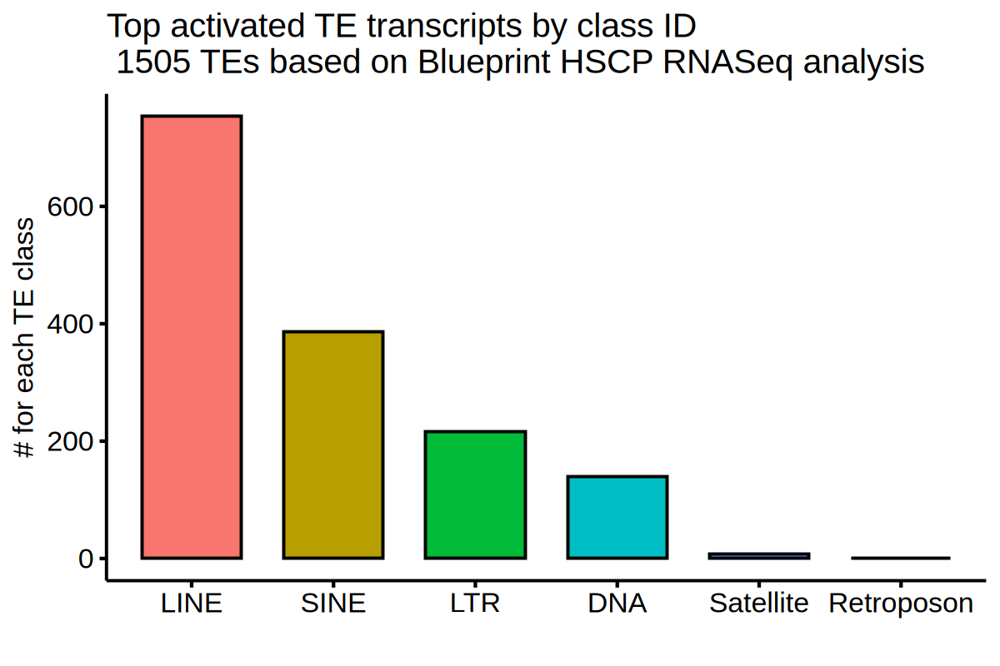

In [31]:
telocal_sel_seqino[, nn := nrow(.SD), by = 'class_id']
plotdat = telocal_sel_seqino[!duplicated(class_id), ]
plotdat = plotdat[order(nn, decreasing = T), ]

options(repr.plot.width = 6, repr.plot.height = 4, repr.plot.res = 200)
ggbarplot(plotdat, x = 'class_id', y = 'nn', fill = 'class_id') + xlab('') + ylab('# for each TE class') + 
ggtitle('Top activated TE transcripts by class ID\n 1505 TEs based on Blueprint HSCP RNASeq analysis') + rremove('legend')


In [13]:
tmp = data.frame(seqname = telocal_sel_seqino$chr, start = telocal_sel_seqino$start, end = telocal_sel_seqino$end, name = telocal_sel_seqino$ctype_gene)
gr = GRanges(tmp)
gr_anno = annotatePeak(gr, TxDb=txdb, tssRegion=c(-3000, 3000), verbose=FALSE, annoDb = 'org.Hs.eg.db', addFlankGeneInfo = T)
telocal_anno_dt = as.data.table(gr_anno@anno, keep.rownames = T)
head(telocal_anno_dt)


'select()' returned 1:many mapping between keys and columns

Warning message in .local(x, row.names, optional, ...):
"Arguments in '...' ignored"


rn,seqnames,start,end,width,strand,name,annotation,geneChr,geneStart,⋯,geneStrand,geneId,transcriptId,distanceToTSS,ENSEMBL,SYMBOL,GENENAME,flank_txIds,flank_geneIds,flank_gene_distances
<chr>,<fct>,<int>,<int>,<int>,<fct>,<chr>,<chr>,<int>,<int>,⋯,<int>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,chr16,32919806,32920060,255,*,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,"Exon (ENST00000621154.1/ENST00000621154.1, exon 4 of 15)",16,32878706,⋯,2,386757,ENST00000431994.5,-34305,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
2,chr16,32920075,32952929,32855,*,MEP_ALR/Alpha_dup314:ALR/Alpha:centr:Satellite,"Exon (ENST00000621154.1/ENST00000621154.1, exon 5 of 15)",16,32878706,⋯,2,386757,ENST00000431994.5,-34574,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
3,chr16,32952964,32975480,22517,*,MEP_ALR/Alpha_dup315:ALR/Alpha:centr:Satellite,"Exon (ENST00000567619.1/ENST00000567619.1, exon 2 of 3)",16,32878706,⋯,2,386757,ENST00000431994.5,-67463,ENSG00000290985,SLC6A10P,"solute carrier family 6 member 10, pseudogene",NA,NA,NA
4,chr15,15876497,15883791,7295,*,CLP_ALR/Alpha_dup426:ALR/Alpha:centr:Satellite,Distal Intergenic,15,20012741,⋯,1,105379202,ENST00000611556.1,-4128950,NA,FAM30B,family with sequence similarity 30 member B,NA,NA,NA
5,chr12,34408244,34452774,44531,*,MEP_ALR/Alpha_dup602:ALR/Alpha:centr:Satellite,Distal Intergenic,12,34191037,⋯,2,124903068,ENST00000660987.1,-188998,NA,LOC124903068,uncharacterized LOC124903068,NA,NA,NA
6,chr9,42411679,42415274,3596,*,MPP_ALR/Alpha_dup787:ALR/Alpha:centr:Satellite,"Exon (ENST00000454088.2/ENST00000454088.2, exon 1 of 1)",9,42566993,⋯,2,103908605,ENST00000428895.1,154036,NA,FAM88E,family with sequence similarity 88 member E,NA,NA,NA


In [983]:
telocal_sel_seqino[ctype_gene == 'MEP_ALR/Alpha_dup1166:ALR/Alpha:centr:Satellite', ]

rn,sig_type,cell_type,logFC,logCPM,PValue,FDR,ctype_gene,cell_type_agg,chr,⋯,exon,start,end,width,strand,score,gene_id,transcript_id,family_id,class_id
<chr>,<chr>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,⋯,<chr>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
ALR/Alpha_dup1166:ALR/Alpha:centr:Satellite,sig,MEP,-9.326049,5.108598,0.008103747,0.2092134,MEP_ALR/Alpha_dup1166:ALR/Alpha:centr:Satellite,MEP MEP MEP MEP,chrY,⋯,exon,18578339,18579537,1041,-,.,ALR/Alpha,ALR/Alpha_dup1166,centr,Satellite
ALR/Alpha_dup1166:ALR/Alpha:centr:Satellite,sig,MEP,-9.326049,5.108598,0.008103747,0.2092134,MEP_ALR/Alpha_dup1166:ALR/Alpha:centr:Satellite,MEP MEP MEP MEP,chrY,⋯,exon,18579847,18591064,1147,-,.,ALR/Alpha,ALR/Alpha_dup1166,centr,Satellite


In [14]:
telocal_sel_seqino_ann = merge(telocal_sel_seqino[!duplicated(ctype_gene), ], telocal_anno_dt, by.x = 'ctype_gene', by.y = 'name', all.x = T)

In [24]:
telocal_sel_seqino_ann[, cell_type := .id]

In [958]:
gr_anno

Annotated peaks generated by ChIPseeker
7371/7371  peaks were annotated
Genomic Annotation Summary:
              Feature   Frequency
9    Promoter (<=1kb)  7.90937458
10   Promoter (1-2kb)  4.96540497
11   Promoter (2-3kb)  4.05643739
4              5' UTR  0.33916701
3              3' UTR  2.36060236
1            1st Exon  0.96323430
7          Other Exon  2.87613621
2          1st Intron 14.44851445
8        Other Intron 29.16836250
6  Downstream (<=300)  0.05426672
5   Distal Intergenic 32.85849953

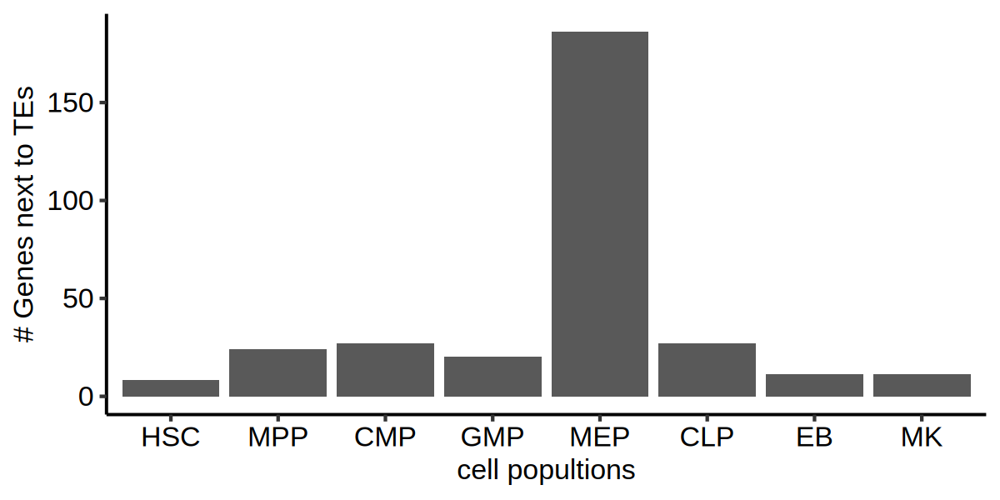

In [27]:
tmp = as.data.frame.matrix(table(telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3000, SYMBOL],  telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3000, cell_type]) )
tmp2 = as.data.table(apply(tmp, 2, sum), keep.rownames = T)
setnames(tmp2, c('cell_type', 'ene_num'))
tmp2[, cell_type := factor(cell_type, levels = c(cell_types))] 
options(repr.plot.width = 6, repr.plot.height = 3, repr.plot.res = 200)
ggplot(tmp2, aes(cell_type, ene_num)) + geom_bar(stat = 'identity') + theme_pubr() + xlab('cell popultions') + ylab('# Genes next to TEs')


In [1026]:
gs = telocal_sel_seqino_ann[!is.na(SYMBOL) & abs(distanceToTSS) < 3000 & cell_type == 'CMP', SYMBOL]
yy = enrichGO(gs, OrgDb = org.Hs.eg.db, keyType = 'SYMBOL', ont="BP", pvalueCutoff=0.01)


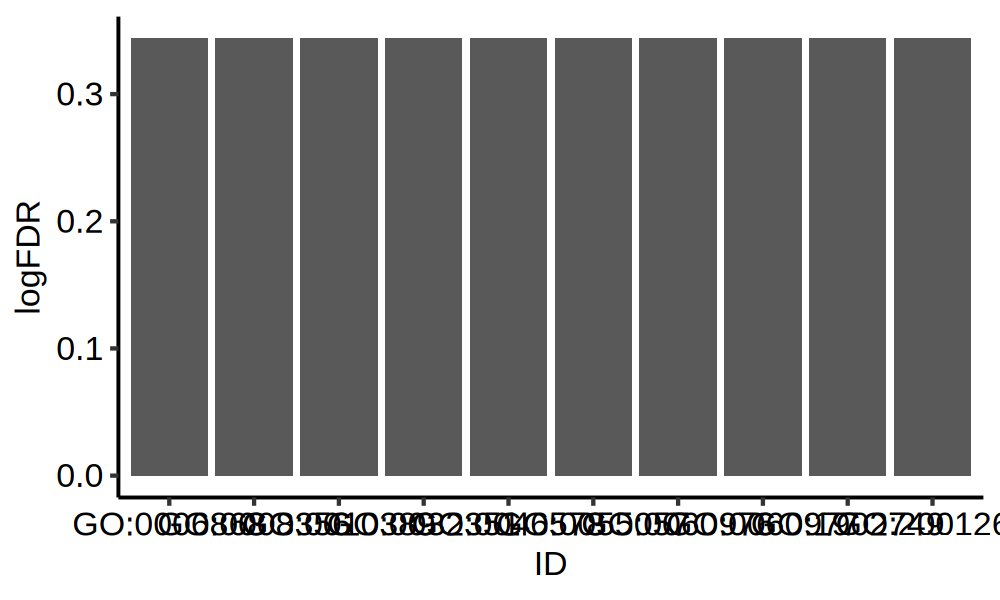

In [1052]:
yy_res = as.data.table(yy@result)
yy_res[, logFDR := -log(p.adjust, 10)] 
ggplot(yy_res[1:10, ], aes(ID, logFDR)) + geom_bar(stat = 'identity') + theme_pubr()

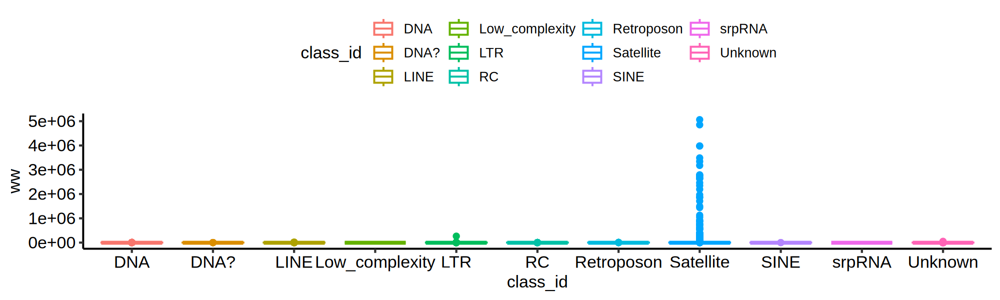

In [1064]:
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 200)
te_dt[, ww := end - start]
ggplot(te_dt, aes(class_id, ww, color = class_id)) + geom_boxplot() + theme_pubr()


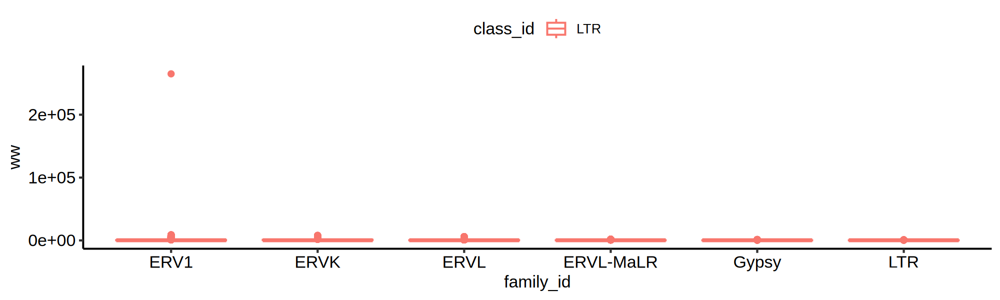

In [1067]:
options(repr.plot.width = 10, repr.plot.height = 3, repr.plot.res = 200)
ggplot(te_dt[class_id == 'LTR'], aes(family_id, ww, color = class_id)) + geom_boxplot() + theme_pubr()


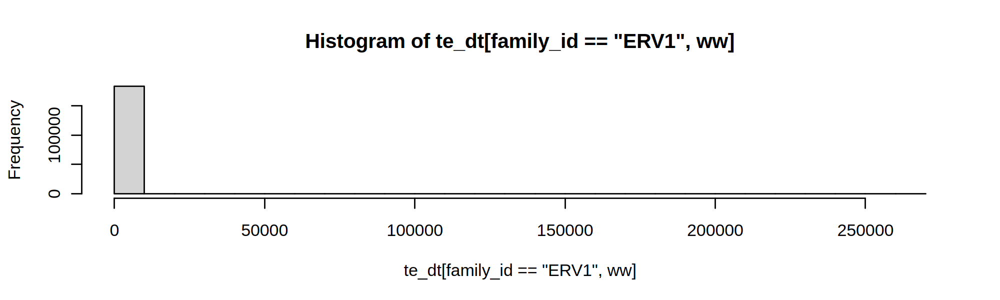

In [1075]:
hist(te_dt[family_id == 'ERV1', ww])

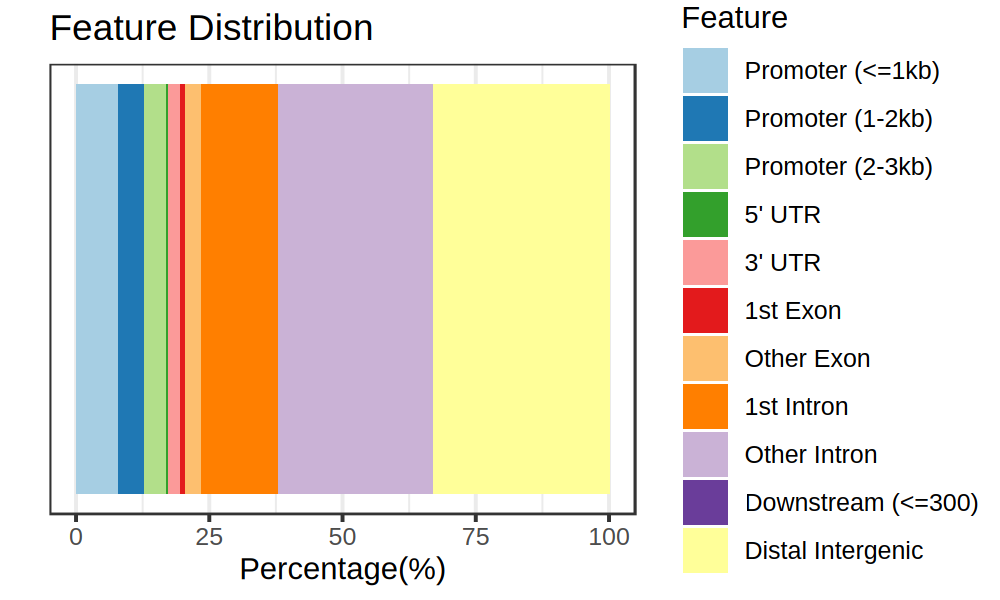

In [966]:
options(repr.plot.width = 5, repr.plot.height = 3, repr.plot.res = 200)
plotAnnoBar(gr_anno)

In [33]:
fwrite(telocal_sel_seqino_ann, 'data/telocal_sel_seqino_ann.tsv')
fwrite(telocal_sel_seqino, 'data/telocal_sel_seqino.tsv')


In [ ]:
te_sel = c('HERV9', 'LTR12')
te_sel_list = lapply(te_sel, function(ii){te_dt[grep(ii, gene_id), ]})
te_sel_dt = rbindlist(te_sel_list)
te_sel_dt = te_sel_dt[!duplicated(gene_id), ]
te_sel_dt


In [925]:
library(OmicCircos)

In [ ]:
data ("UCSC.mm10.chr" , package="OmicCircos") ;
UCSC.mm10.chr

In [932]:
chrom_size_file = '/research_jude/rgs01_jude/groups/jxugrp/home/common/Lab_Members/WenhuoHu/genomes/t2t/t2t_sizes_genome'
chrom_size = fread(chrom_size_file)
chrom_size = chrom_size[chrom != 'chrM', ]
setnames(chrom_size, c('chrom', 'chrom_len'))
chrom_size[, start := cumsum(c(1, chrom_size$chrom_len[1:(nrow(chrom_size) - 1)]))] 
chrom_size[, end := cumsum( chrom_len )]
chrom_size


Warning message in eval(jsub, SDenv, parent.frame()):
"integer overflow in 'cumsum'; use 'cumsum(as.numeric(.))'"


chrom,chrom_len,start,end
<chr>,<int>,<dbl>,<int>
chr1,248387328,1,248387328
chr2,242696752,248387329,491084080
chr3,201105948,491084081,692190028
chr4,193574945,692190029,885764973
chr5,182045439,885764974,1067810412
chr6,172126628,1067810413,1239937040
chr7,160567428,1239937041,1400504468
chrX,154259566,1400504469,1554764034
chr9,150617247,1554764035,1705381281


In [ ]:
mm = rep(-1, length(cell_types))
deg_list = lapply(1:length(mm), function(ii){
    mm_ii = mm
    mm_ii[ii] = 1
    deg = glmQLFTest(fit, contrast = mm_ii) 
    deg = topTags(deg, n = nrow(fit$counts))
    as.data.table(deg$table, keep.rownames = T)

})


In [ ]:
names(deg_list) = cell_types
deg_dt = rbindlist(deg_list, idcol = T)
head(deg_dt)


In [304]:
deg = as.data.table(deg$table, keep.rownames = T)


In [281]:
cell_type_deg_list = lapply(cell_types, function(cc) {
    dsn_all_df$ctype = 'Other'
    dsn_all_df$ctype[dsn_all_df$cell_type == cc] = cc
    dsn_all_df$ctype = factor(dsn_all_df$ctype, levels = c('Other', cc))

    subtype = factor(dsn_all_df$ctype)
    subtype = relevel(subtype, ref = 'Other')

    dge = DGEList(counts=mtx_all_df, group = subtype)
    dge <- calcNormFactors(dge)

    keep = filterByExpr(dge)
    dge = dge[keep, , keep.lib.sizes=FALSE]
    dge = normLibSizes(dge)
    design = model.matrix( ~ 0 + subtype)
    dge = estimateDisp(dge, design)
    et <- exactTest(dge)
    deg = topTags(et, n = length(keep))
    as.data.table(deg$table, keep.rownames = T)
})


In [282]:
names(cell_type_deg_list) = cell_types
cell_type_deg_dt = rbindlist(cell_type_deg_list, idcol = T)
head(cell_type_deg_dt)


.id,rn,logFC,logCPM,PValue,FDR
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
CLP,LOC729732,7.099587,2.520014,8.771559e-15,3.578270e-10
CLP,RPL9P32,5.824768,1.811781,1.850210e-13,3.773874e-09
CLP,JCHAIN,7.466197,8.304650,4.735865e-13,6.439830e-09
CLP,ACAD8,-10.188906,4.046673,2.783873e-12,2.839133e-08
CLP,TP53INP1,3.710188,7.483967,4.106388e-12,3.350320e-08
CLP,DNTT,8.111659,7.080440,4.185078e-11,2.845434e-07


In [277]:
(cell_type_deg_dt)


<0 x 0 matrix>

In [271]:
cell_types

[1] "CLP" "CMP" "EB"  "GMP" "HSC" "MEP" "MK"  "MPP"

In [272]:
dim(cell_type_deg_dt[.id == 'MEP' & abs(logFC) > 1 & FDR < 0.05, ])

[1] 38365     7

In [250]:
summary(cell_type_deg_dt[.id == 'MEP' & abs(logFC) > 1 & FDR < 0.05, logFC])


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-29.848 -29.848 -21.944 -22.595 -17.030  -5.269 

In [235]:
deg_sig = cell_type_deg_dt[abs(logFC) > 1 & FDR < 0.05, ]
length(unique(deg_sig[, rn]))


[1] 40794

In [236]:
head(deg_sig$rn)

[1] "AMD1"   "HADHB"  "FTO"    "STARD7" "SEC31A" "CFLAR"

In [ ]:
lapply(all_samples

In [ ]:
my.contrasts = makeContrasts(MNX1vsCD34=MNX1 - CD34, MNX1vsAML=MNX1 - Others, AMLvsCD34 = Others - CD34, levels=design)
MNX1vsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsCD34"])
MNX1vsCD34 = topTags(MNX1vsCD34, n=nrow(MNX1vsCD34$table), adjust.method="fdr")

MNX1vsAML = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsAML"])
MNX1vsAML = topTags(MNX1vsAML, n=nrow(MNX1vsAML$table), adjust.method="fdr")

AMLvsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"AMLvsCD34"])
AMLvsCD34 = topTags(AMLvsCD34, n=nrow(AMLvsCD34$table), adjust.method="fdr")


## maSigPro

In [218]:
#Time	Replicate	Control	ME	MX	MX_ME
head(dsn_all)


sample_name,cell_type
<chr>,<chr>
CLP1,CLP
CLP2,CLP
CLP3,CLP
CMP1,CMP
CMP2,CMP
CMP3,CMP


In [265]:
dsn_time = copy(dsn_all) 
dsn_time[, cell_type := as.integer(factor(cell_type, levels = cell_types)) ] 
dsn_time[, Time := as.integer(cell_type)] 
#dsn_time[, Replicate := as.integer(sub('(\\d+)', '', sample_name))] 
#dsn_time[, Replicate := sub('(\\d+)', '\1', sample_name)] 
dsn_time[grep('1', sample_name), Replicate := 1]
dsn_time[grep('2', sample_name), Replicate := 2]
dsn_time[grep('3', sample_name), Replicate := 3]
dsn_time[, HSC := as.integer(dsn_time$cell_type == 'HSC')]
dsn_time[, MPP := as.integer(dsn_time$cell_type == 'MPP')]
dsn_time[, CLP := as.integer(dsn_time$cell_type == 'CLP')]
dsn_time[, MEP := as.integer(dsn_time$cell_type == 'MEP')]
dsn_time[, CMP := as.integer(dsn_time$cell_type == 'CMP')]
dsn_time[, GMP := as.integer(dsn_time$cell_type == 'GMP')]
dsn_time[, EB := as.integer(dsn_time$cell_type == 'EB')]
dsn_time[, MK := as.integer(dsn_time$cell_type == 'MK')]
dsn_time_df = setDF(dsn_time[, 3:ncol(dsn_time)], rownames = dsn_time$sample_name) 
head(dsn_time_df) 


,Time,Replicate,HSC,MPP,CLP,MEP,CMP,GMP,EB,MK
,<int>,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CLP1,6,1,0,0,0,0,0,0,0,0
CLP2,6,2,0,0,0,0,0,0,0,0
CLP3,6,3,0,0,0,0,0,0,0,0
CMP1,3,1,0,0,0,0,0,0,0,0
CMP2,3,2,0,0,0,0,0,0,0,0
CMP3,3,3,0,0,0,0,0,0,0,0


In [ ]:
design = make.design.matrix(dsn_time_df, degree = 2)
fit <- p.vector(mtx_coding_df, design, Q = 0.3, MT.adjust = "BH", min.obs = 20)
tstep <- T.fit(fit, step.method = "backward", alfa = 0.05)
sigs <- get.siggenes(tstep, rsq = 0.6, vars = "groups")


In [276]:
names(sigs$sig.genes) 

[1] "HSC"      "MPPvsHSC" "CLPvsHSC" "MEPvsHSC" "CMPvsHSC" "GMPvsHSC" "EBvsHSC" 
[8] "MKvsHSC"

In [277]:
sigs_see = see.genes(sigs$sig.genes$MPPvsHSC, show.fit = T, dis = design$dis, cluster.method = "hclust" ,cluster.data = 1, k = 4)
head(sigs_see) 


[1] "warning: NULL data. No visualization possible"


,HSC,MPP,CLP,MEP,CMP,GMP,EB,MK
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
CLP1,0,0,0,0,0,0,0,0
CLP2,0,0,0,0,0,0,0,0
CLP3,0,0,0,0,0,0,0,0
CMP1,0,0,0,0,0,0,0,0
CMP2,0,0,0,0,0,0,0,0
CMP3,0,0,0,0,0,0,0,0
EB1,0,0,0,0,0,0,0,0
EB2,0,0,0,0,0,0,0,0
EB3,0,0,0,0,0,0,0,0


## using Seurat 

In [205]:
oo <- CreateSeuratObject(counts = mtx_all_df, project = "blue", min.cells = 3, min.features = 200)


Warning message:
"Feature names cannot have underscores ('_'), replacing with dashes ('-')"
Warning message:
"Data is of class data.frame. Coercing to dgCMatrix."


In [206]:
oo

An object of class Seurat 
48581 features across 25 samples within 1 assay 
Active assay: RNA (48581 features, 0 variable features)
 1 layer present: counts

In [211]:
oo[["percent.mt"]] <- PercentageFeatureSet(oo, pattern = "^MT-")


Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"The following requested variables were not found: percent.mt"


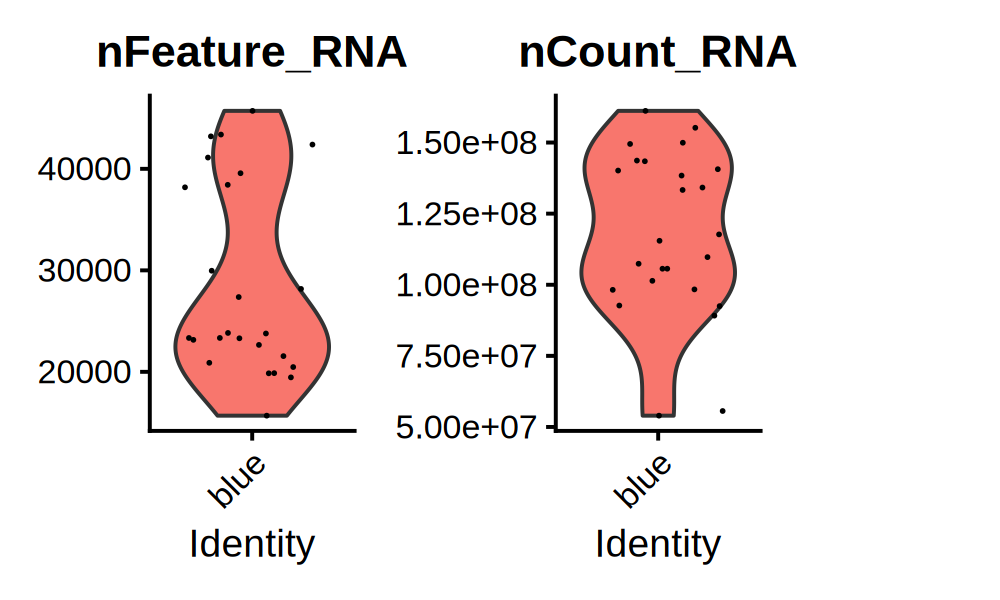

In [208]:
VlnPlot(oo, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)


Warning message in cor(x = data[, 1], y = data[, 2]):
"the standard deviation is zero"


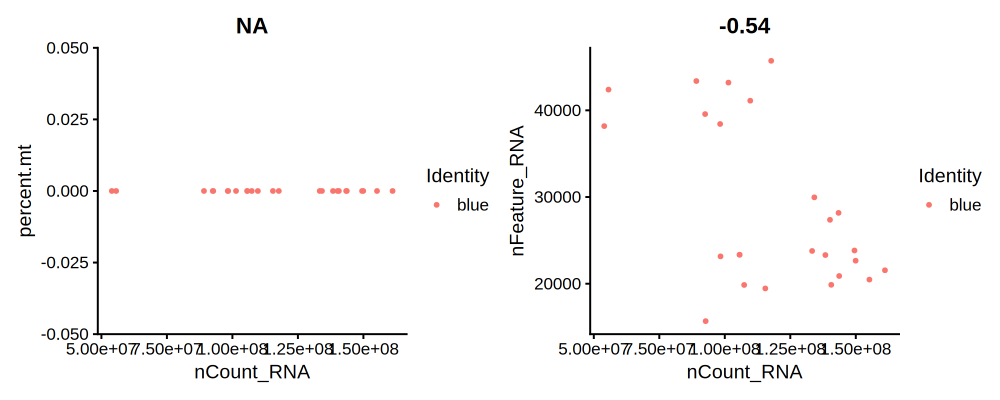

In [214]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
plot1 <- FeatureScatter(oo, feature1 = "nCount_RNA", feature2 = "percent.mt")
plot2 <- FeatureScatter(oo, feature1 = "nCount_RNA", feature2 = "nFeature_RNA")
plot1 + plot2


In [216]:
oo <- NormalizeData(oo, normalization.method = "LogNormalize", scale.factor = 10000)


Normalizing layer: counts



Finding variable features for layer counts

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
"ggrepel: 8 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


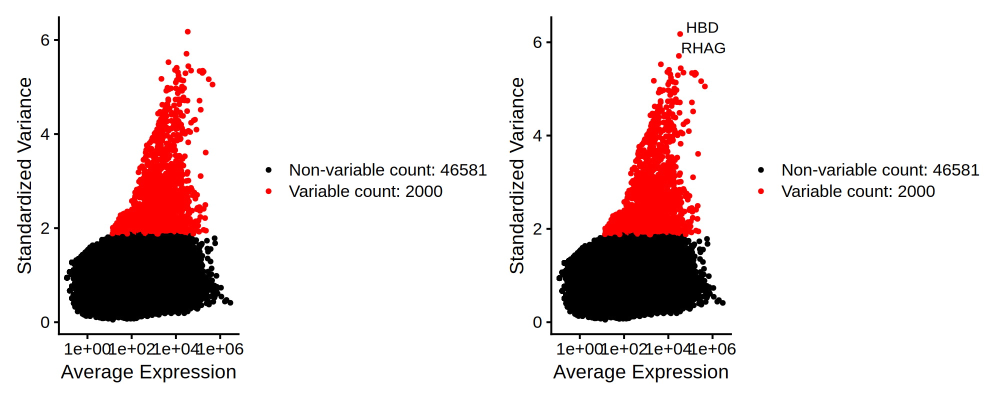

In [217]:
options(repr.plot.width = 10, repr.plot.height = 4, repr.plot.res = 200)
oo <- FindVariableFeatures(oo, selection.method = "vst", nfeatures = 2000)

# Identify the 10 most highly variable genes
top10 <- head(VariableFeatures(oo), 10)

# plot variable features with and without labels
plot1 <- VariableFeaturePlot(oo)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)
plot1 + plot2


In [218]:
all.genes <- rownames(oo)
oo <- ScaleData(oo, features = all.genes)

Centering and scaling data matrix



In [ ]:
my.contrasts = makeContrasts(MNX1vsCD34=MNX1 - CD34, MNX1vsAML=MNX1 - Others, AMLvsCD34 = Others - CD34, levels=design)
MNX1vsCD34 = glmQLFTest(fit, contrast=my.contrasts[,"MNX1vsCD34"])
MNX1vsCD34 = topTags(MNX1vsCD34, n=nrow(MNX1vsCD34$table), adjust.method="fdr")
